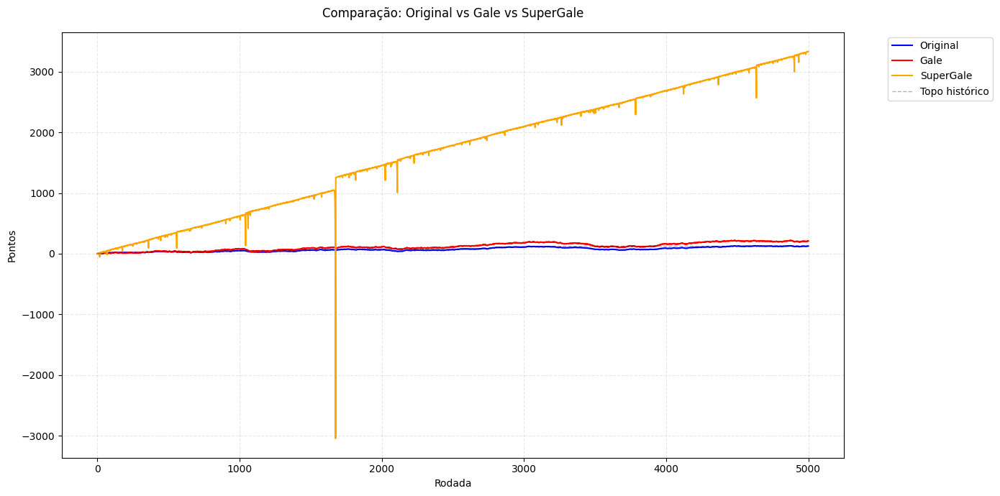

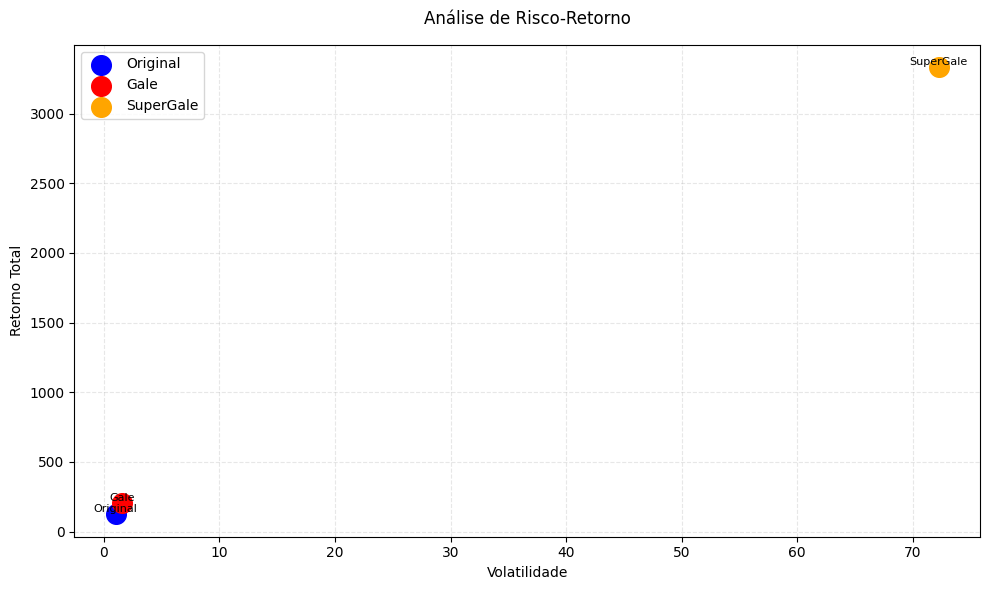

In [1]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    # Atualização das estratégias
    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:  # Vitória
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:  # Derrota
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if resultado < 0.5:  # Vitória
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:  # Derrota
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

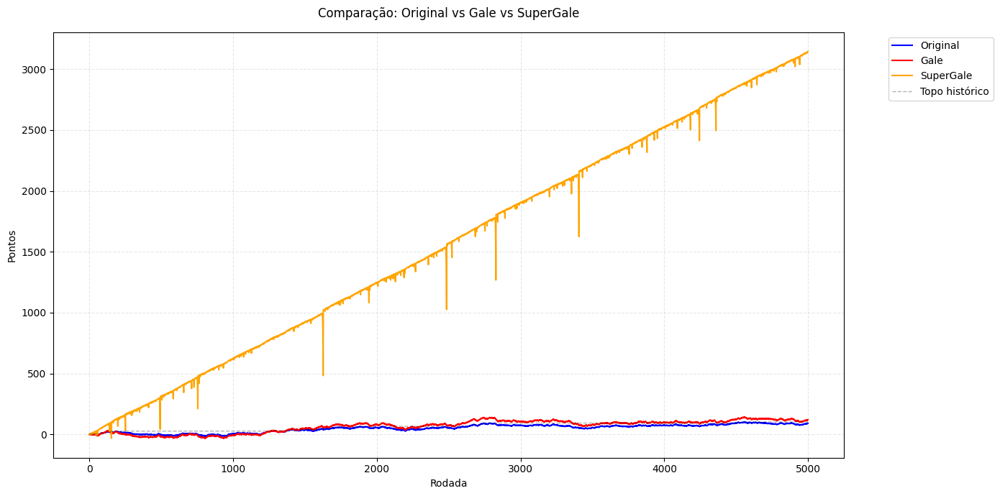

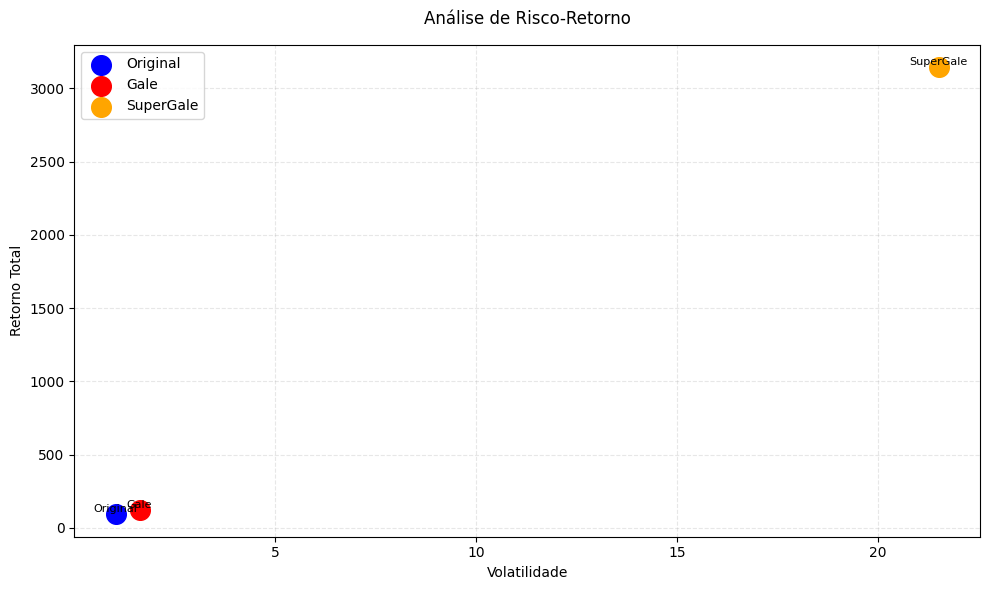

In [3]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 100  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

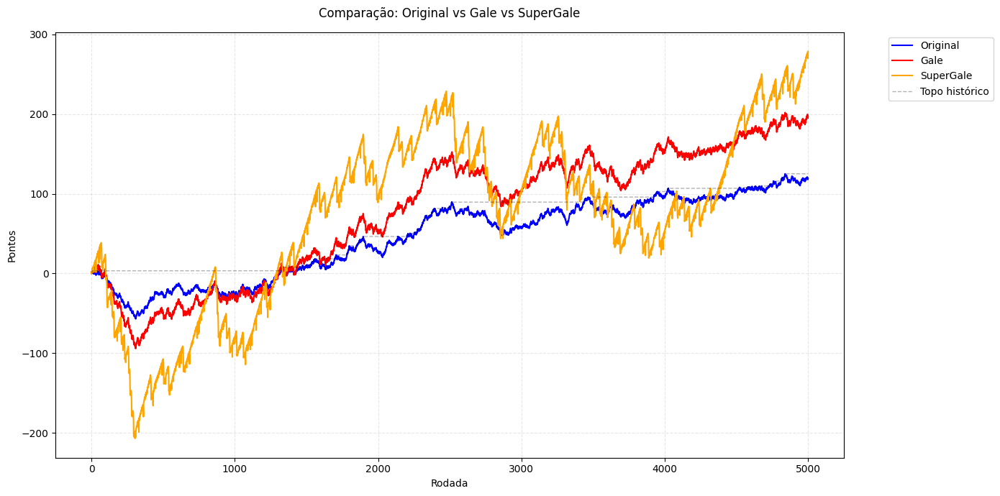

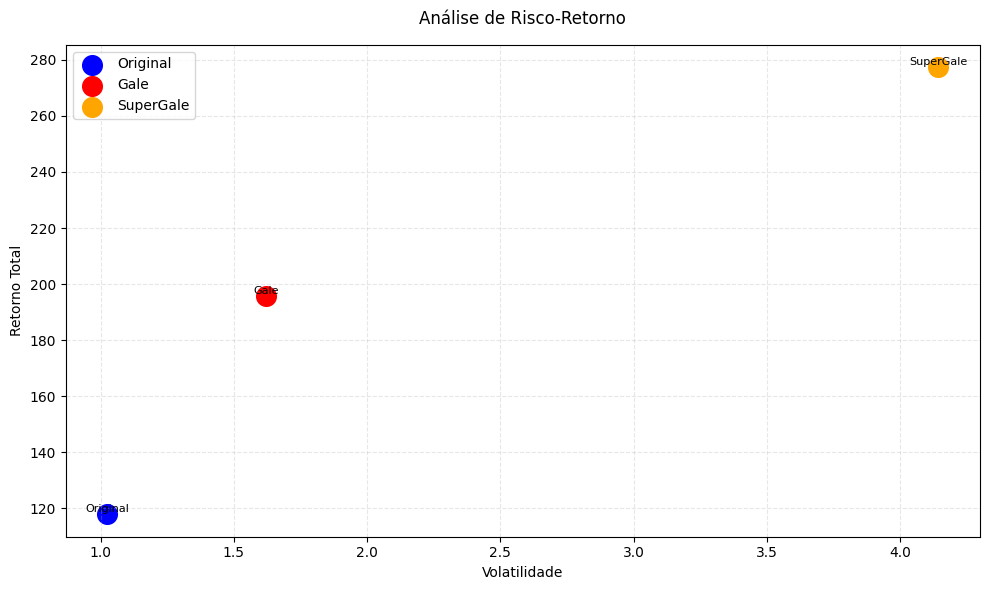

In [4]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 5  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

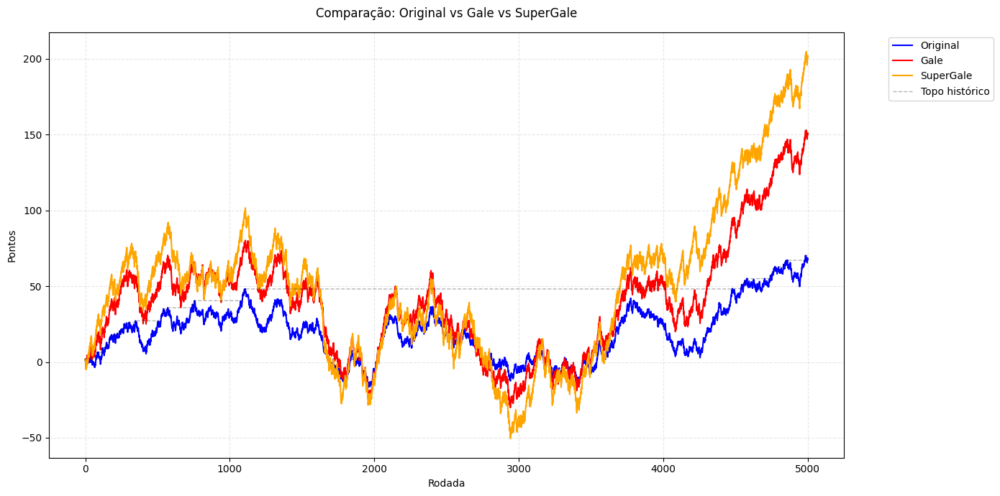

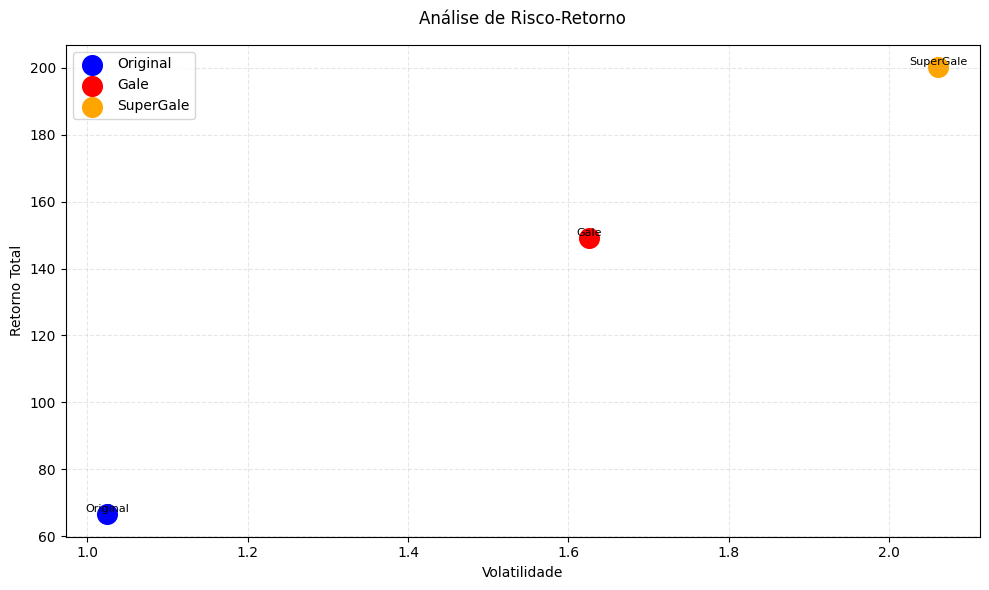

In [5]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 3  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

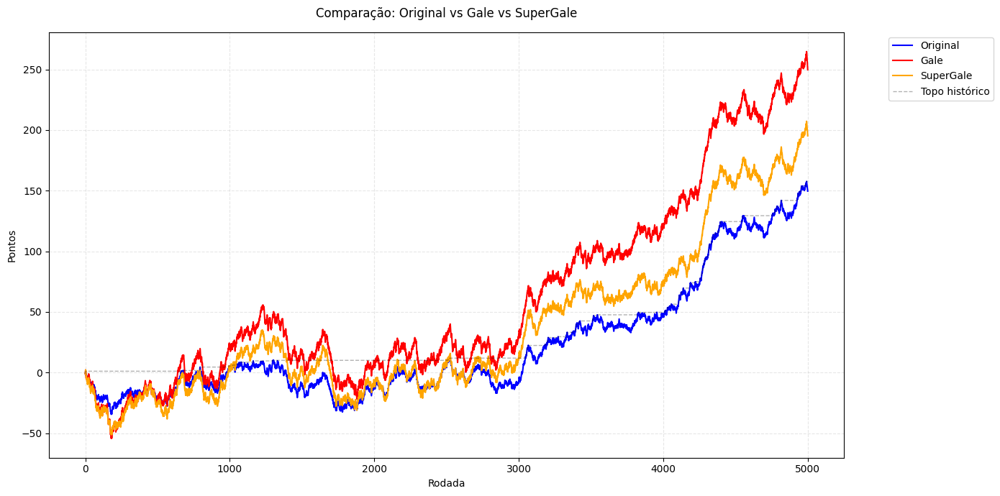

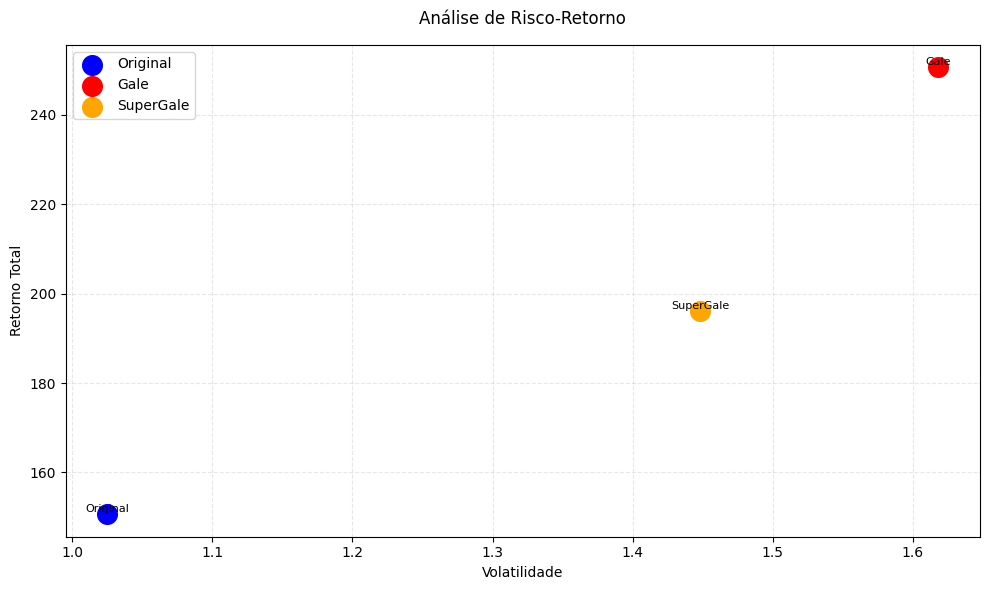

In [6]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 2  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

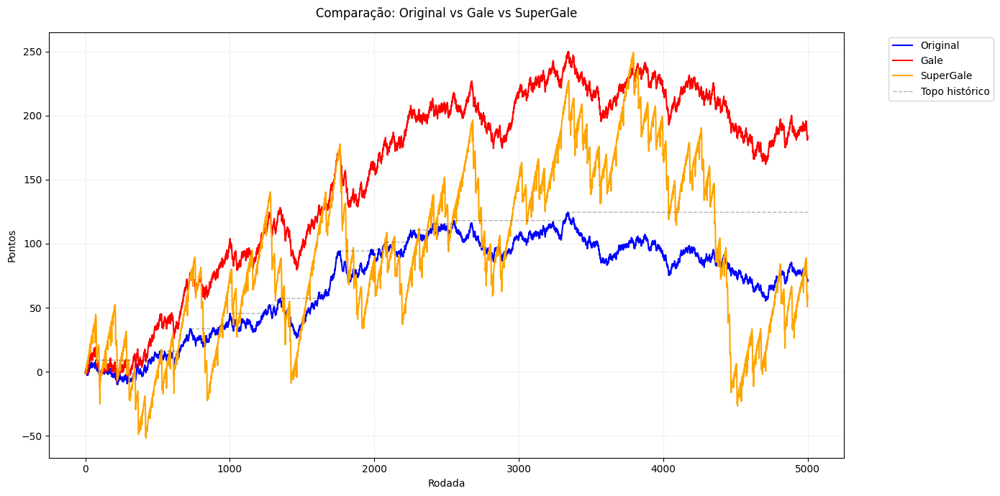

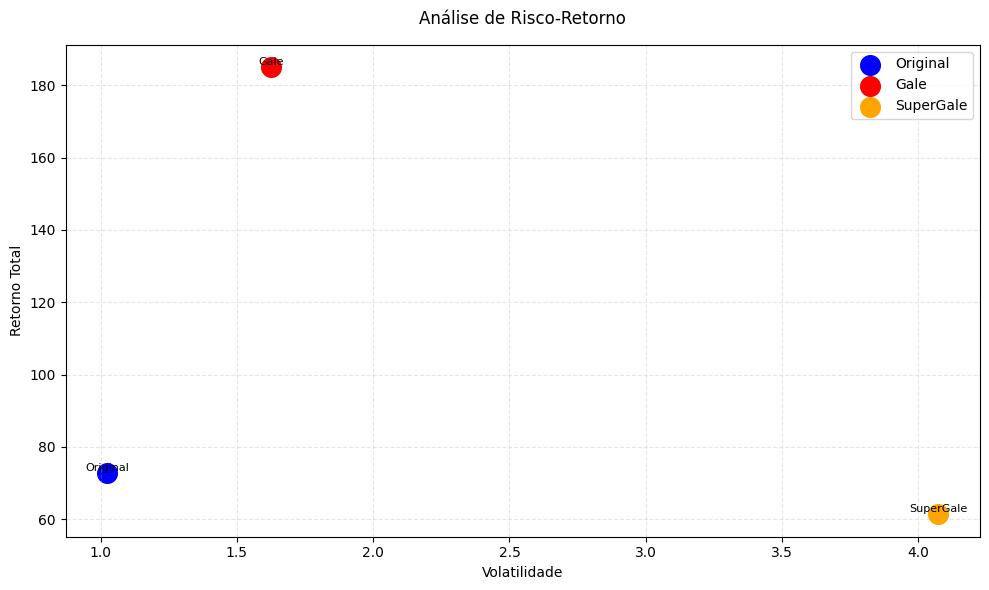

In [7]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 5  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

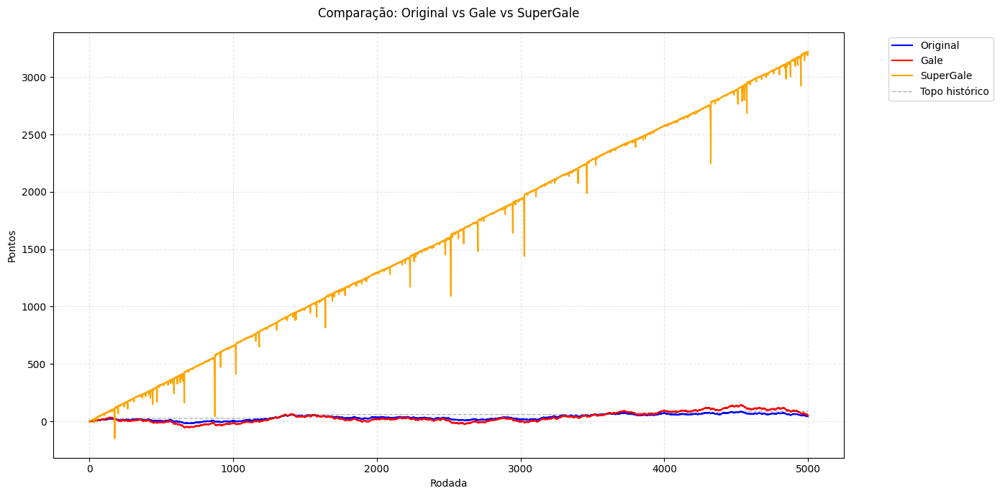

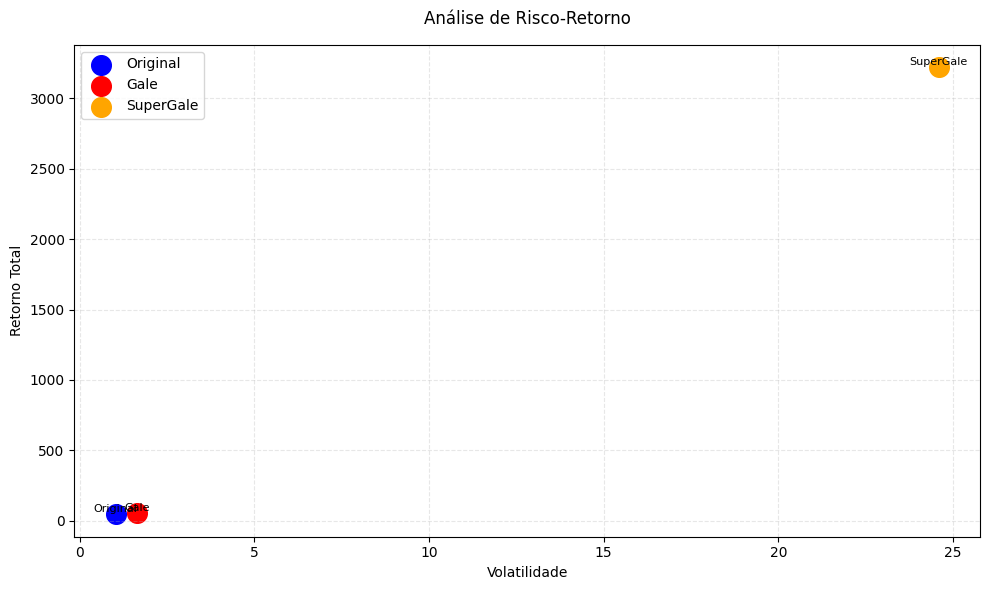

In [8]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 30  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

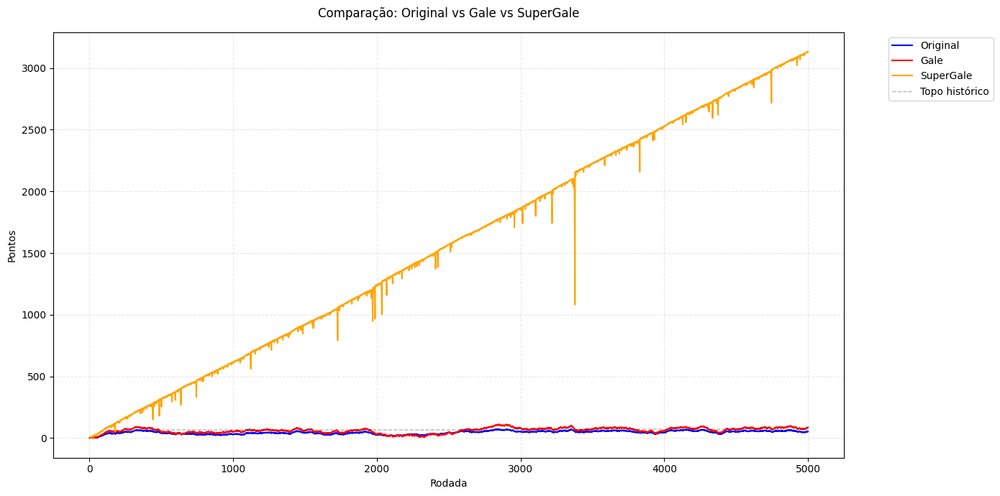

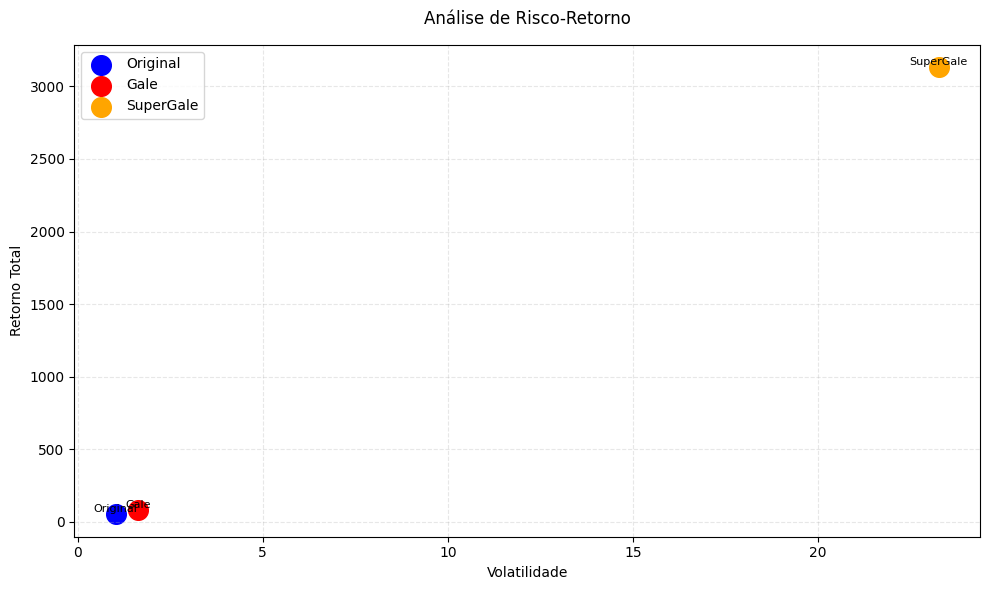

In [11]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 50  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

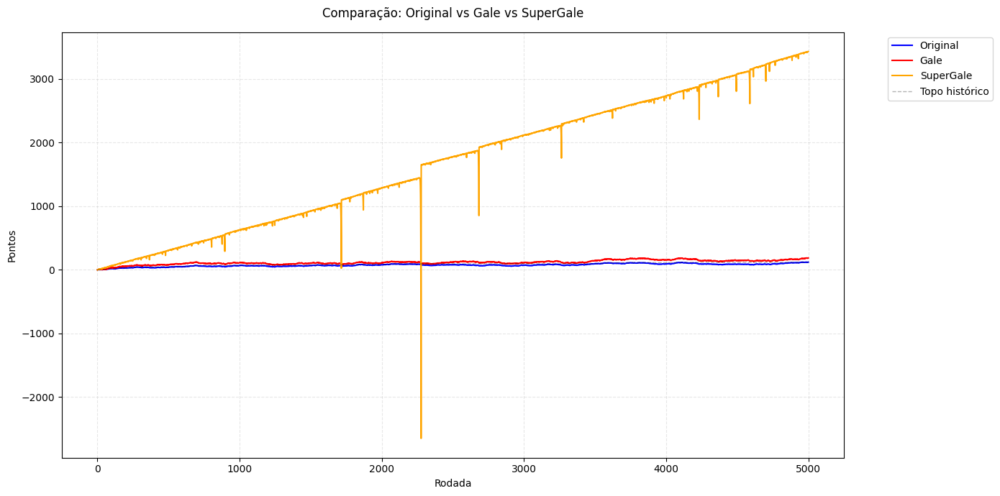

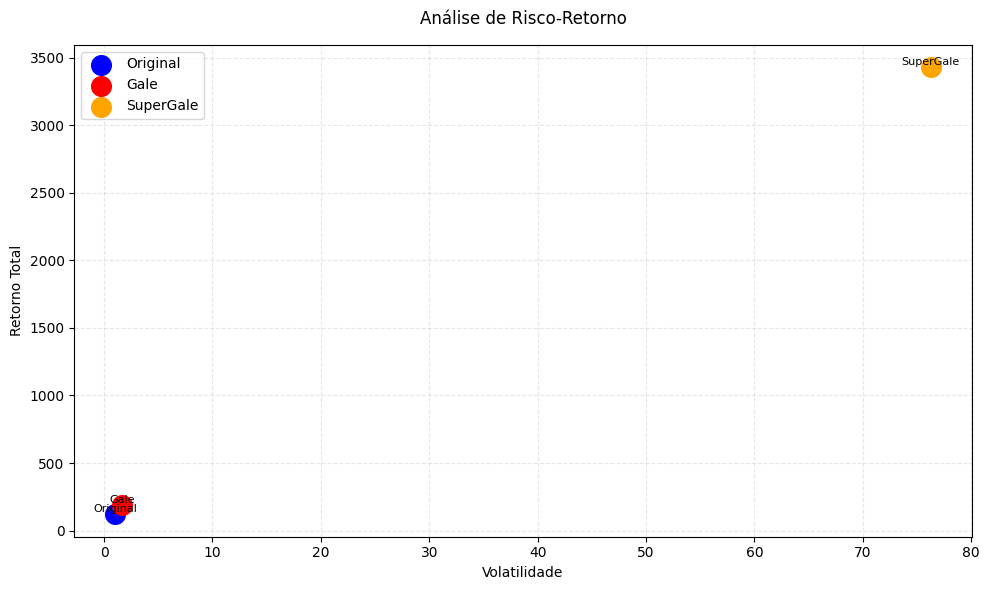

In [12]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 50  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

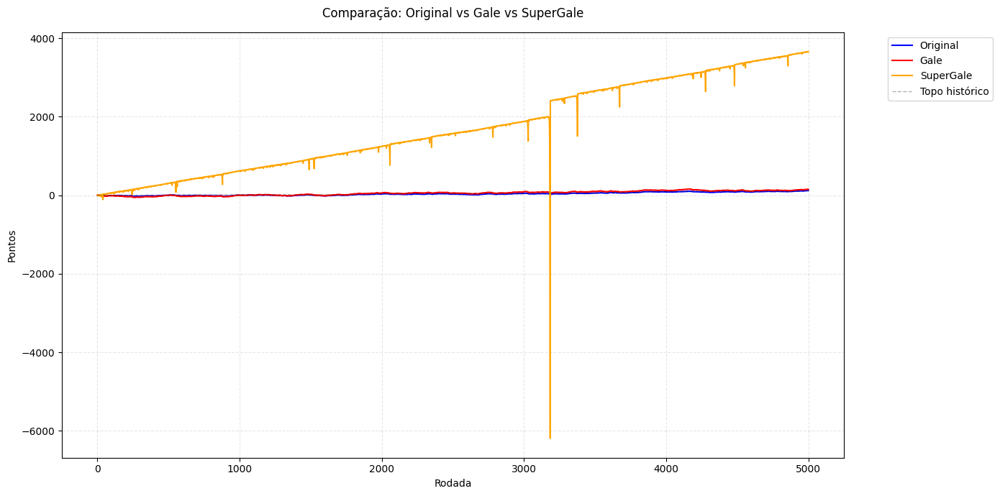

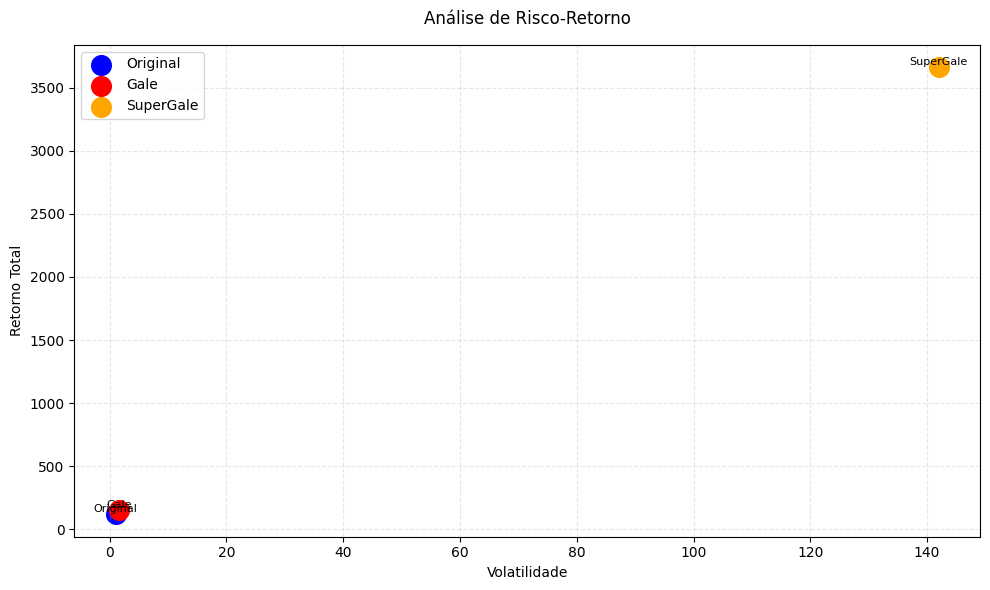

In [13]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 30  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

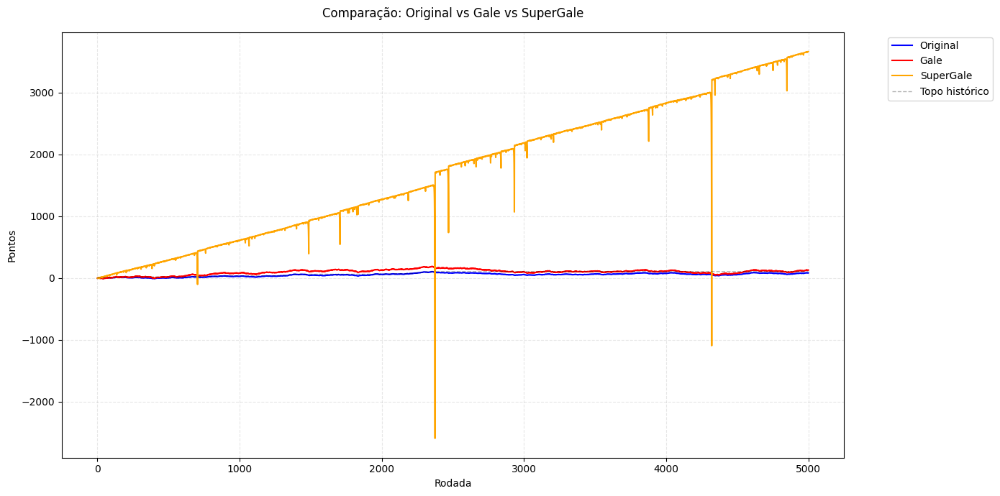

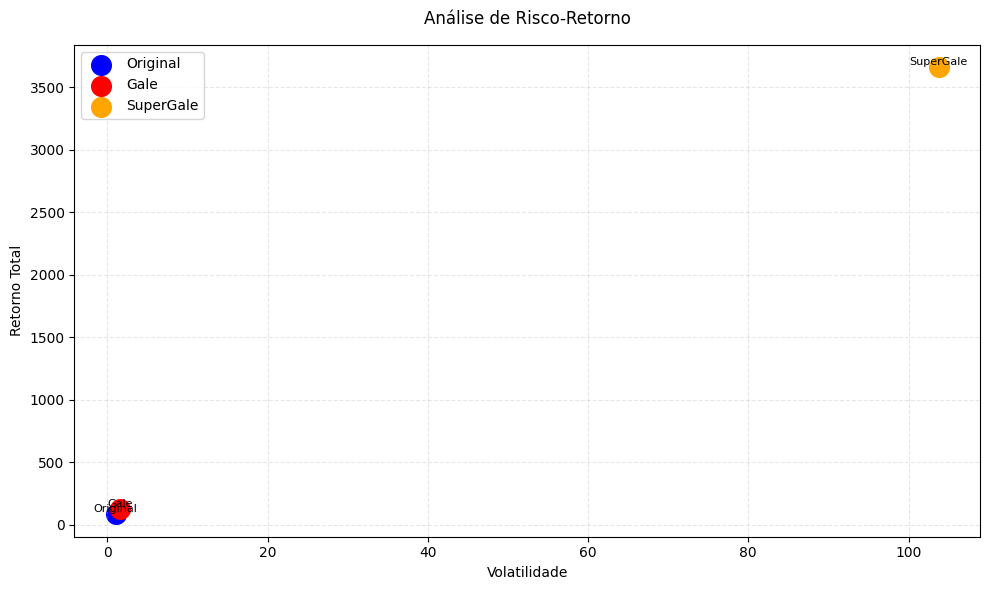

In [14]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 20  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

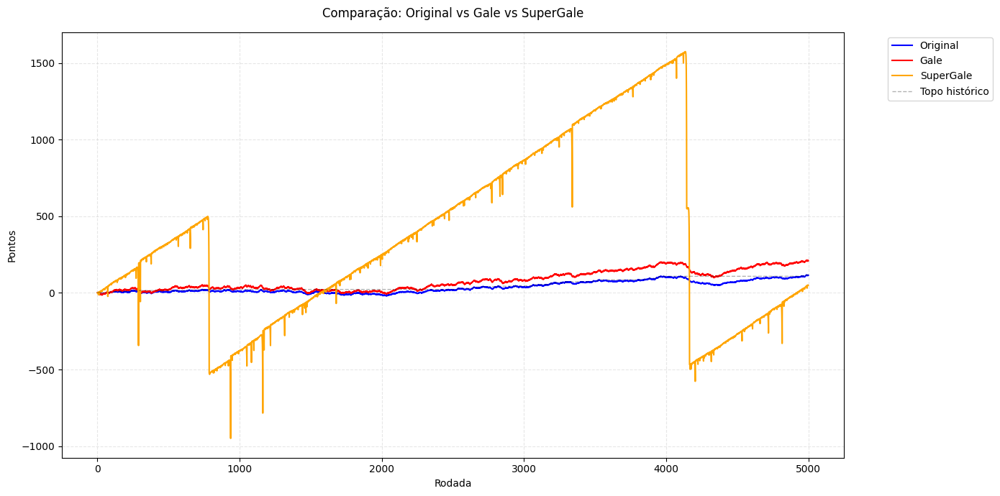

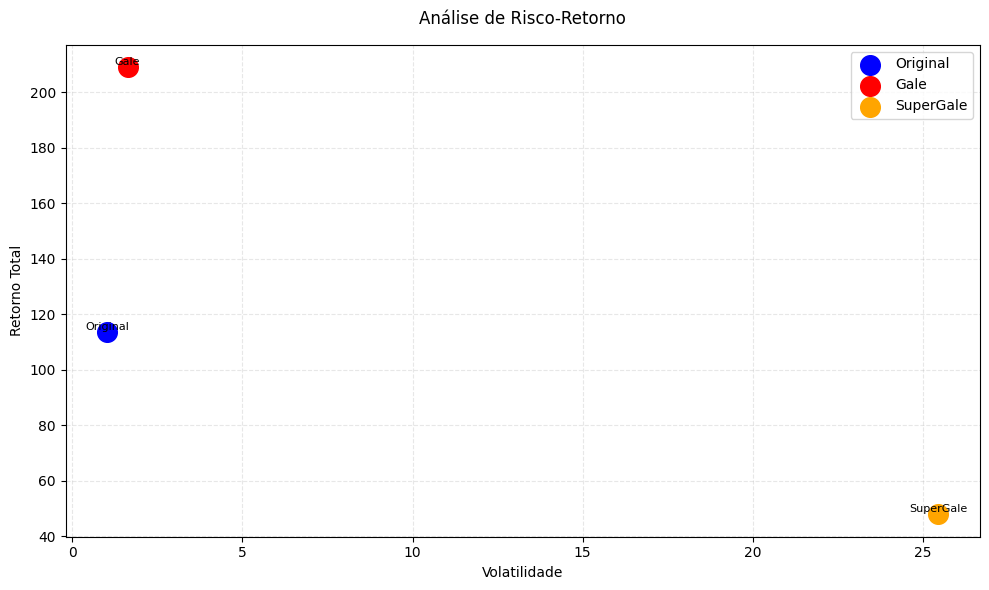

In [15]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 10  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

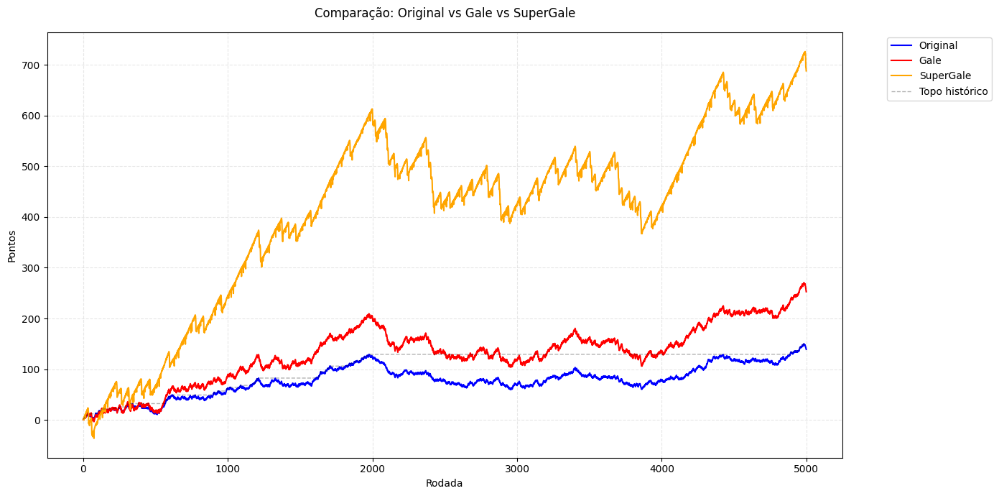

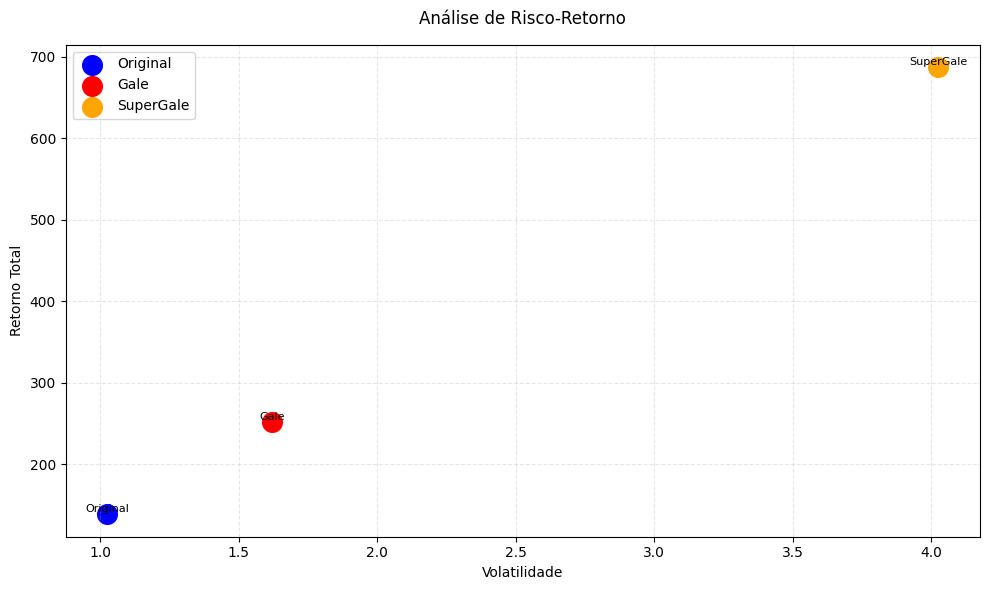

In [16]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 5  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

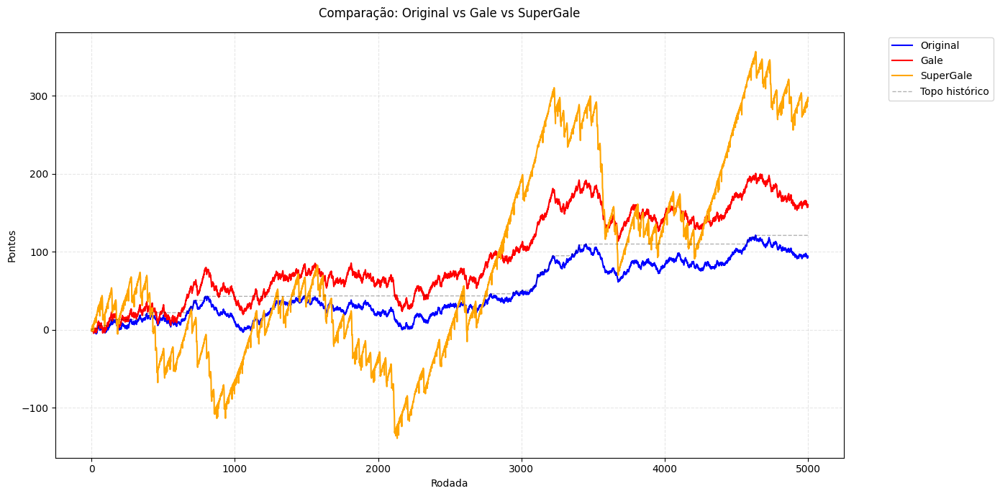

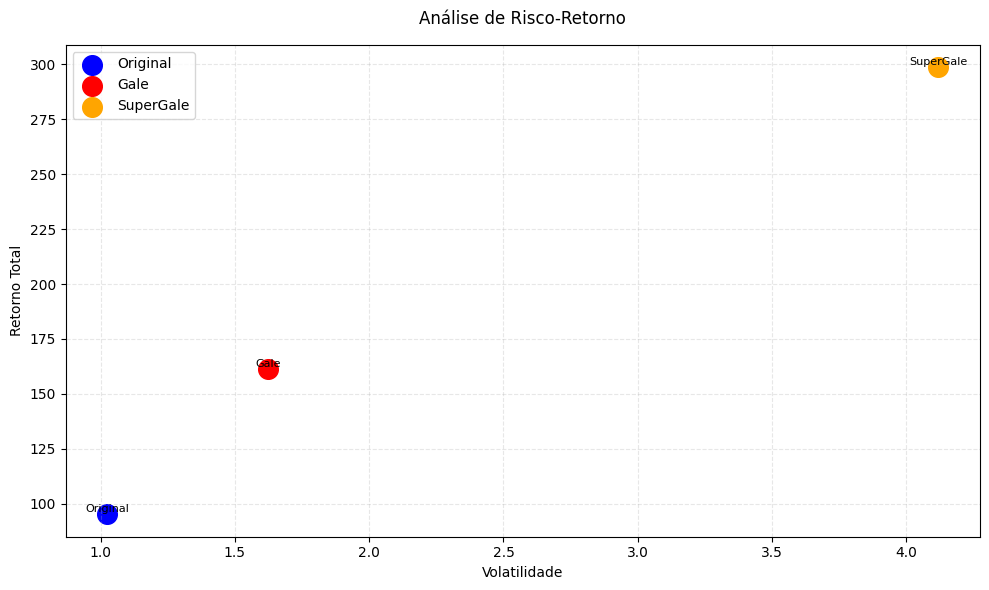

In [21]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 5  # <- NOVO: limite para resetar o SuperGale

# Inicialização
pontos = 0
evolucao_pontos = []
topo_historico = []

# Estratégias
estrategias = {
    'Original': {'pontos': 0, 'evolucao': [], 'cor': 'blue'},
    'Gale': {'pontos': 0, 'evolucao': [], 'cor': 'red', 'mult': 1},
    'SuperGale': {'pontos': 0, 'evolucao': [], 'cor': 'orange', 'perdas_consec': 0}
}

# Simulação
for rodada in range(num_rodadas):
    # Jogo original
    resultado = secrets.SystemRandom().random()
    pontos += ponto_cara if resultado < 0.5 else ponto_coroa
    evolucao_pontos.append(pontos)
    topo_historico.append(max(topo_historico[-1], pontos) if rodada > 0 else pontos)

    for nome, dados in estrategias.items():
        if nome == 'Original':
            dados['pontos'] = pontos
            dados['evolucao'].append(pontos)
            continue

        if nome == 'Gale':
            if resultado < 0.5:
                dados['pontos'] += ponto_cara * dados['mult']
                dados['mult'] = 1
            else:
                dados['pontos'] += ponto_coroa * dados['mult']
                dados['mult'] = 2
            dados['evolucao'].append(dados['pontos'])
            continue

        if nome == 'SuperGale':
            if dados['perdas_consec'] >= limite_perdas_supergale:
                dados['perdas_consec'] = 0  # <- NOVO: reset após muitas perdas

            if resultado < 0.5:
                dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] = 0
            else:
                dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                dados['perdas_consec'] += 1
            dados['evolucao'].append(dados['pontos'])

# Gráfico 1: Comparação de Linhas
plt.figure(figsize=(14, 7))
ordem_estrategias = ['Original', 'Gale', 'SuperGale']
cores = ['blue', 'red', 'orange']

for nome, cor in zip(ordem_estrategias, cores):
    plt.plot(estrategias[nome]['evolucao'], color=cor, label=nome, linewidth=1.5)

plt.plot(topo_historico, 'k--', label='Topo histórico', linewidth=1, alpha=0.3)
plt.title('Comparação: Original vs Gale vs SuperGale', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno
plt.figure(figsize=(10, 6))
for nome in ordem_estrategias:
    dados = estrategias[nome]
    retorno = dados['evolucao'][-1] - dados['evolucao'][0]
    volatilidade = np.std(np.diff(dados['evolucao']))
    plt.scatter(volatilidade, retorno, s=200, color=dados['cor'], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=8, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

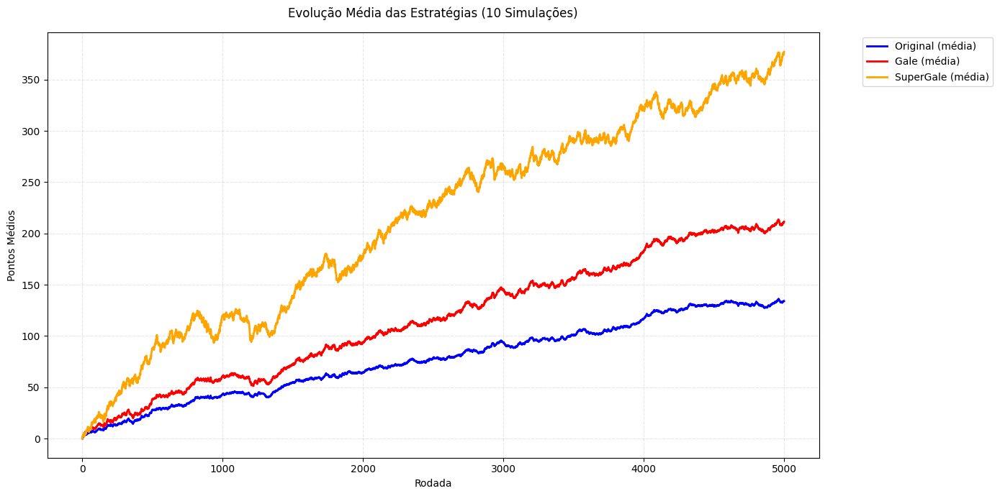

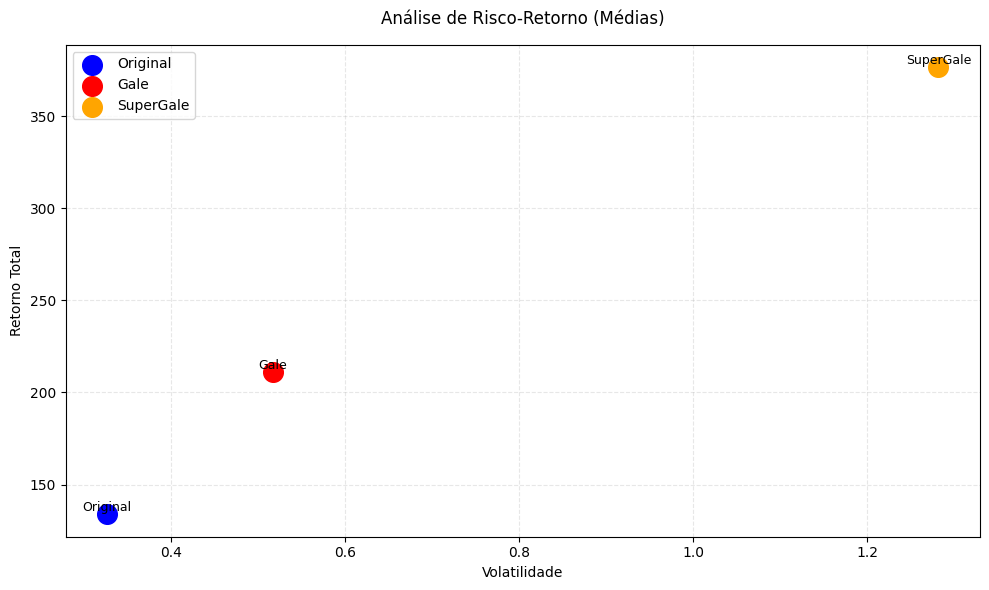

In [22]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

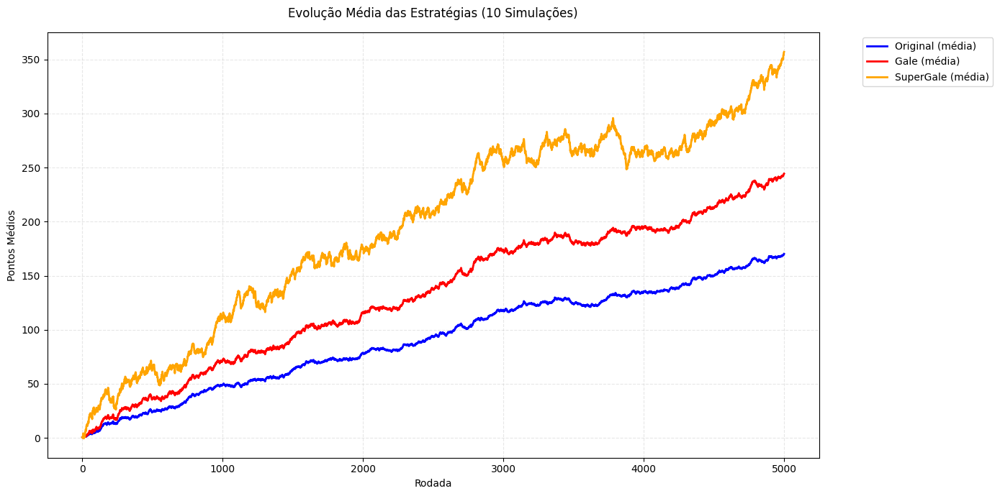

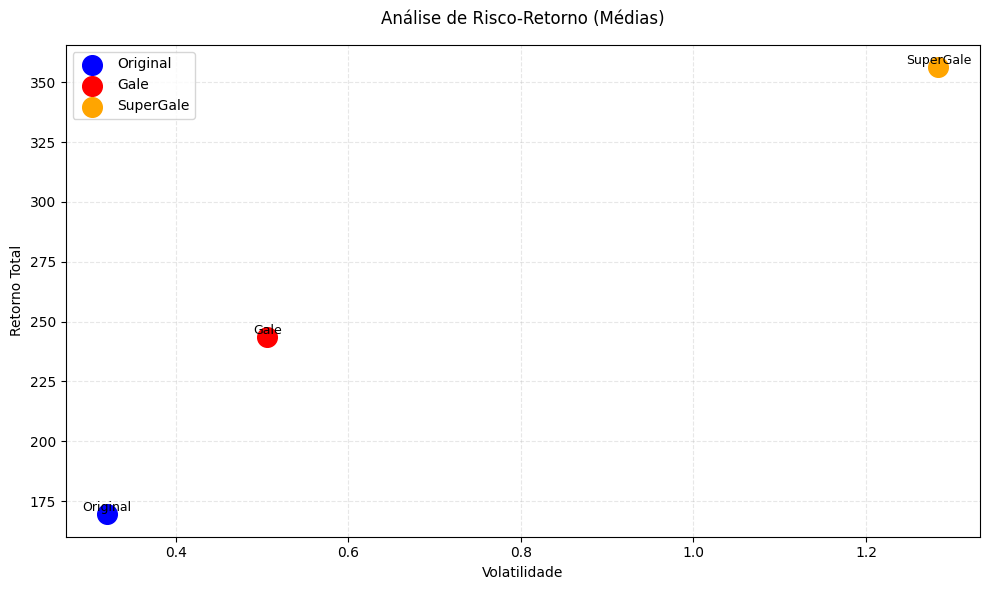

In [23]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

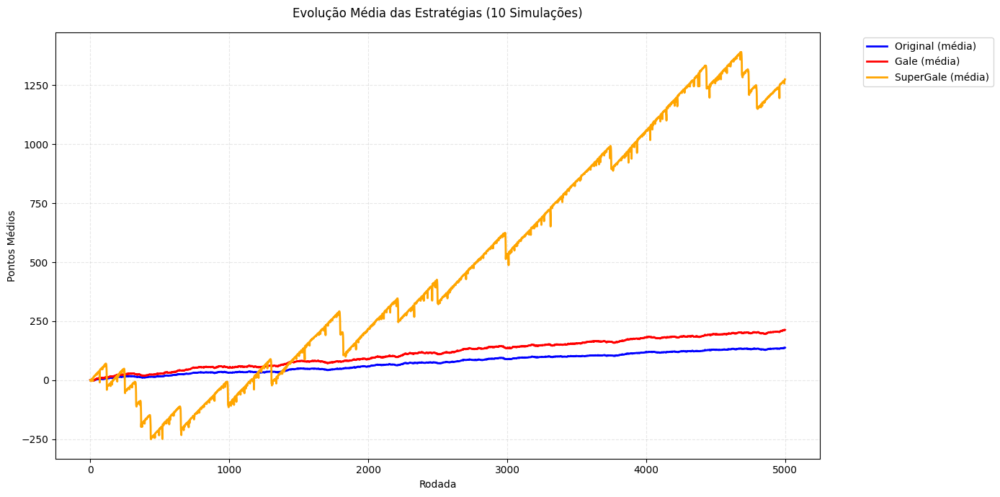

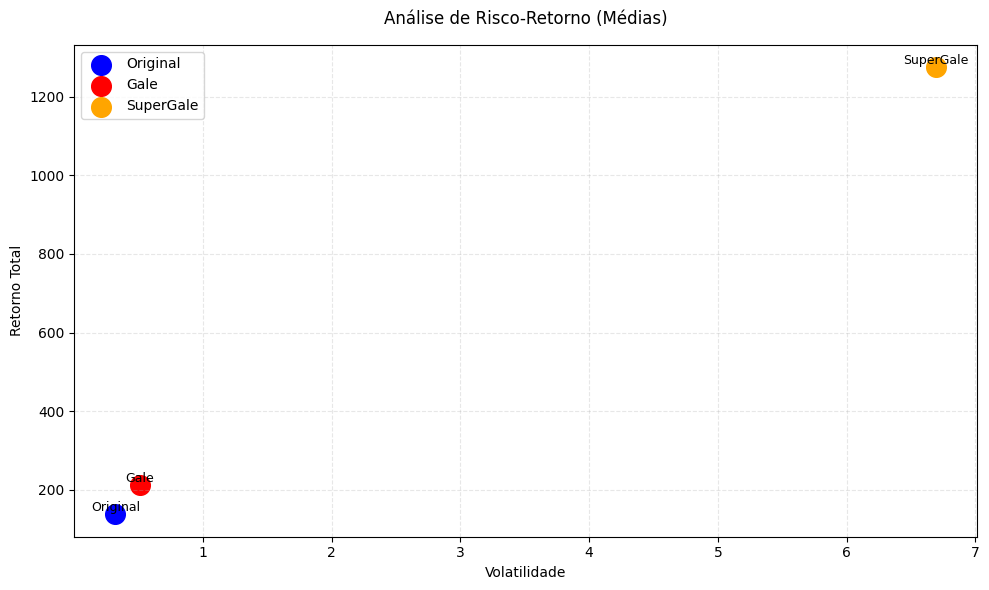

In [24]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 10

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

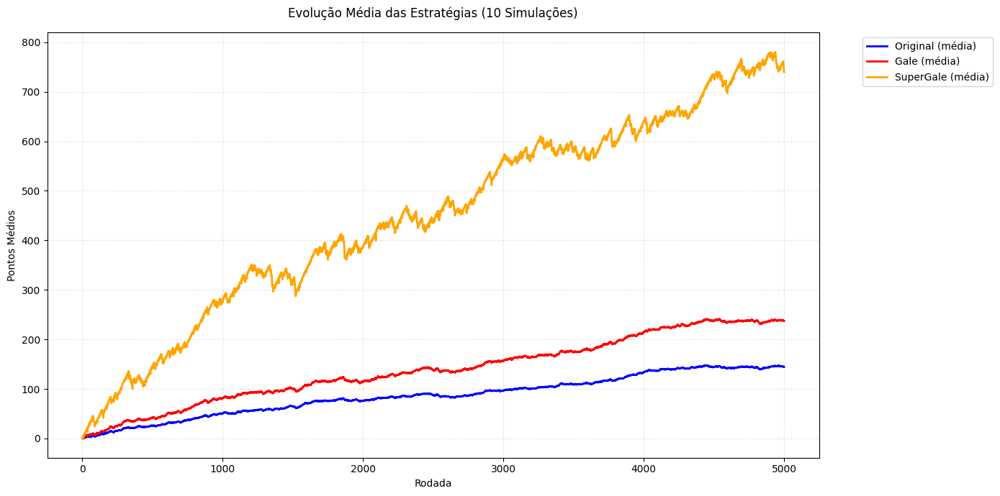

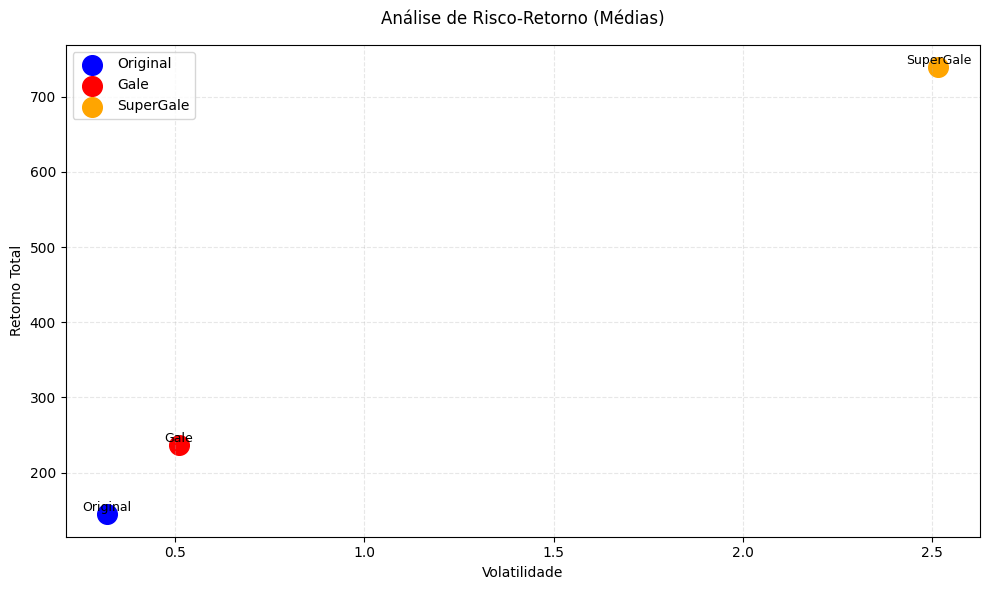

In [25]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 7

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

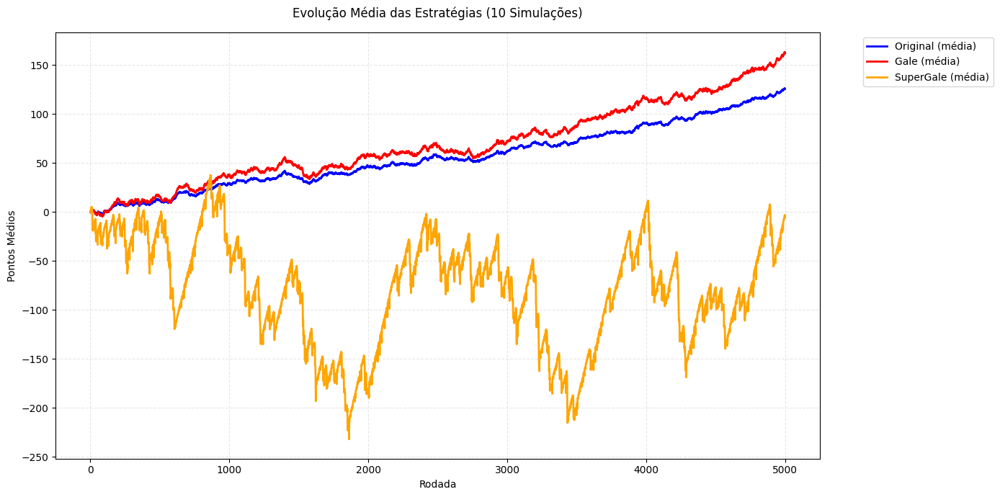

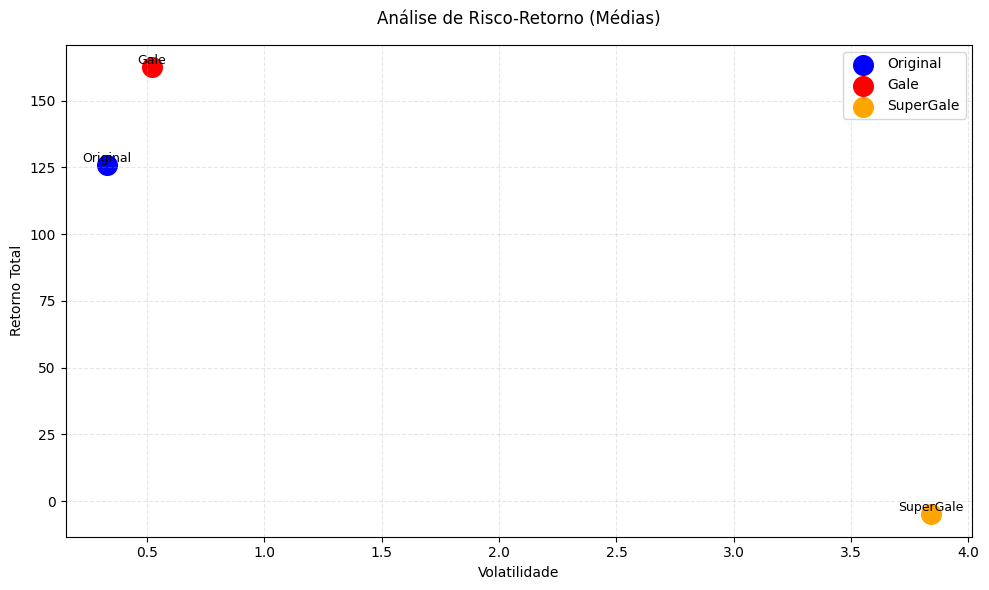

In [26]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 8

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

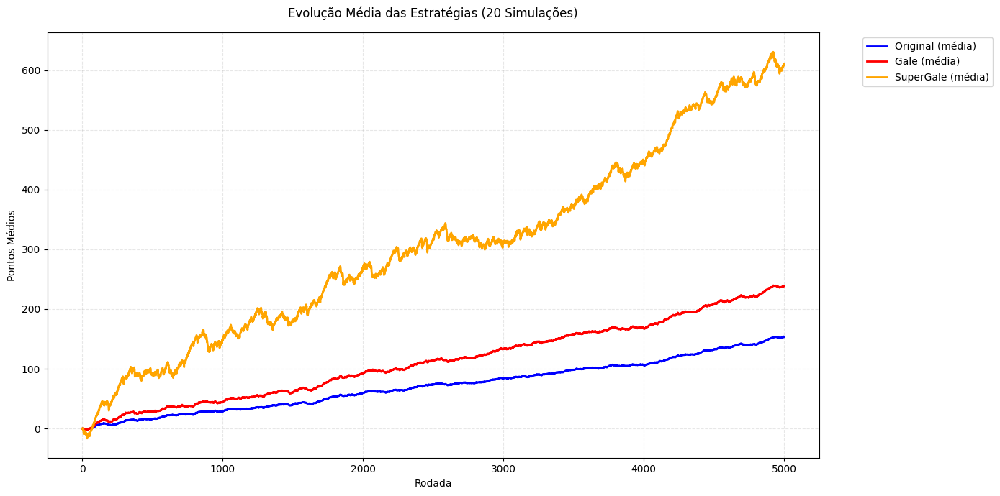

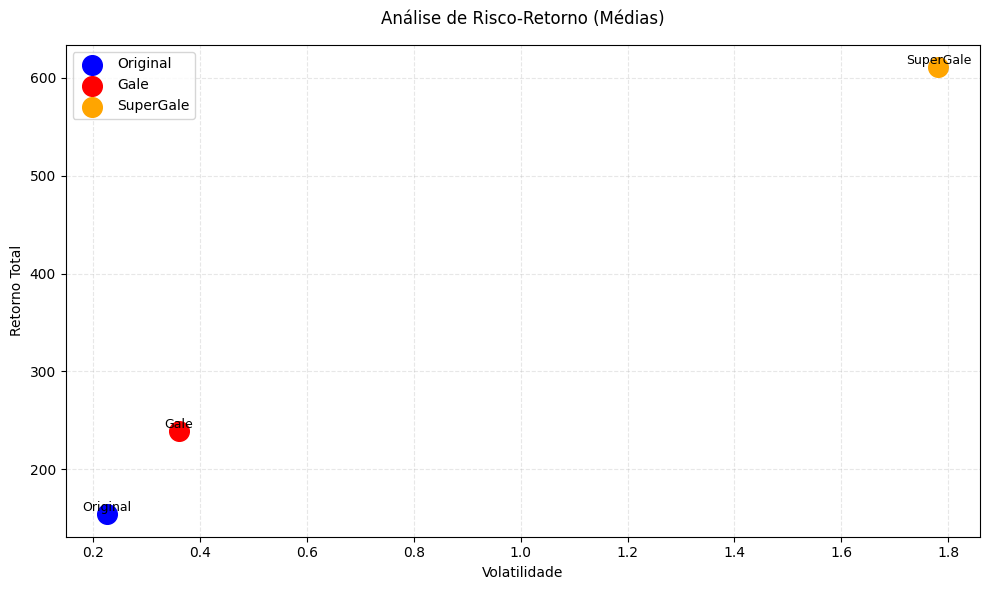

In [27]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 20
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 7

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

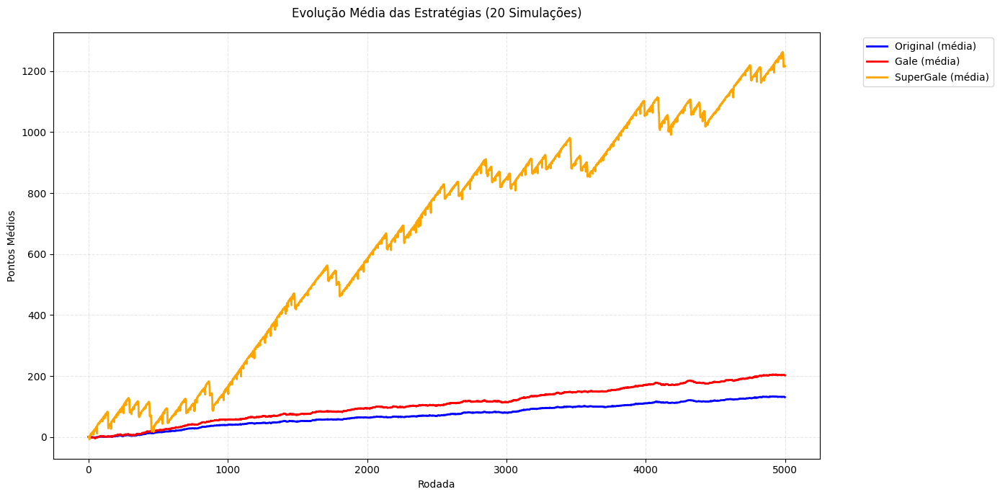

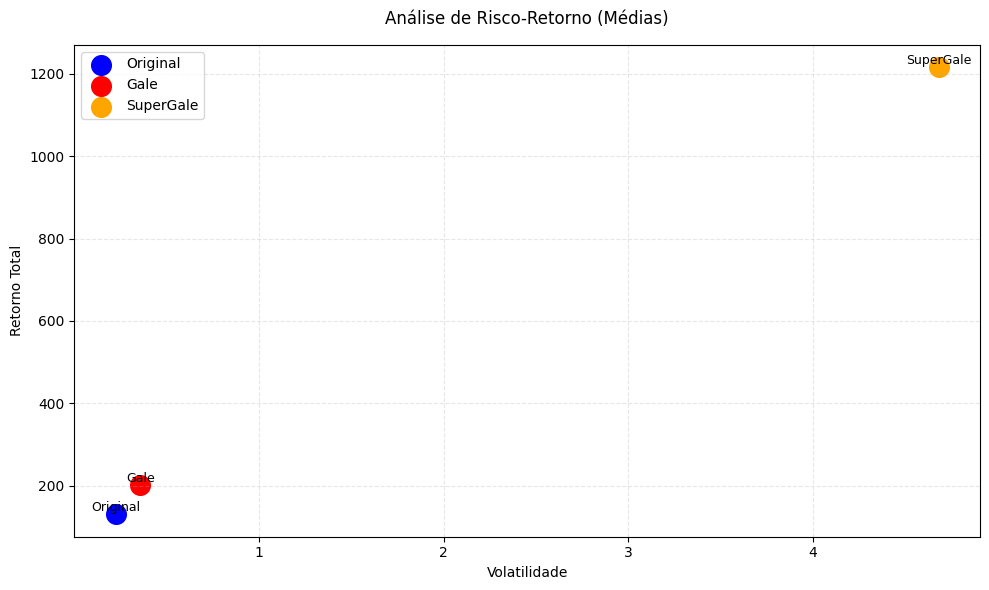

In [28]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 20
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 10

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

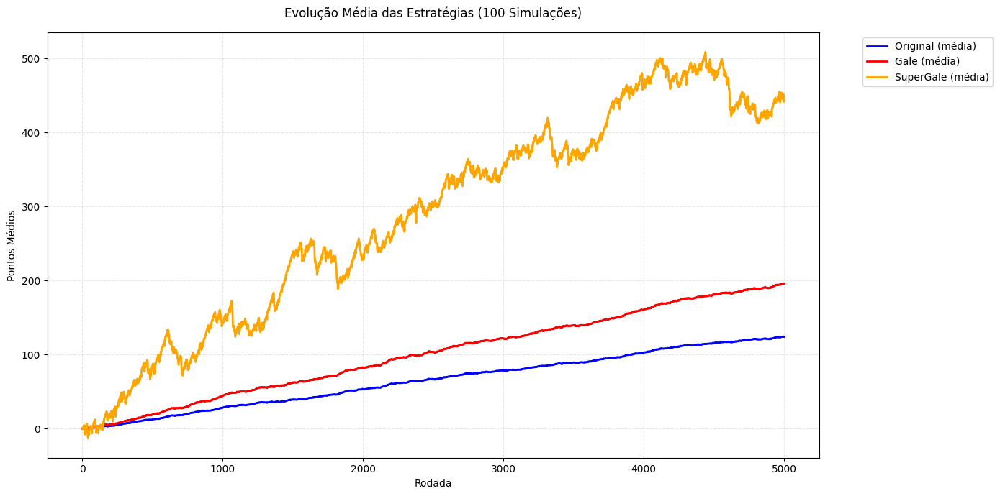

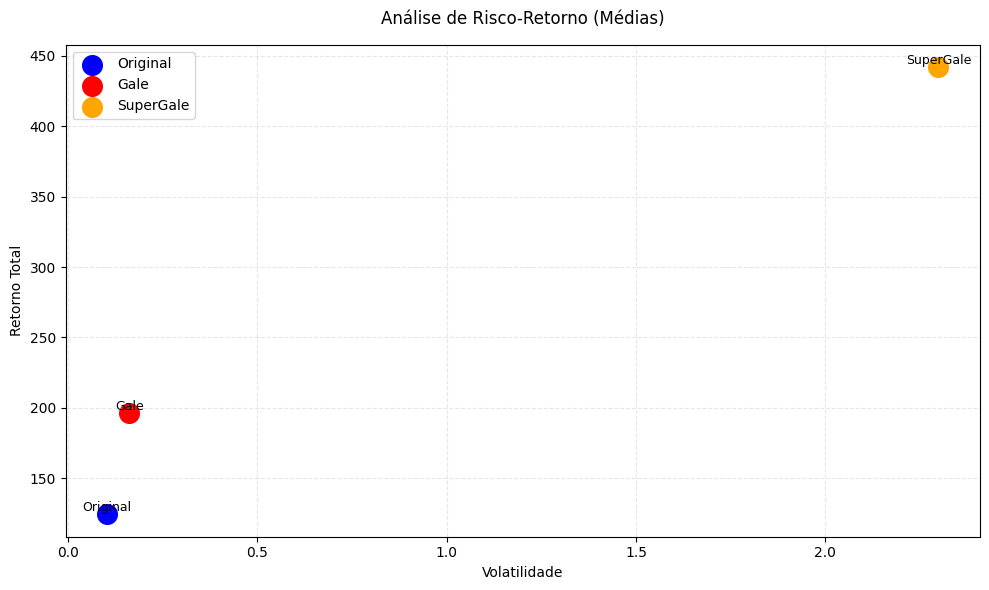

In [31]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 100
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 10

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

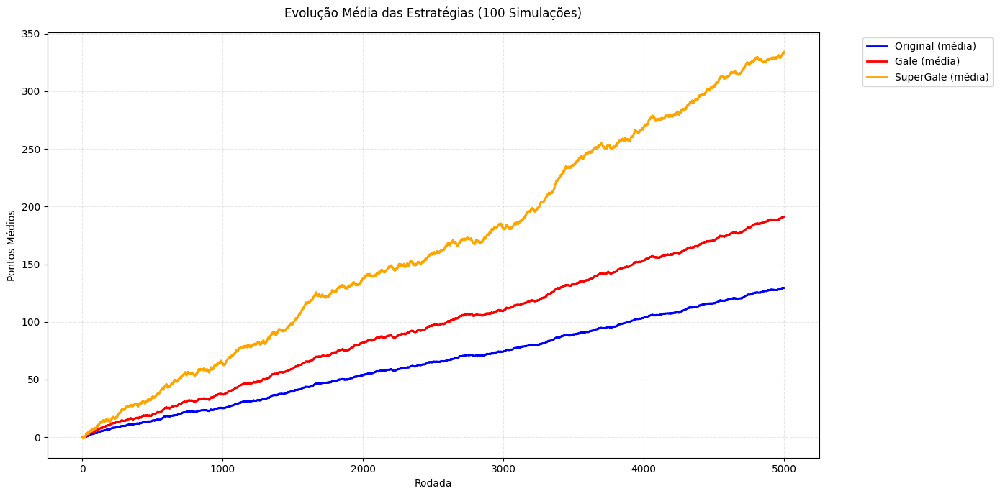

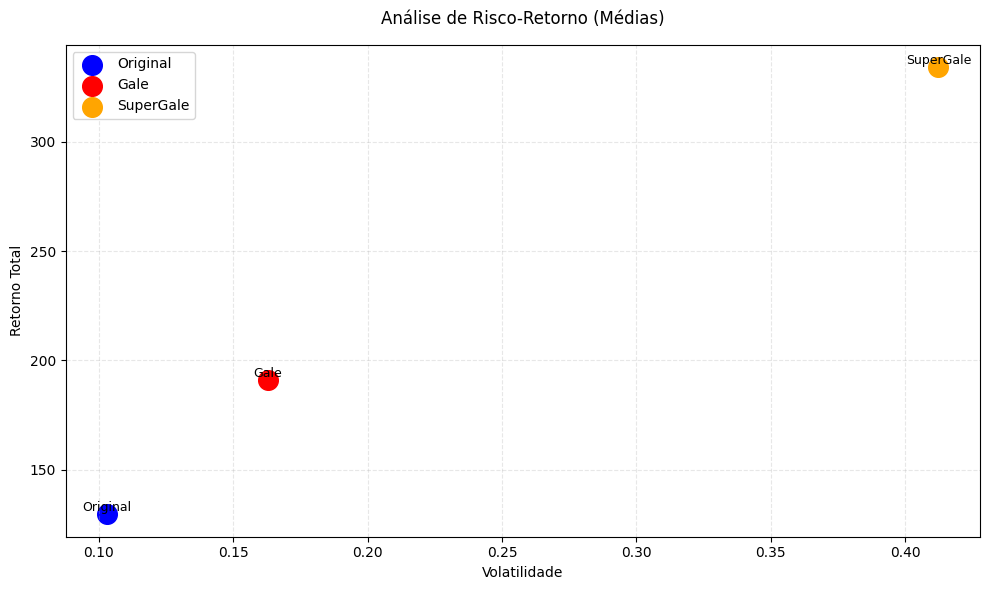

In [33]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 100
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

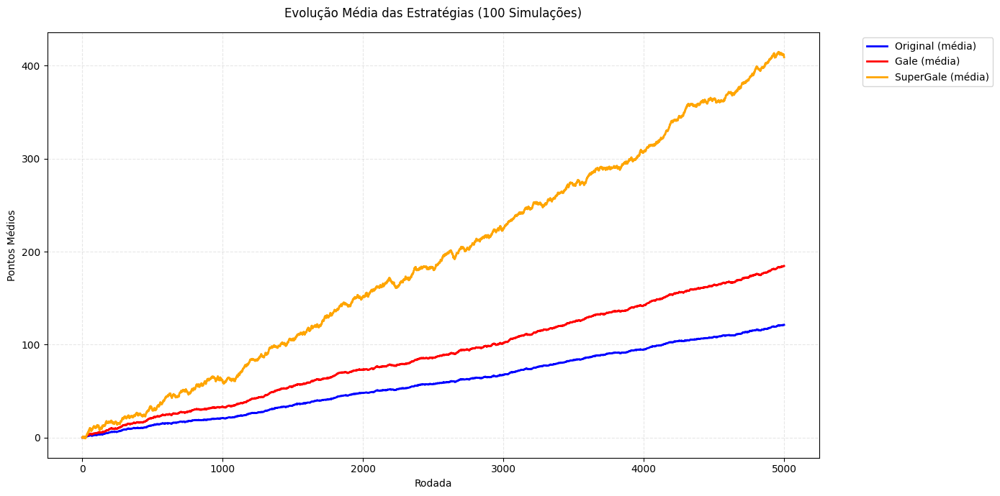

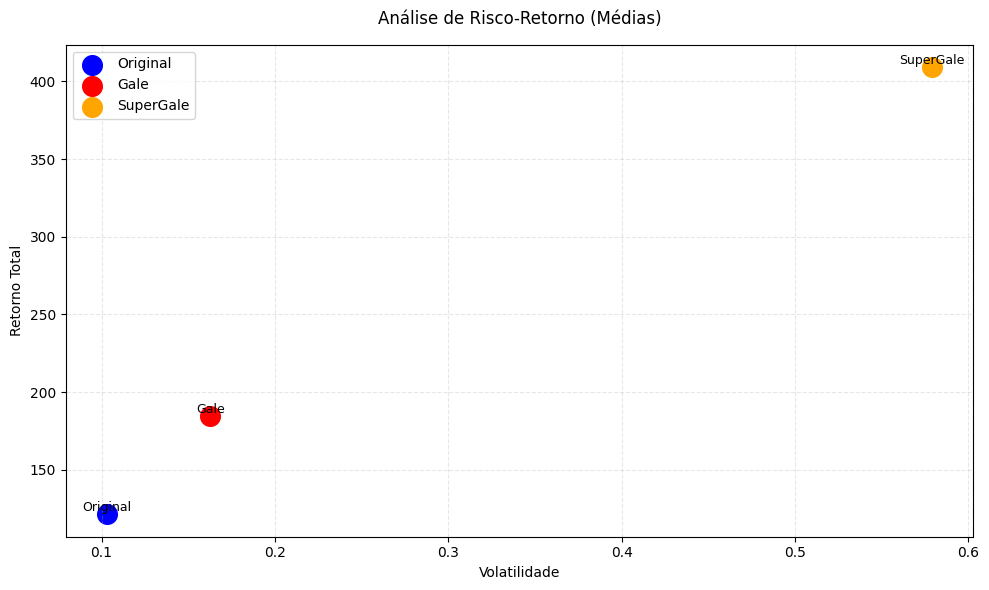

In [34]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 100
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 6

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

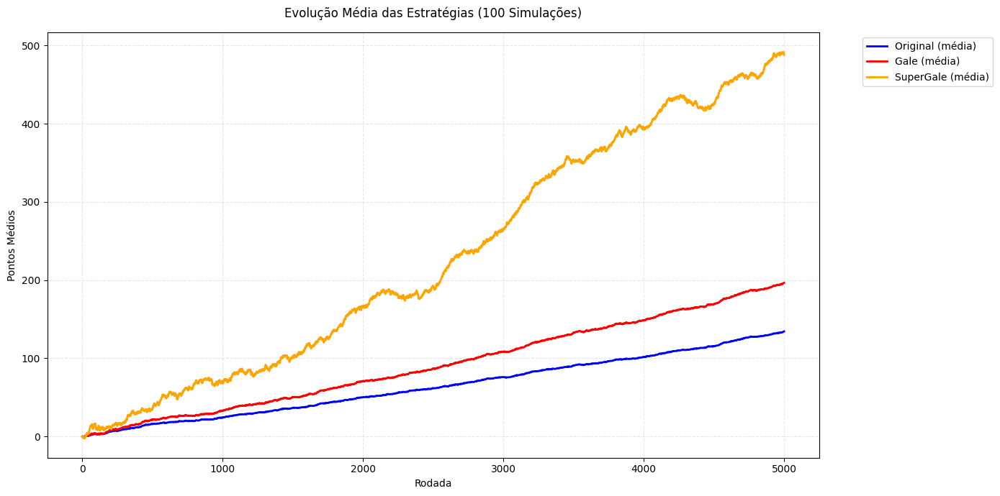

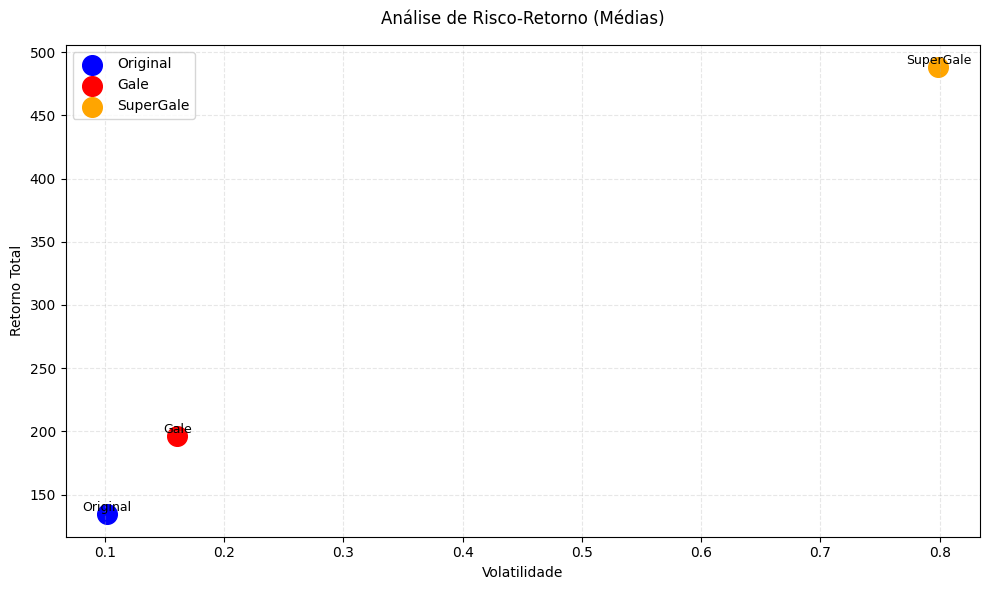

In [35]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 100
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 7

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

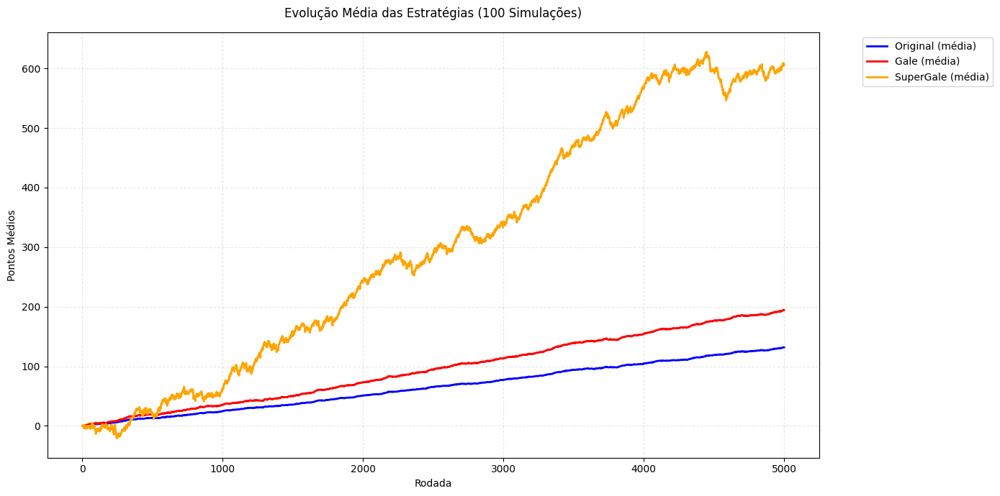

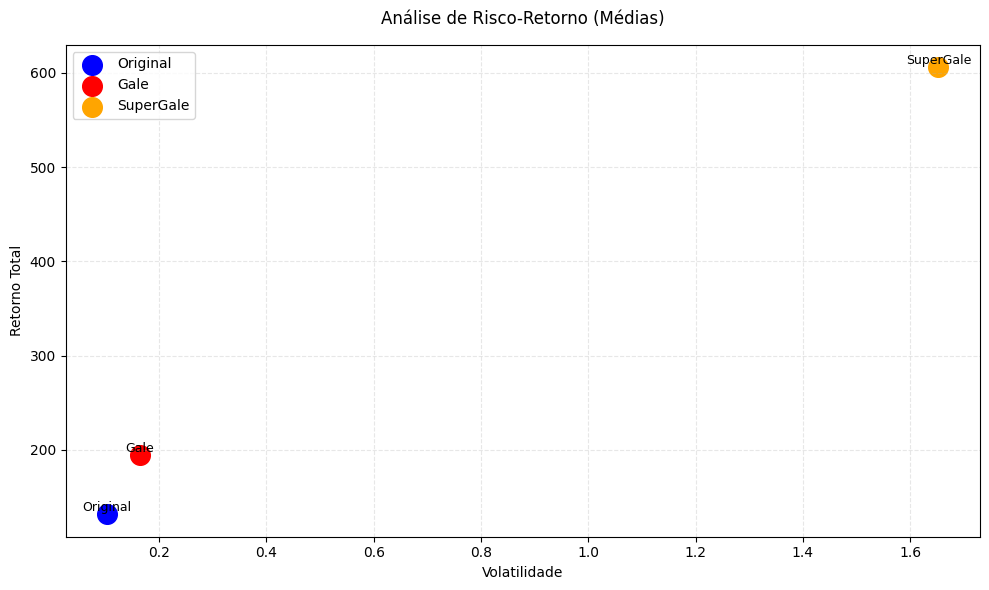

In [37]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 100
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 9

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

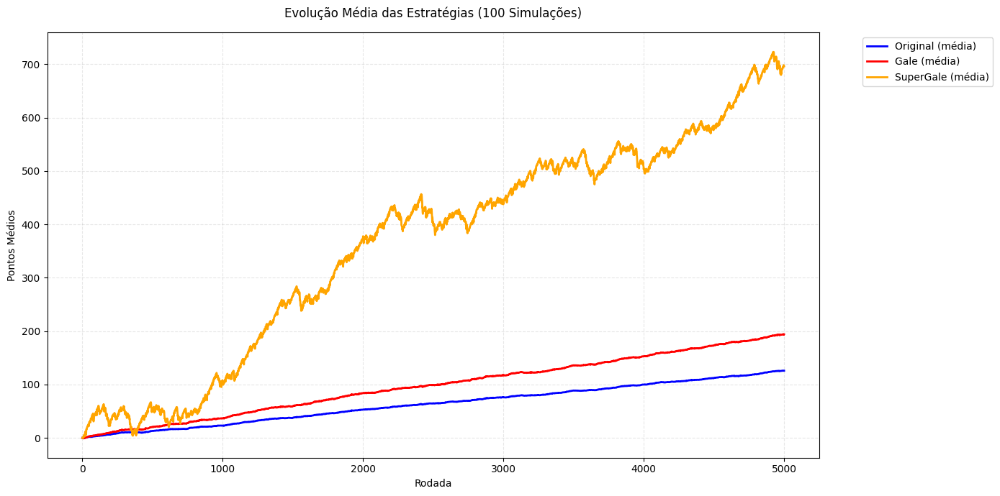

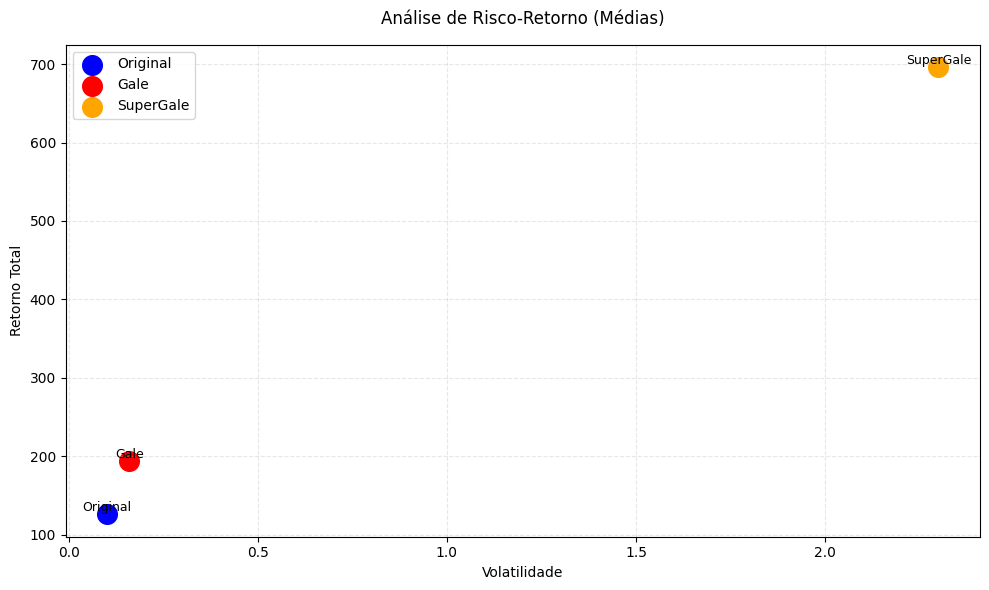

In [38]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 100
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 10

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

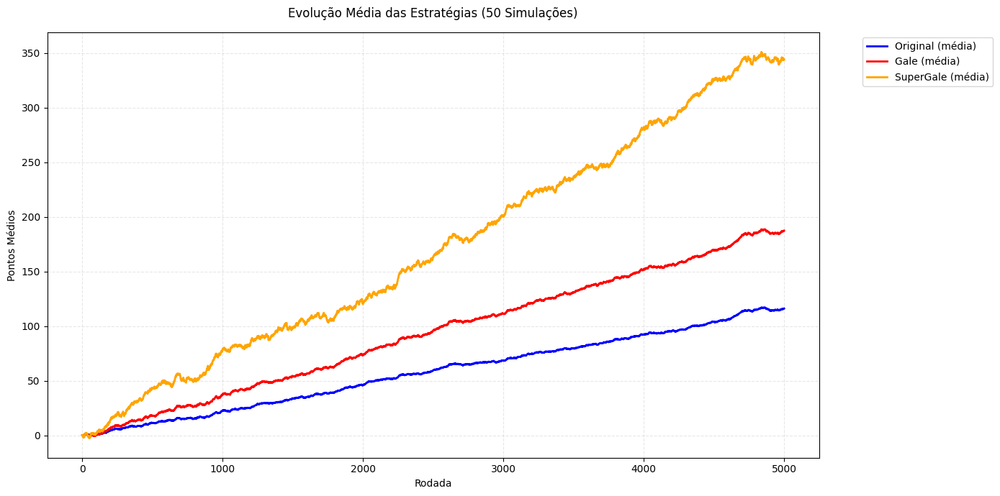

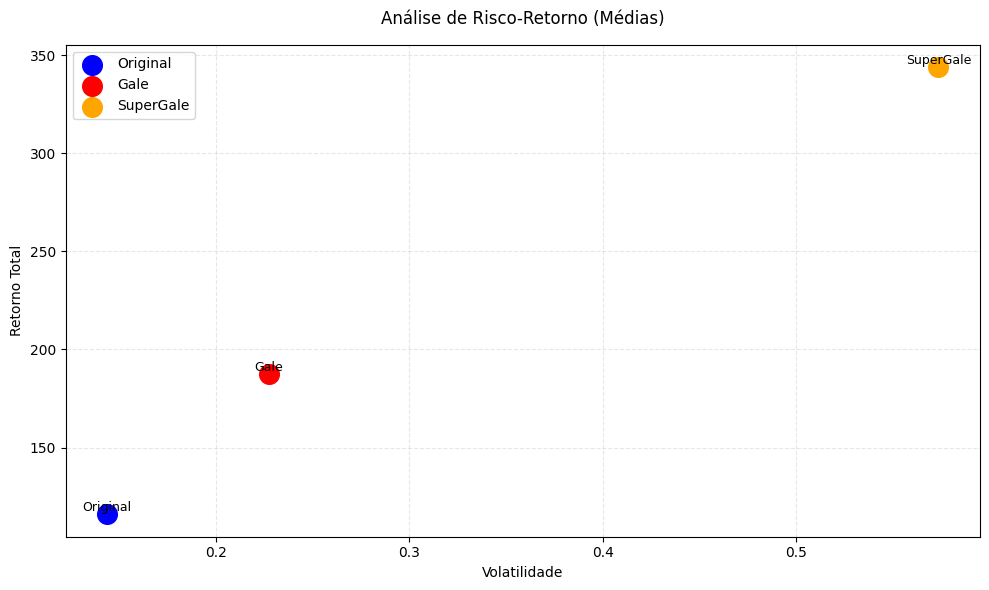

In [39]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 50
ponto_cara = 1.05
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

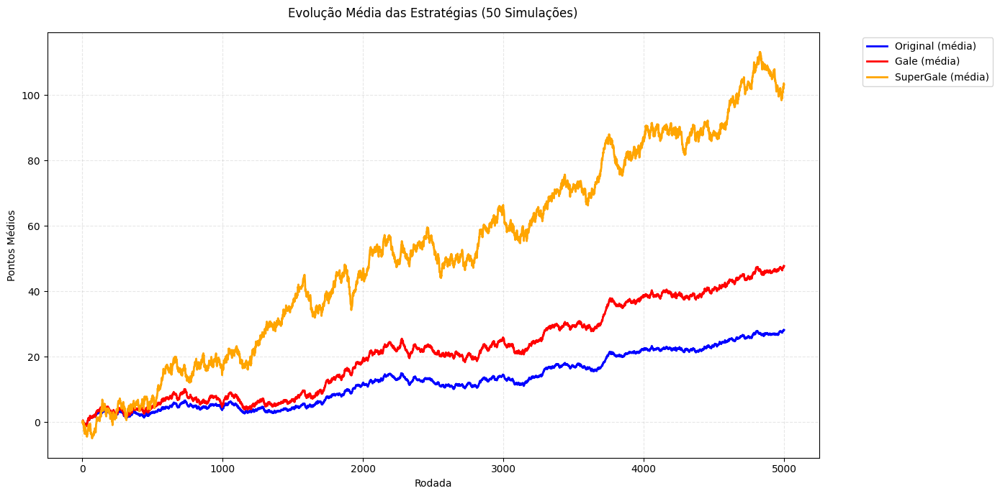

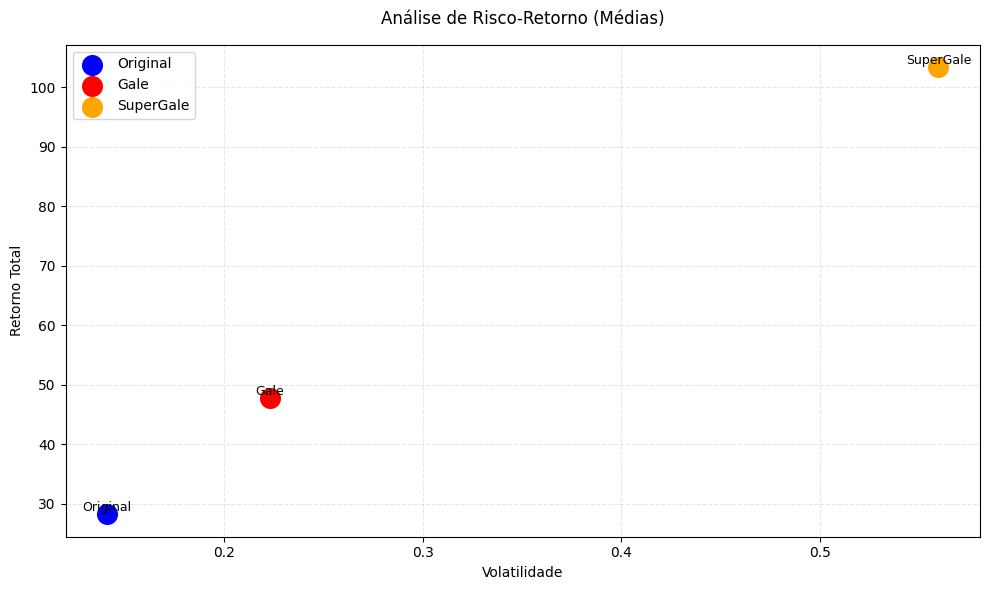

In [40]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 50
ponto_cara = 1.01
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

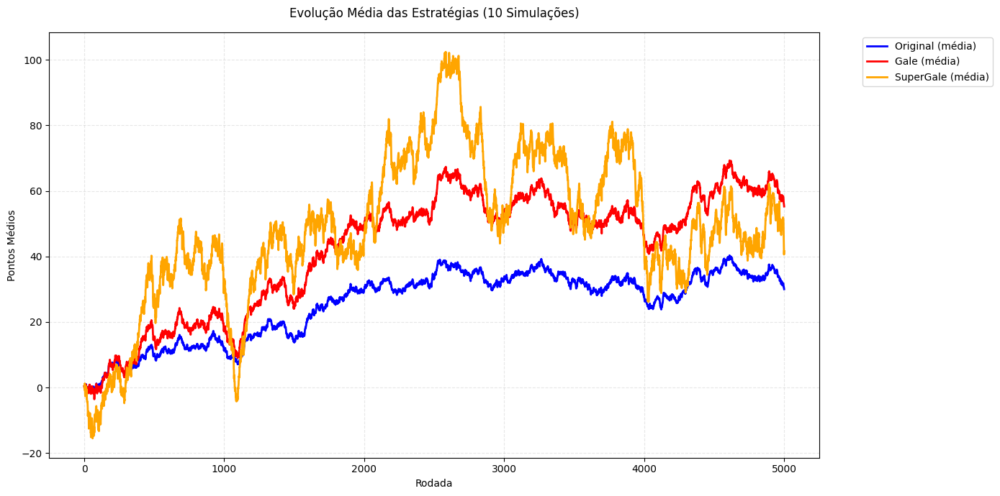

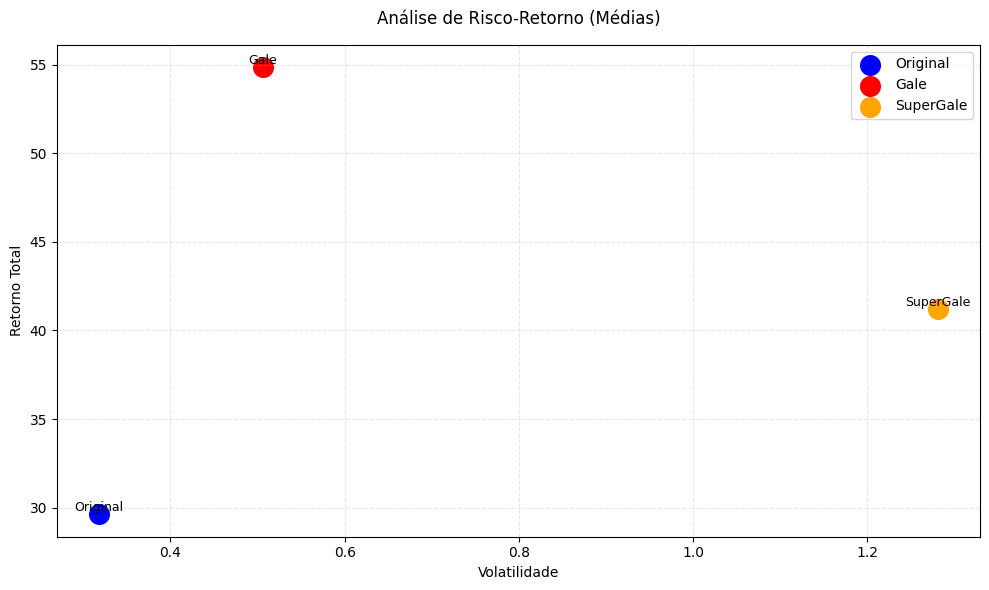

In [41]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1.01
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

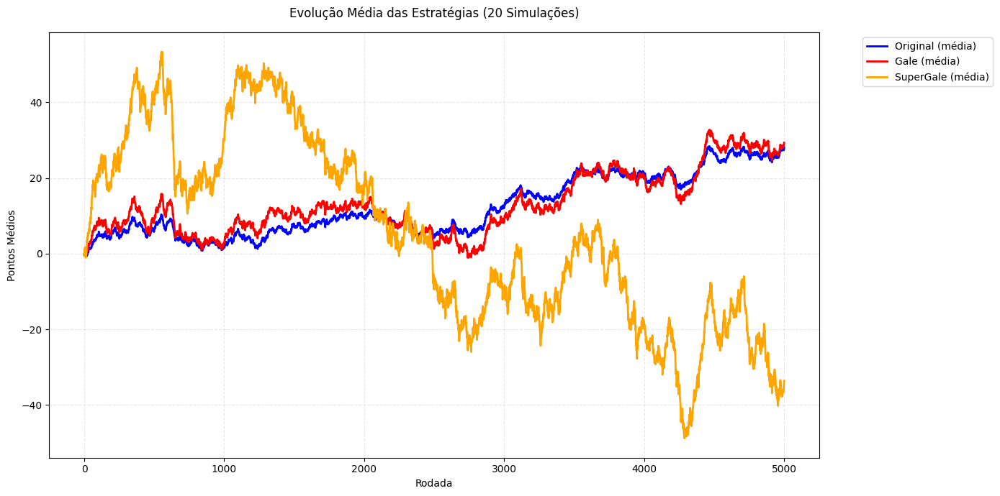

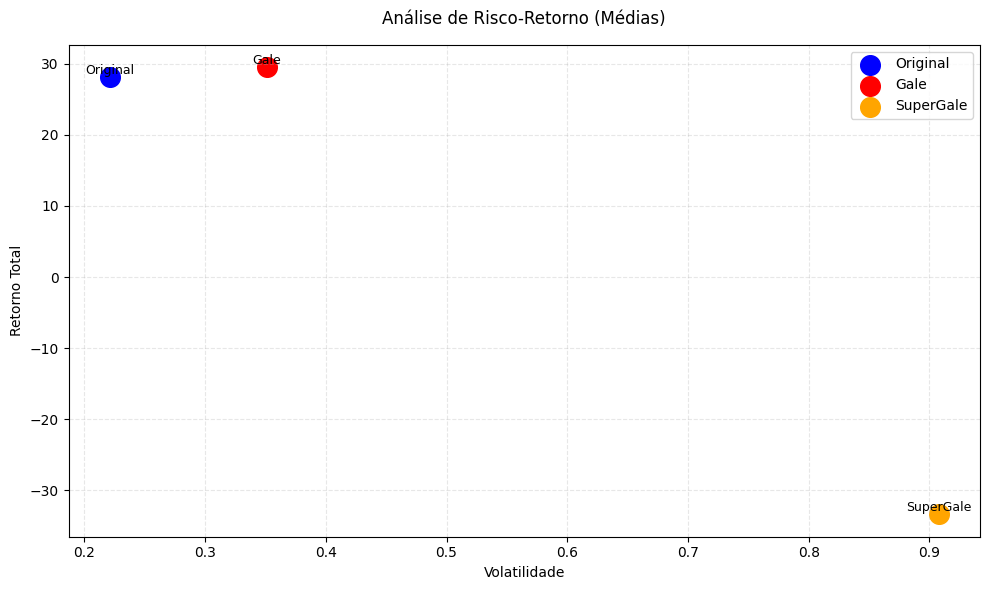

In [43]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 20
ponto_cara = 1.01
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

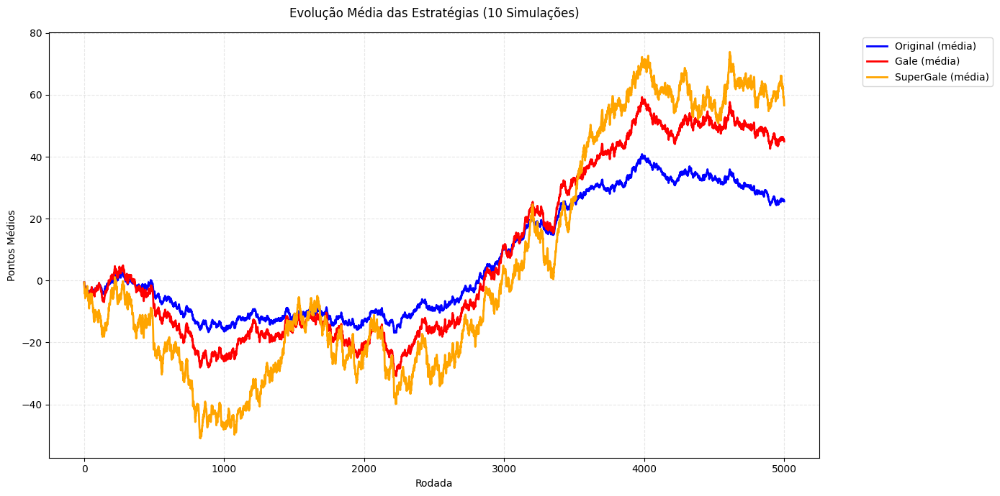

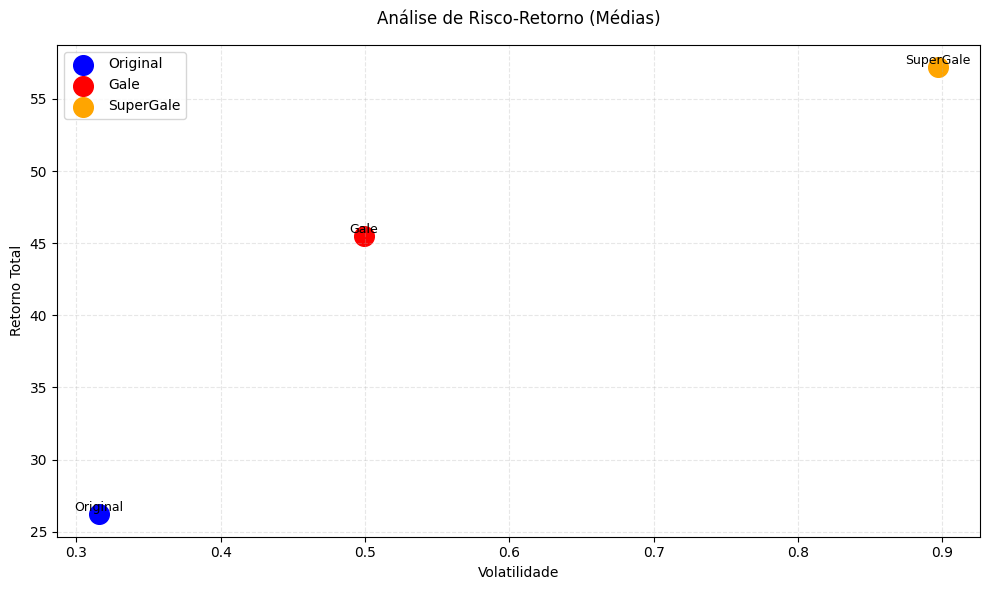

In [42]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1.01
ponto_coroa = -1
limite_perdas_supergale = 4

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

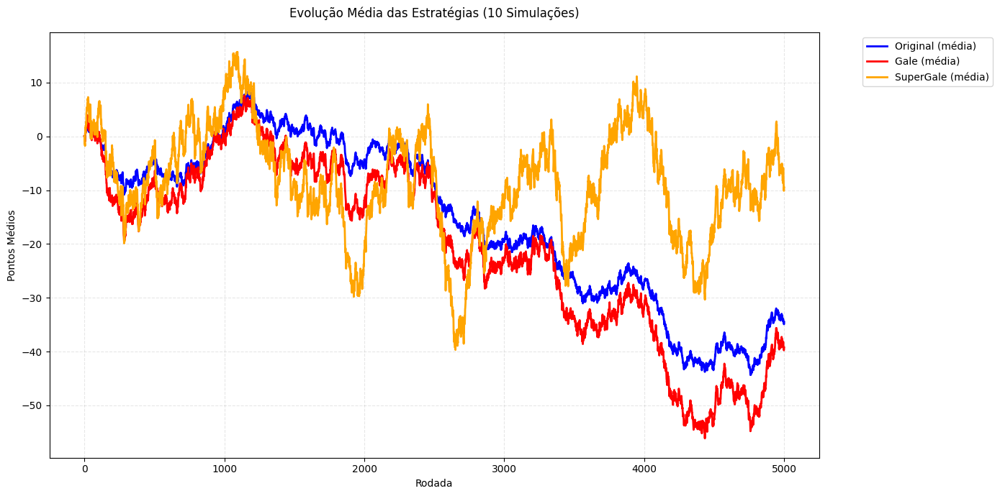

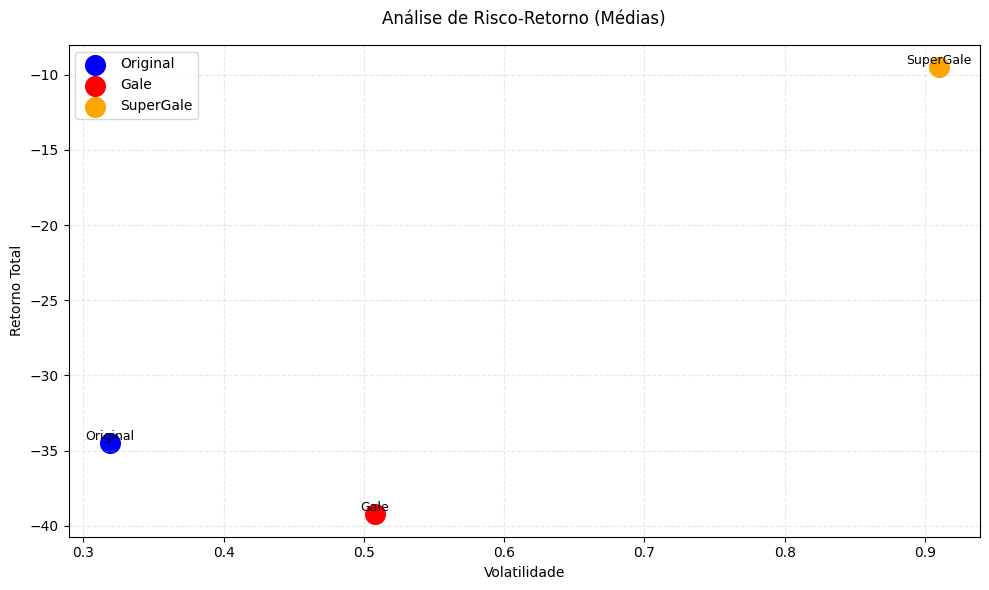

In [44]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1.01
ponto_coroa = -1
limite_perdas_supergale = 4

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

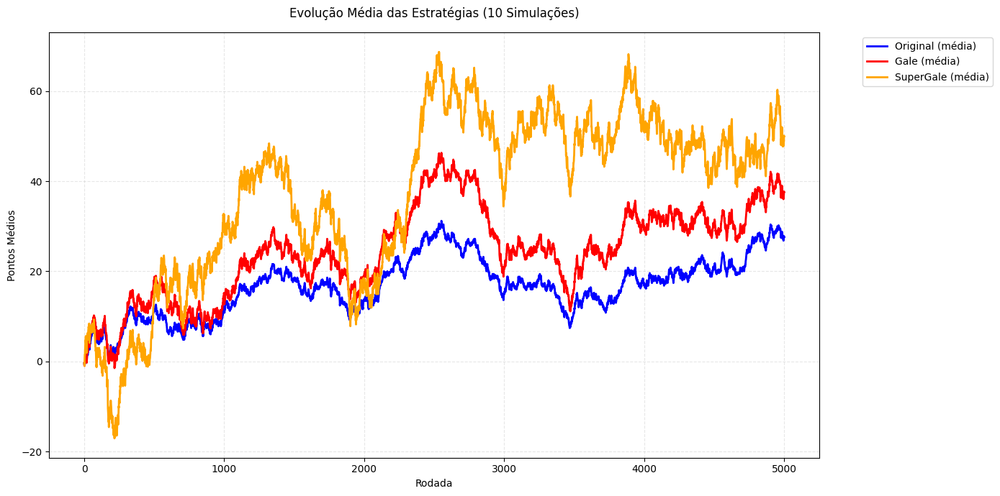

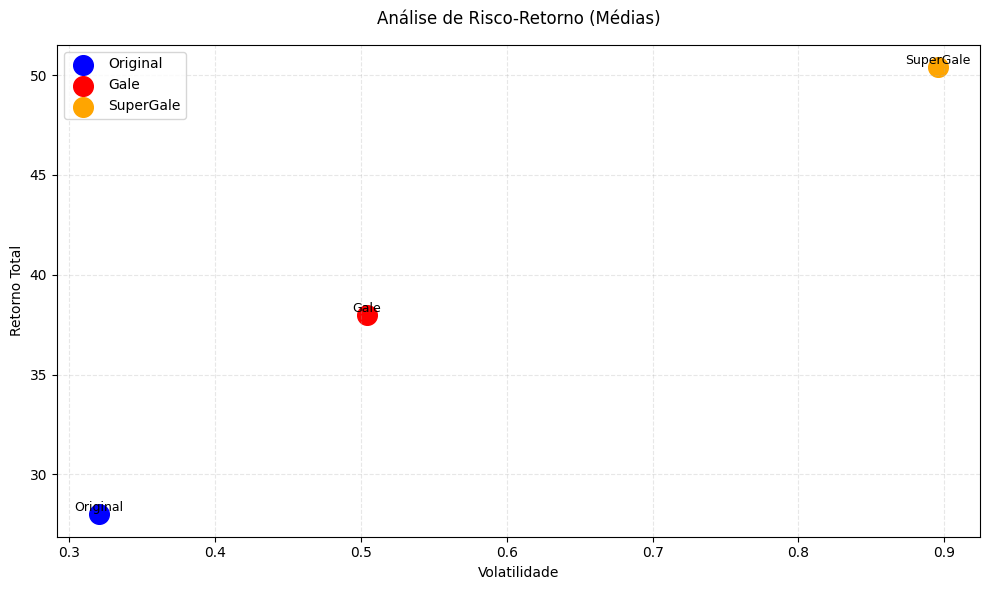

In [45]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 5000
num_simulacoes = 10
ponto_cara = 1
ponto_coroa = -1
limite_perdas_supergale = 4

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

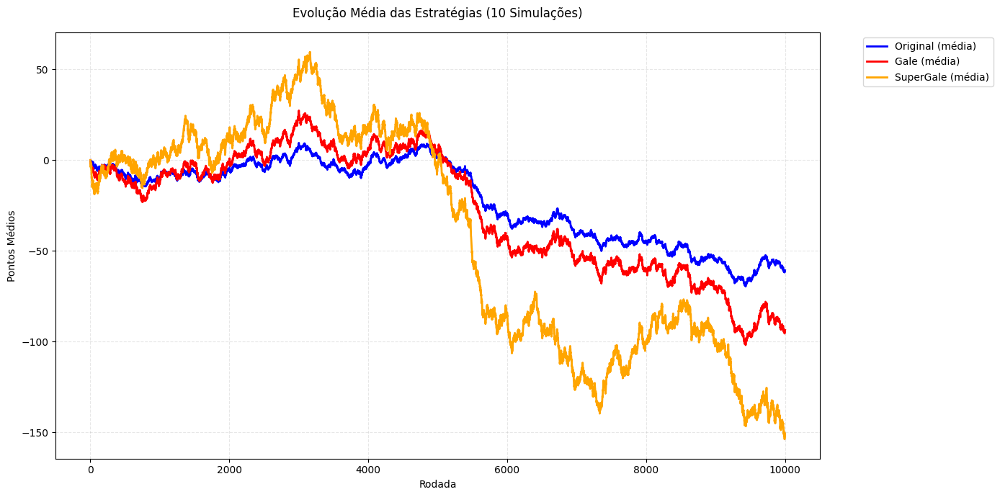

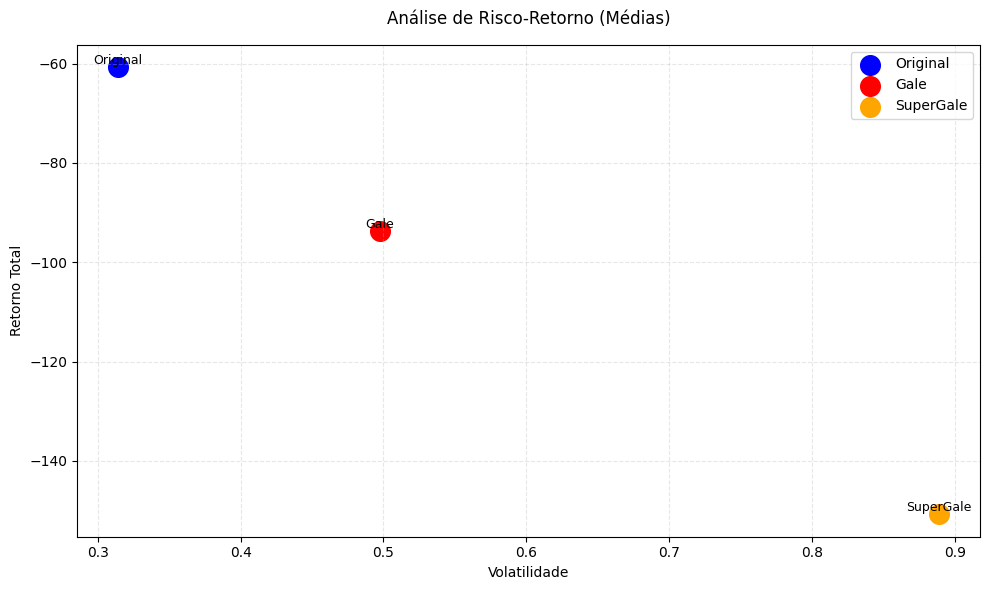

In [46]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 10
ponto_cara = 0.99
ponto_coroa = -1
limite_perdas_supergale = 4

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

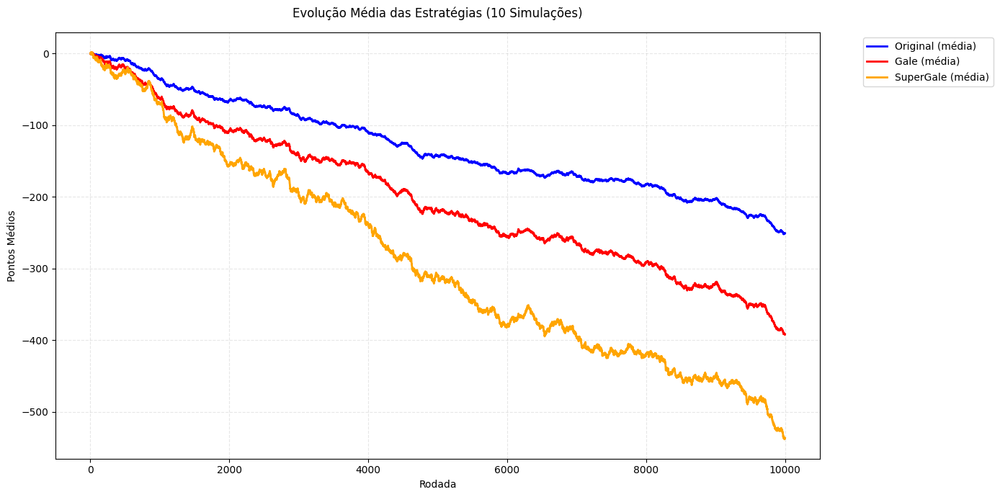

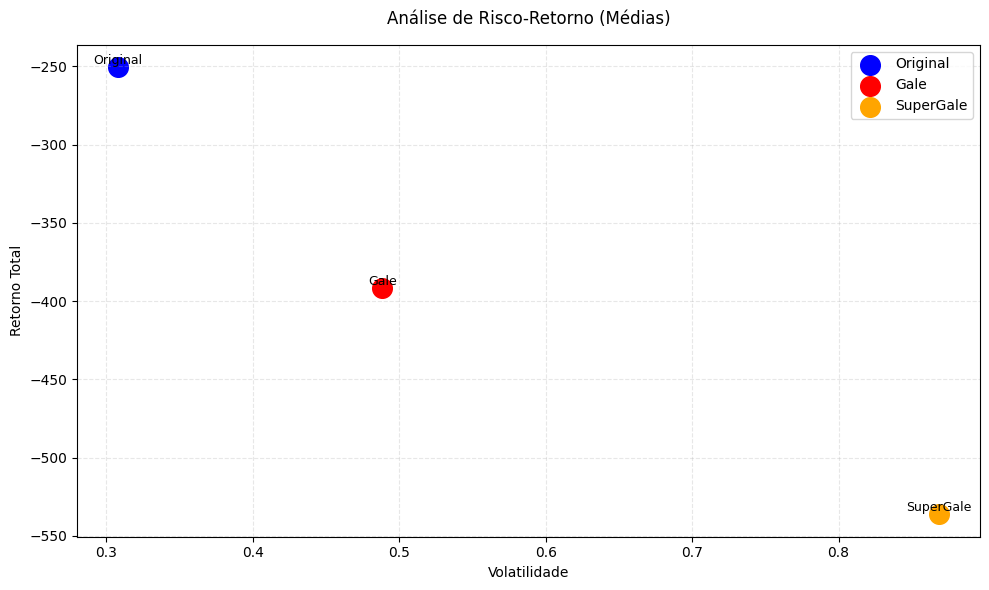

In [48]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 10
ponto_cara = 0.95
ponto_coroa = -1
limite_perdas_supergale = 4

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

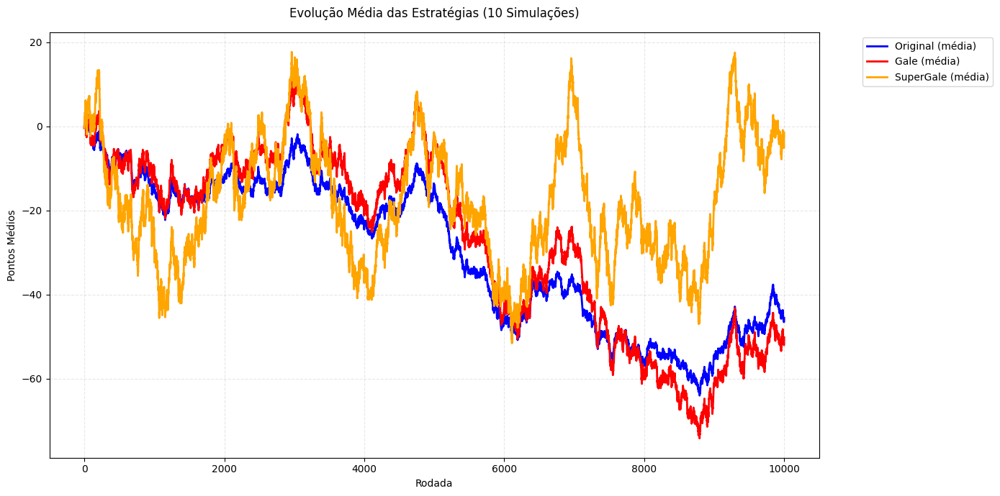

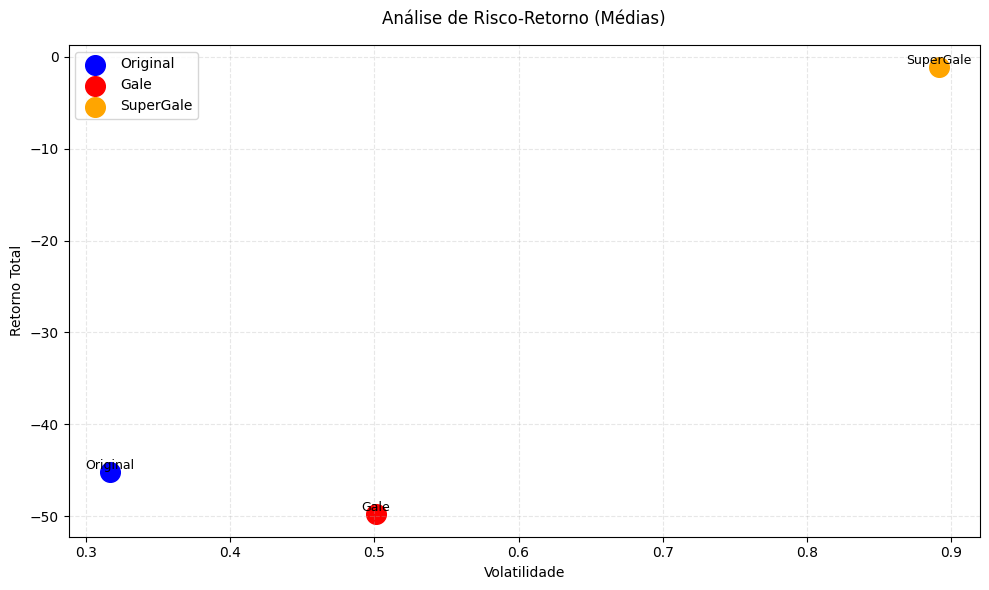

In [49]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 10
ponto_cara = 0.99
ponto_coroa = -1
limite_perdas_supergale = 4

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

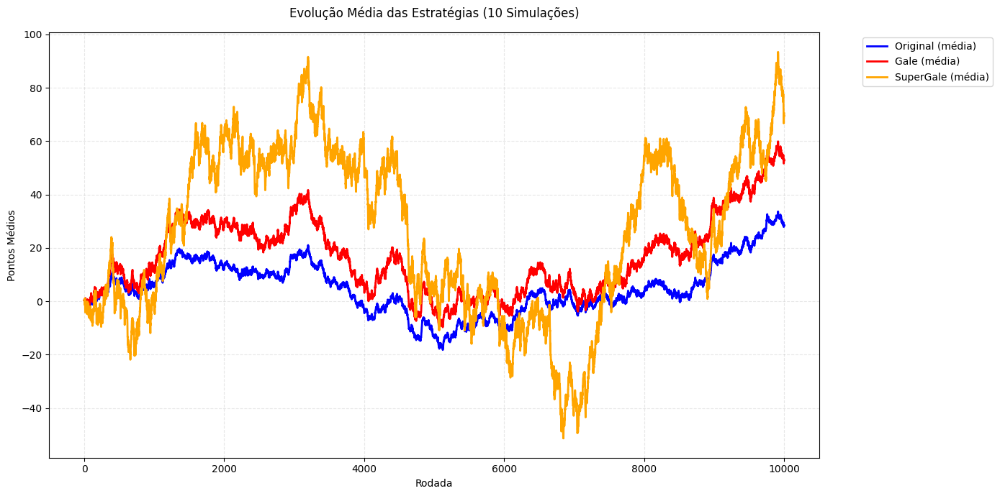

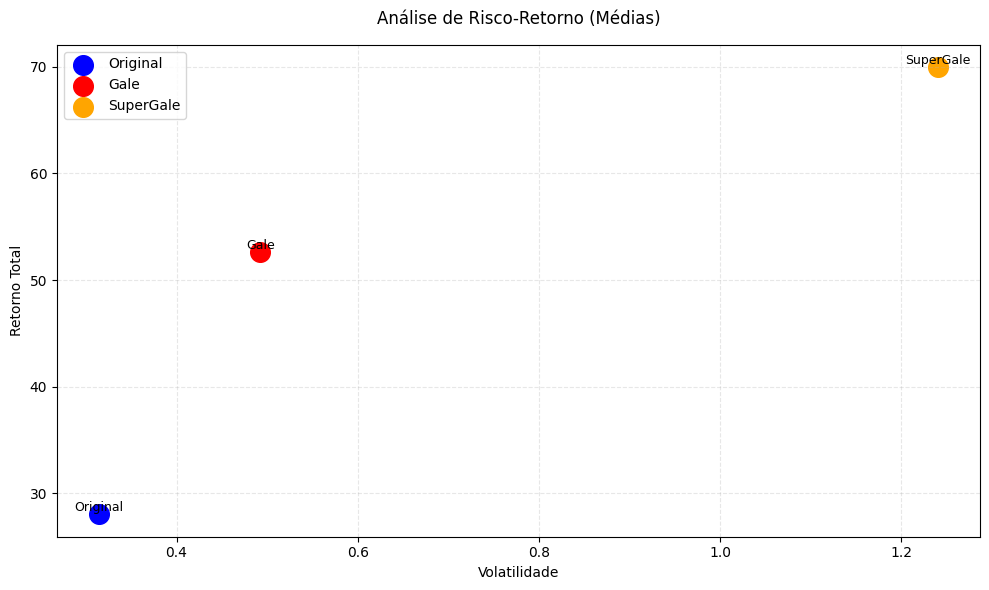

In [51]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 10
ponto_cara = 0.99
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

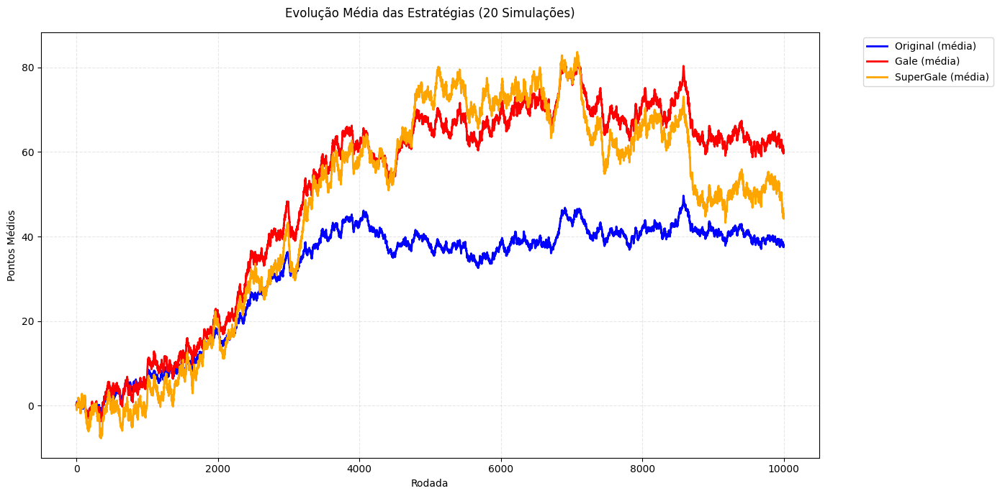

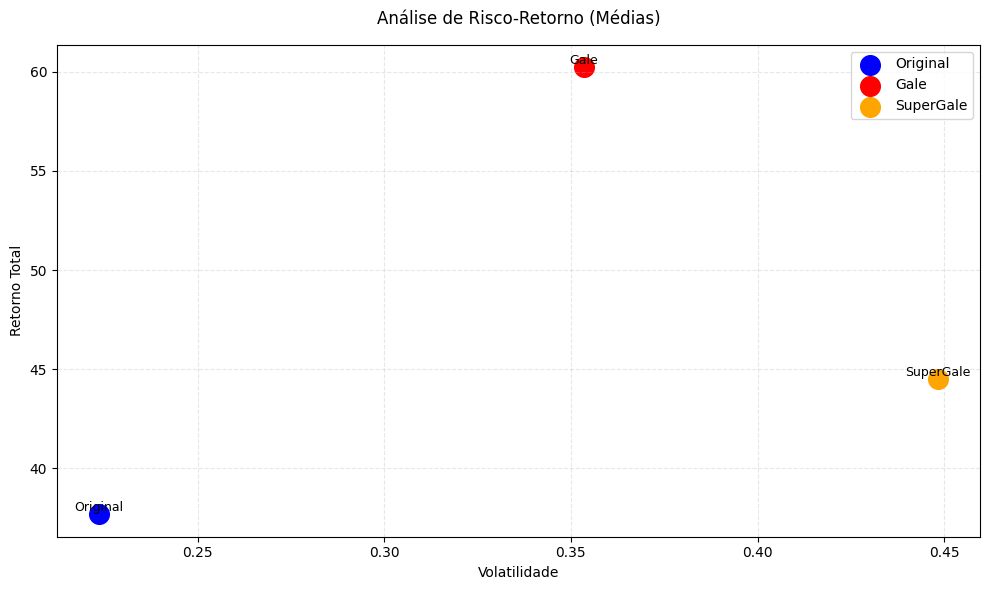

In [57]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 0.999
ponto_coroa = -1
limite_perdas_supergale = 3

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

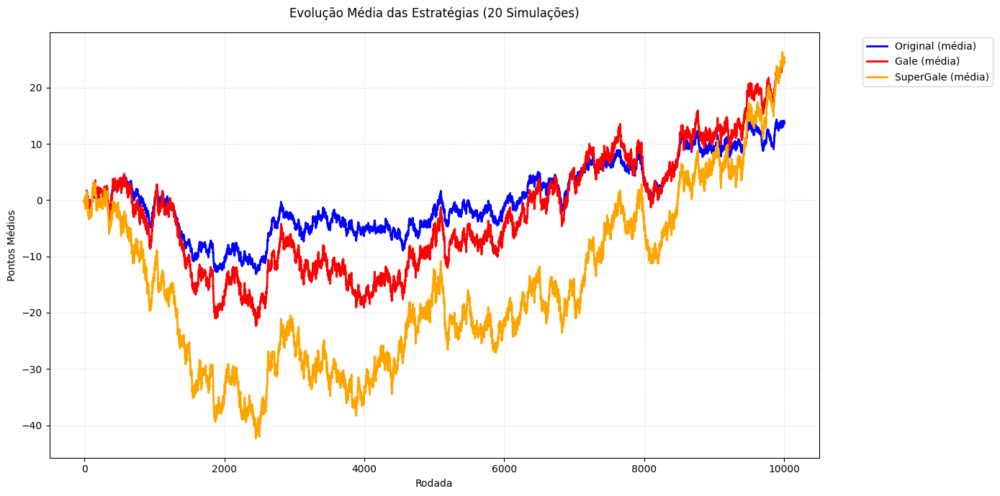

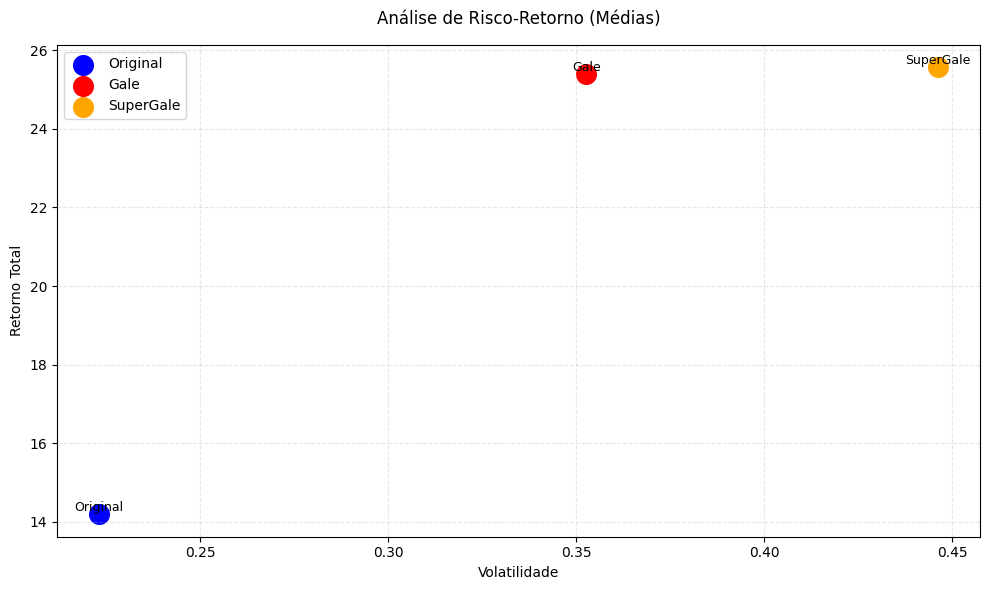

In [58]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 0.999
ponto_coroa = -1
limite_perdas_supergale = 3

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

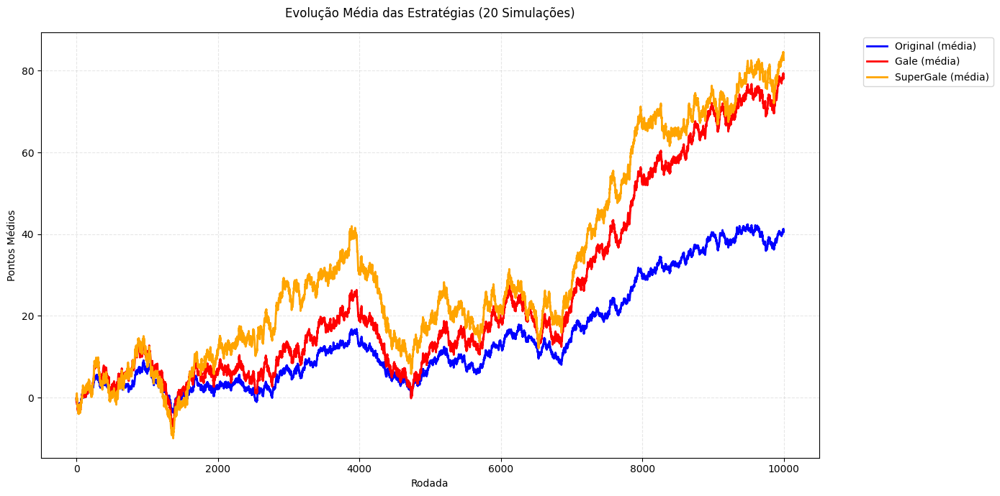

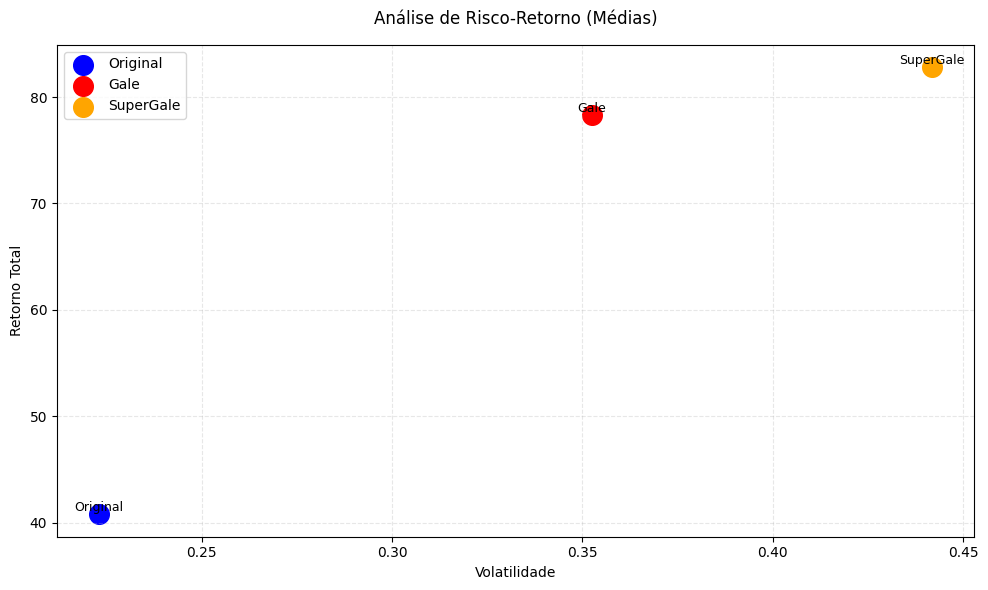

In [60]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1
limite_perdas_supergale = 3

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

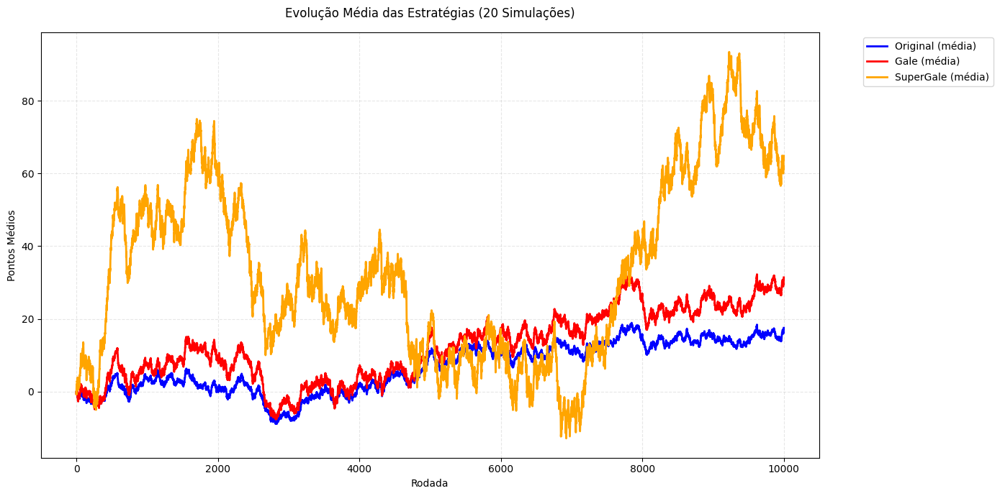

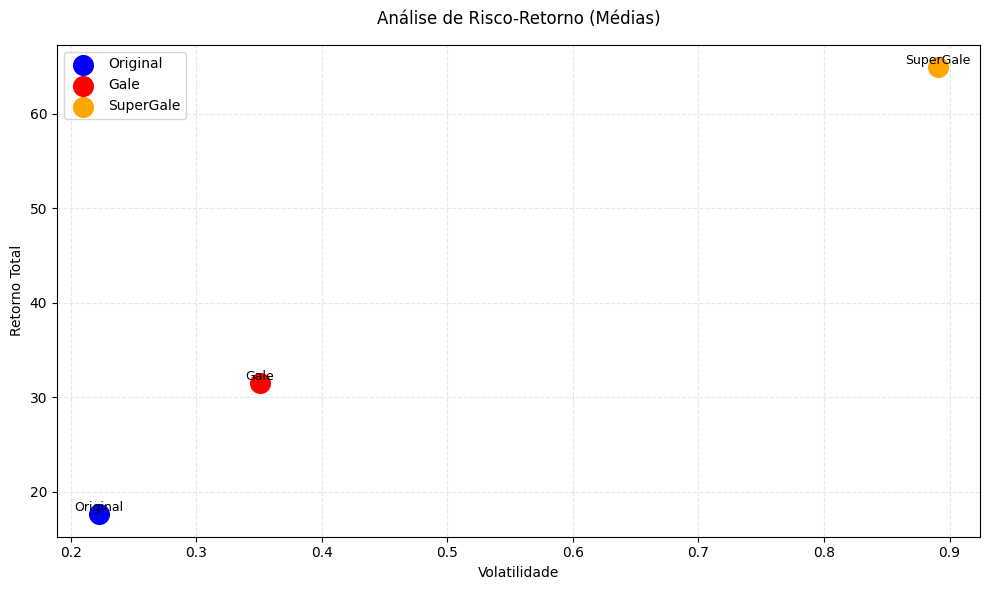

In [61]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1
limite_perdas_supergale = 5

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'perdas_consec': 0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
                continue

            if nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])
                continue

            if nome == 'SuperGale':
                if dados['perdas_consec'] >= limite_perdas_supergale:
                    dados['perdas_consec'] = 0
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] = 0
                else:
                    dados['pontos'] += ponto_coroa * (2 ** dados['perdas_consec'])
                    dados['perdas_consec'] += 1
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'SuperGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {}
for nome in resultados_simulados:
    medias[nome] = np.mean(resultados_simulados[nome], axis=0)

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

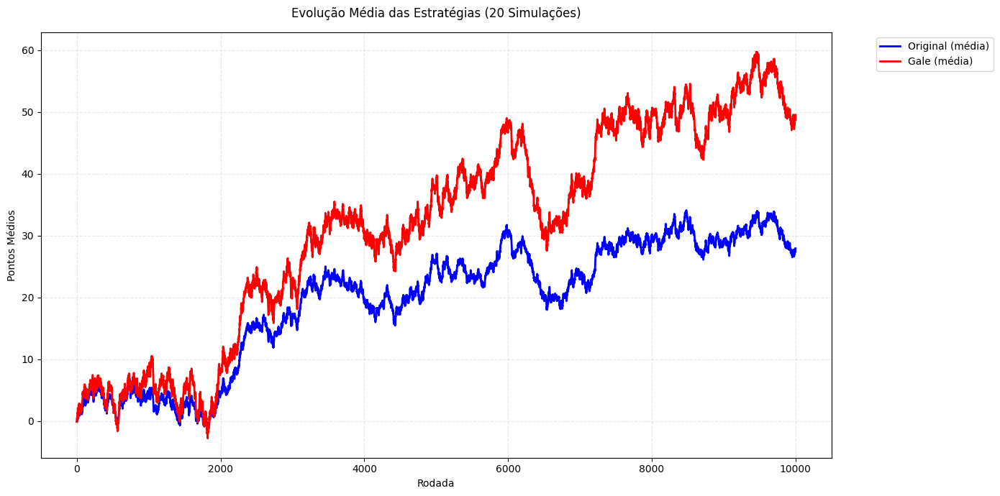

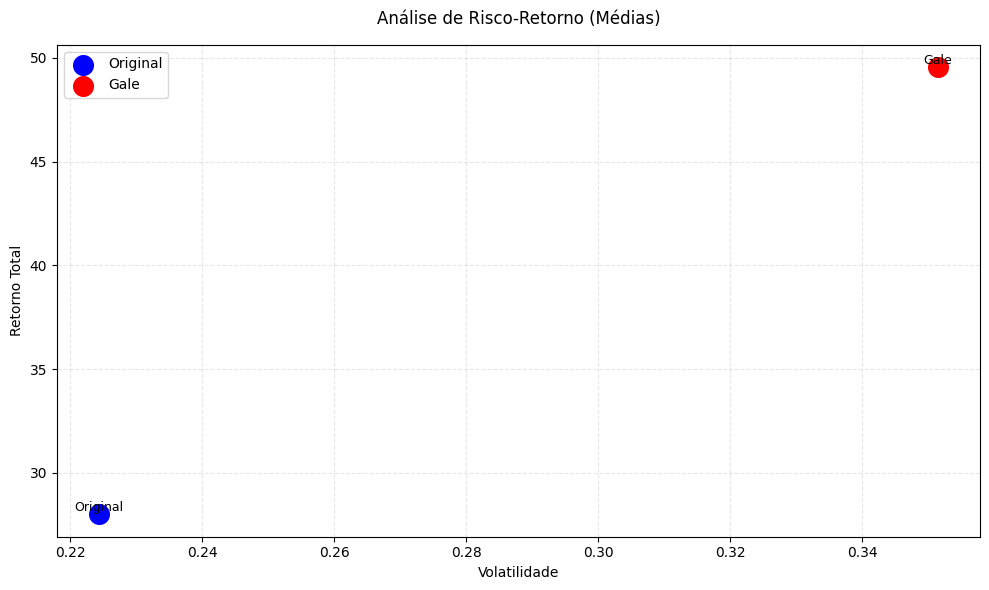

In [67]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)
            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

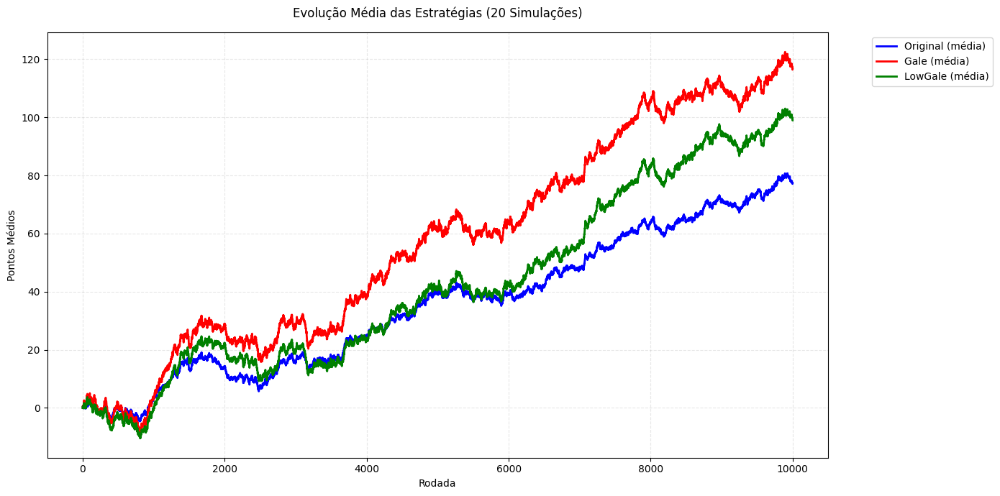

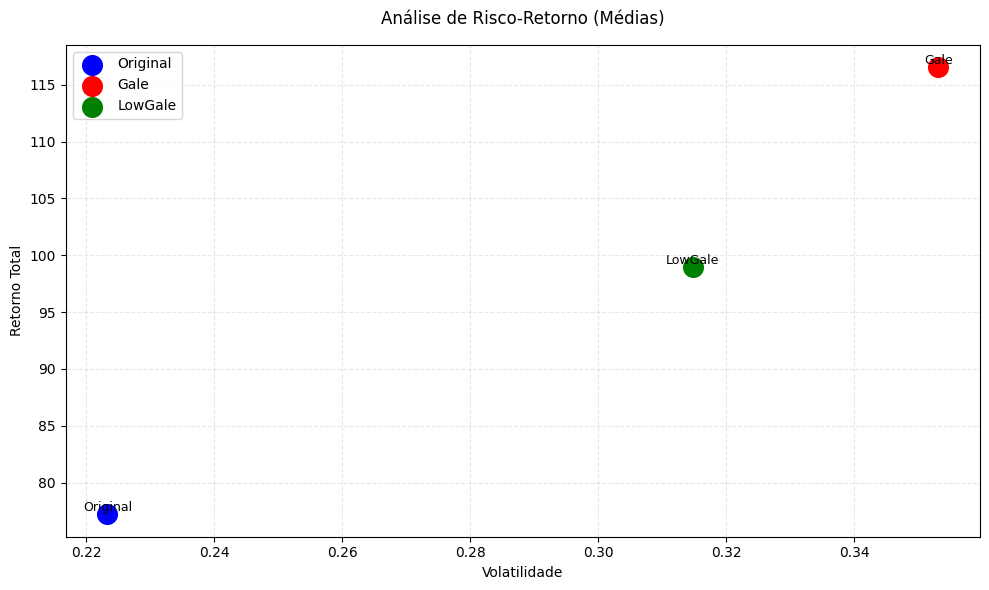

In [68]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'LowGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

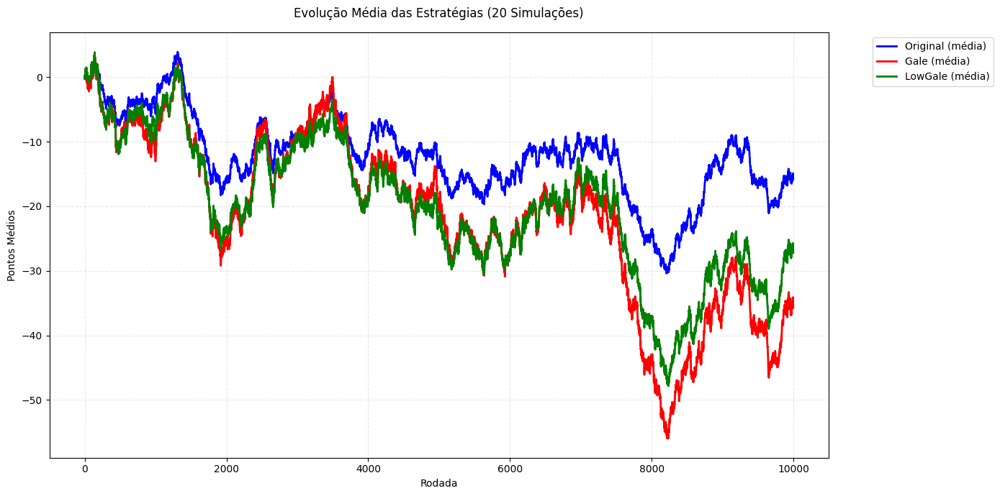

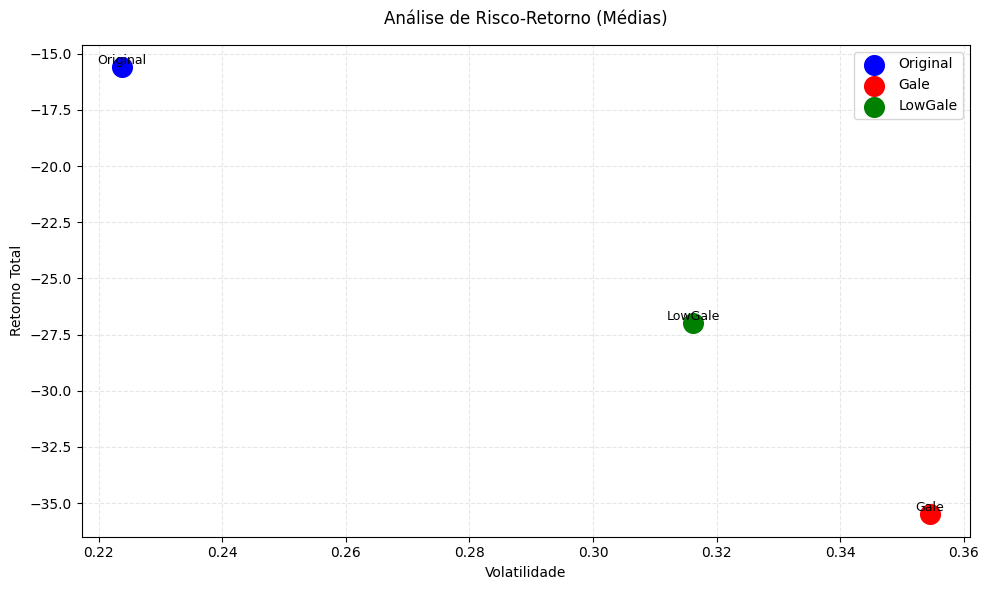

In [69]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'LowGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

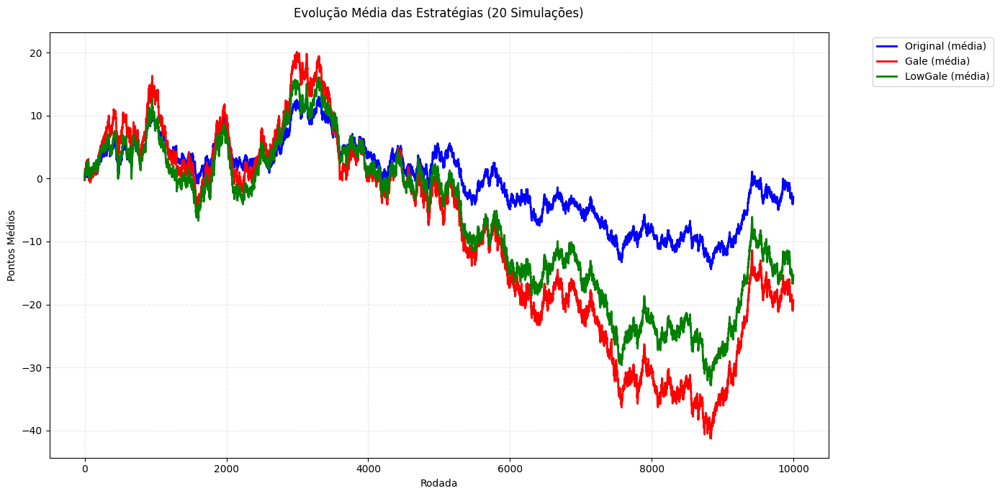

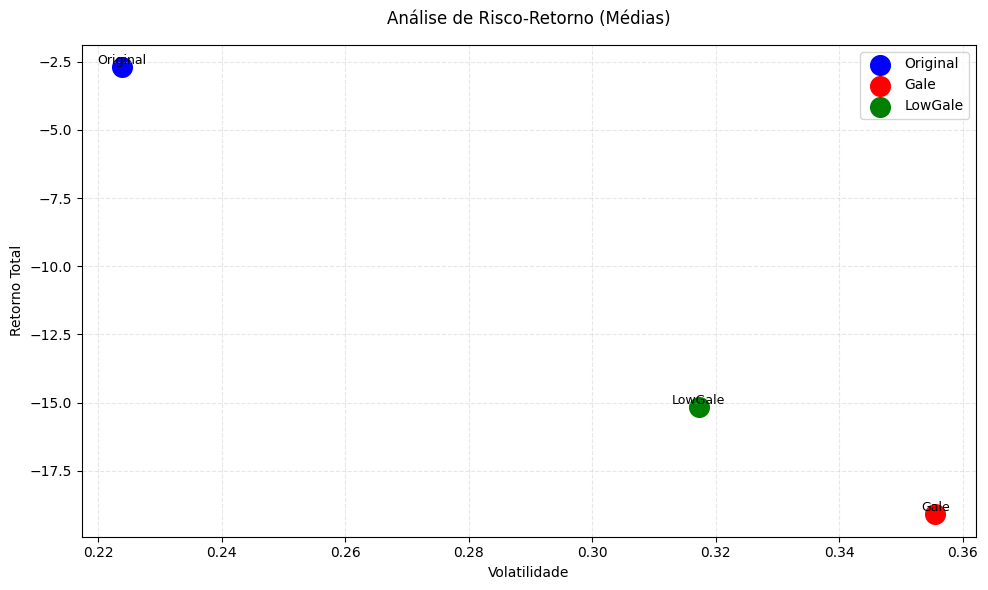

In [70]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'LowGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

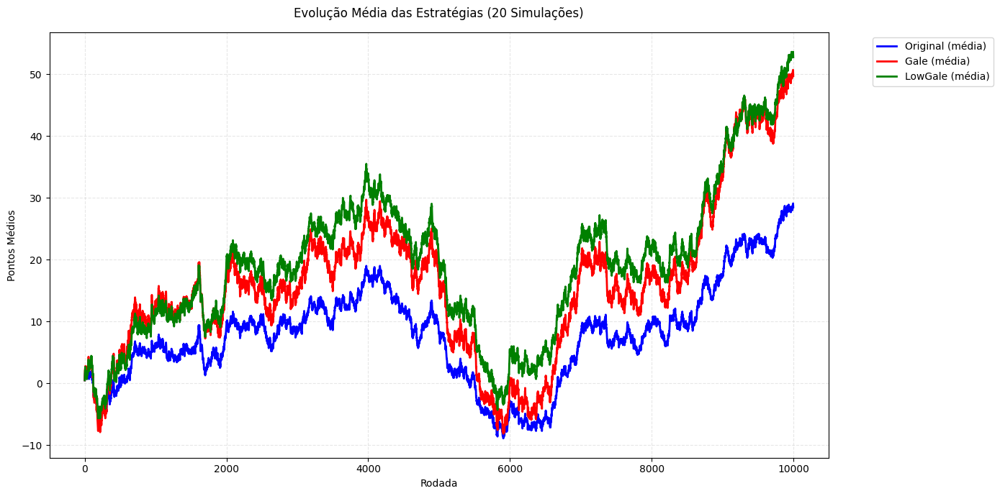

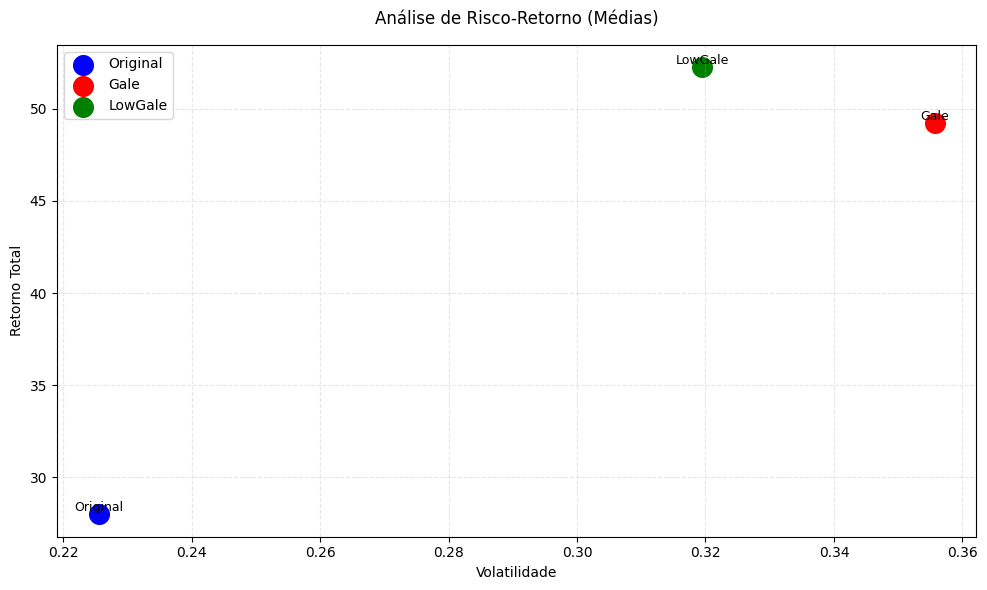

In [71]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {'Original': [], 'Gale': [], 'LowGale': []}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

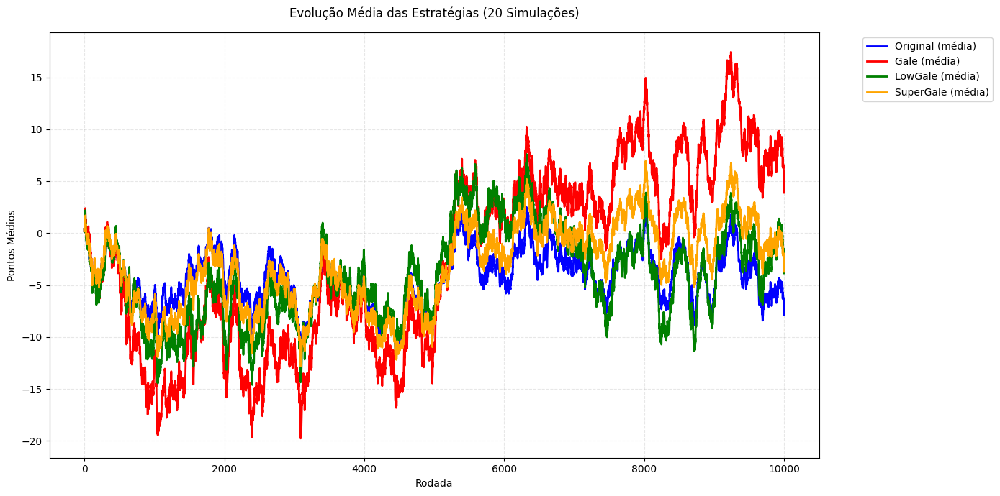

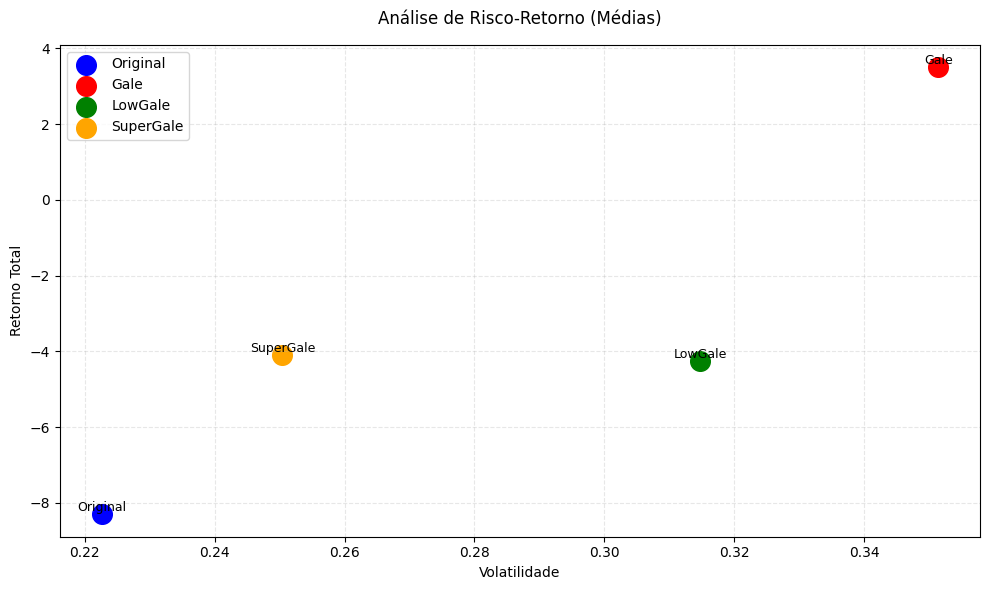

In [72]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0  # reset no acerto
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1  # aumenta 10% no erro
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {nome: [] for nome in ['Original', 'Gale', 'LowGale', 'SuperGale']}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

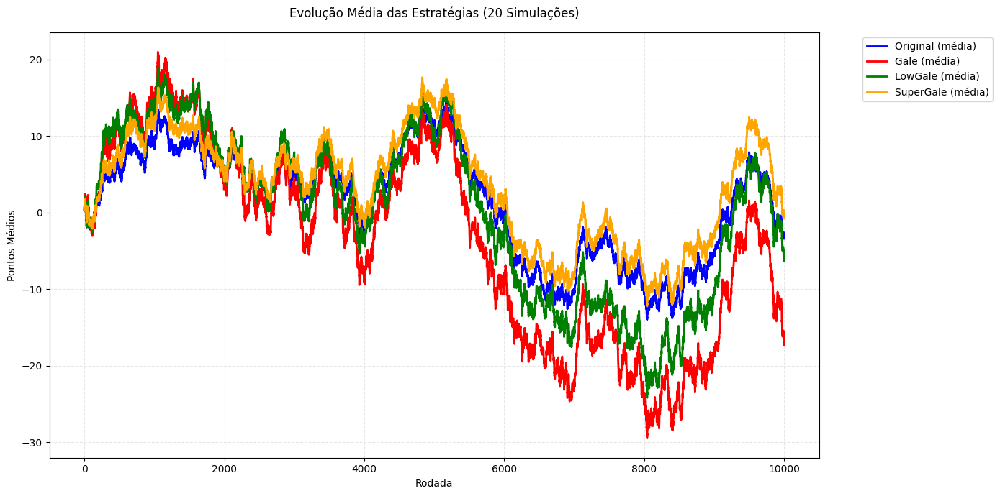

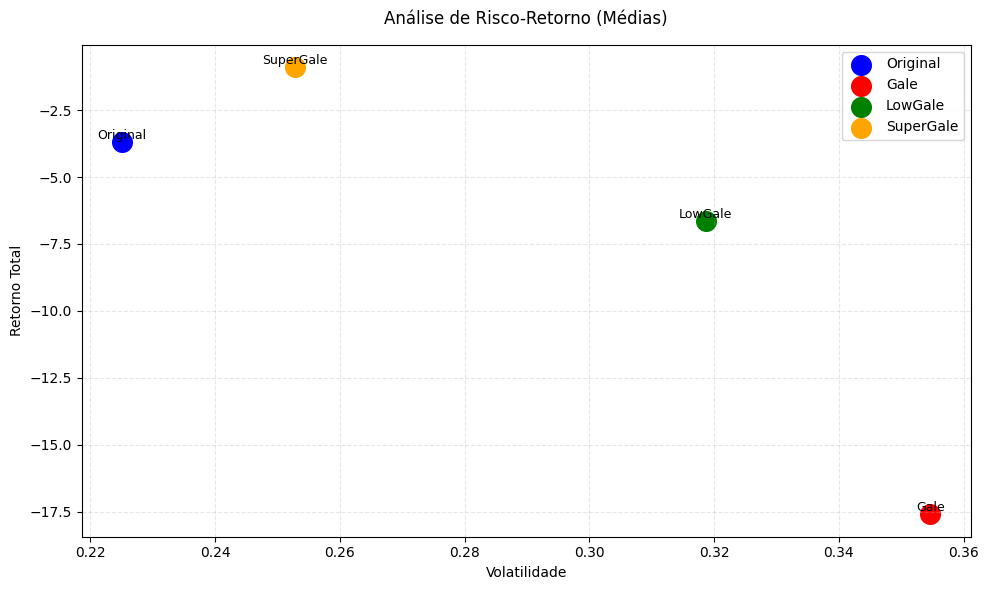

In [73]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0  # reset no acerto
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1  # aumenta 10% no erro
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {nome: [] for nome in ['Original', 'Gale', 'LowGale', 'SuperGale']}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

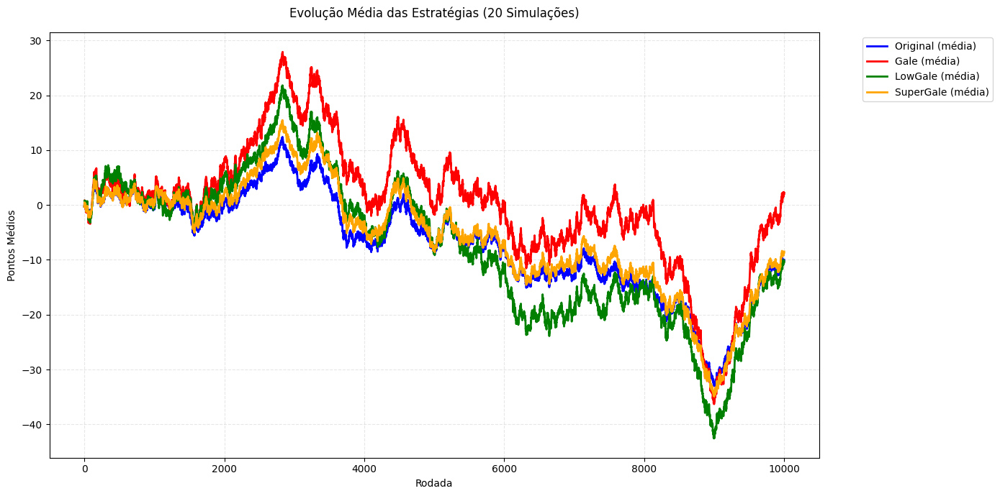

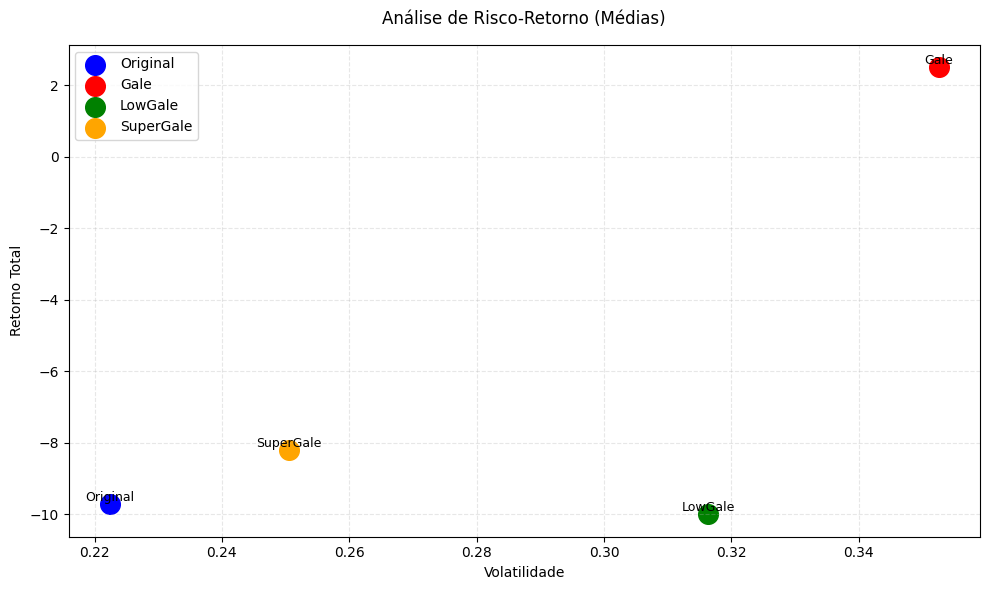

In [74]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0  # reset no acerto
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1  # aumenta 10% no erro
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {nome: [] for nome in ['Original', 'Gale', 'LowGale', 'SuperGale']}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

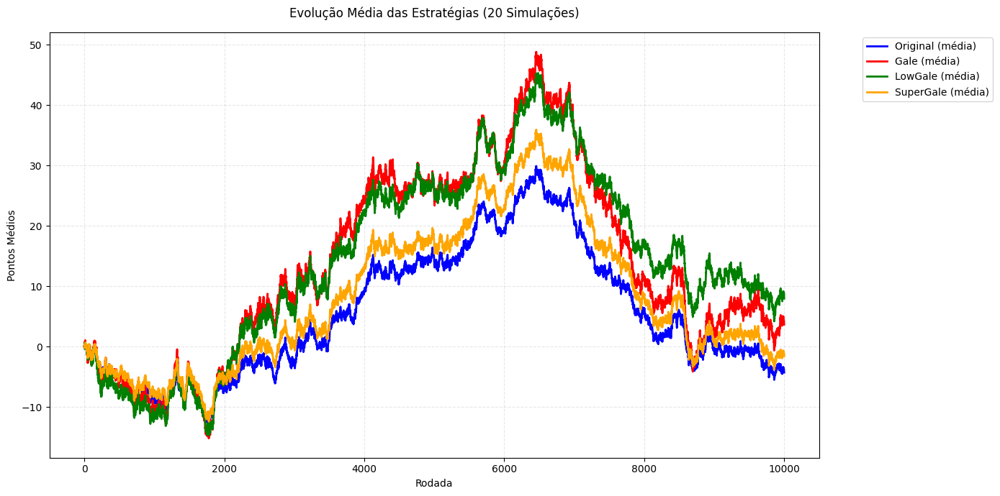

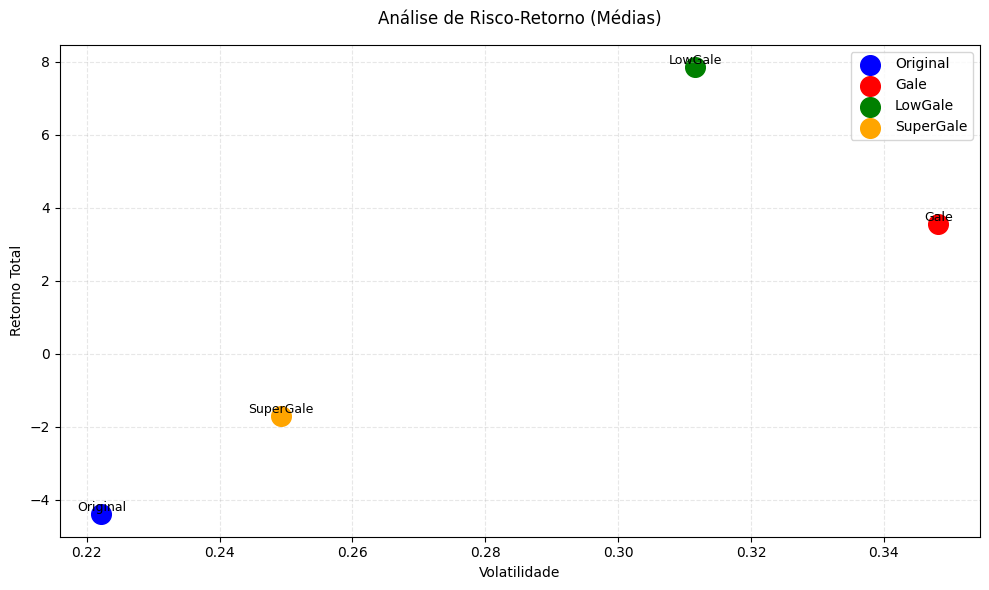

In [75]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0  # reset no acerto
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1  # aumenta 10% no erro
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {nome: [] for nome in ['Original', 'Gale', 'LowGale', 'SuperGale']}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

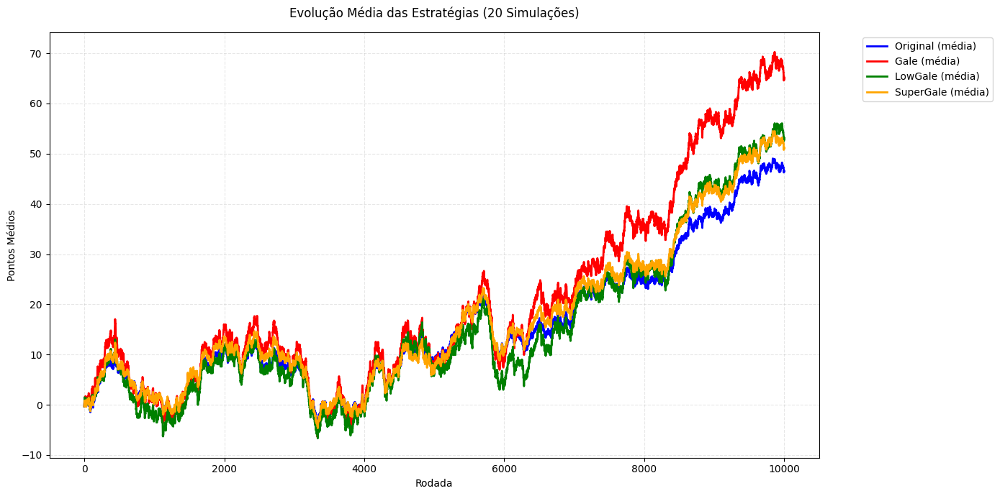

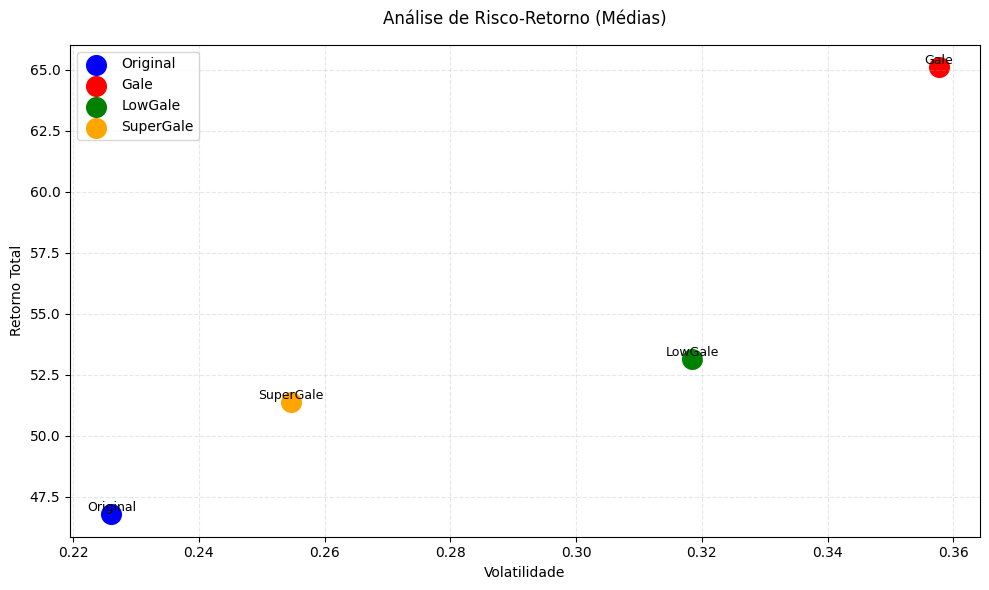

In [76]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1.01
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0  # reset no acerto
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1  # aumenta 10% no erro
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {nome: [] for nome in ['Original', 'Gale', 'LowGale', 'SuperGale']}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

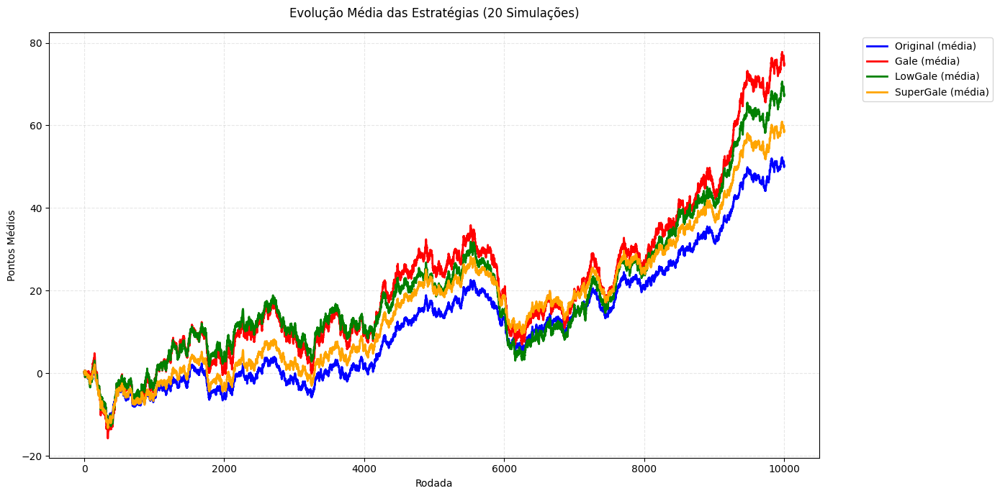

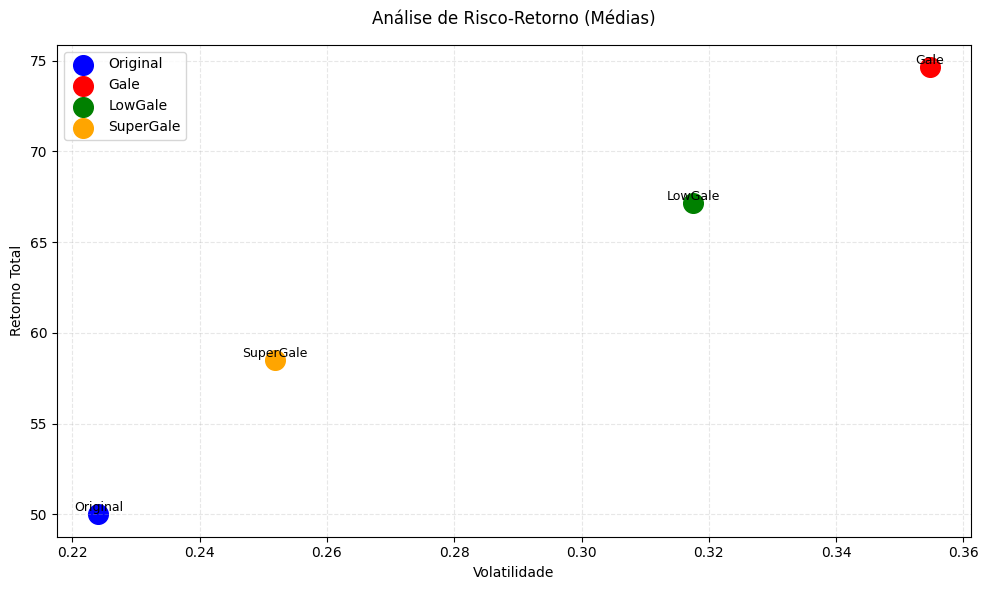

In [77]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1.01
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0  # reset no acerto
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1  # aumenta 10% no erro
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
resultados_simulados = {nome: [] for nome in ['Original', 'Gale', 'LowGale', 'SuperGale']}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in resultados_simulados:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in resultados_simulados}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {'Original': 'blue', 'Gale': 'red', 'LowGale': 'green', 'SuperGale': 'orange'}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

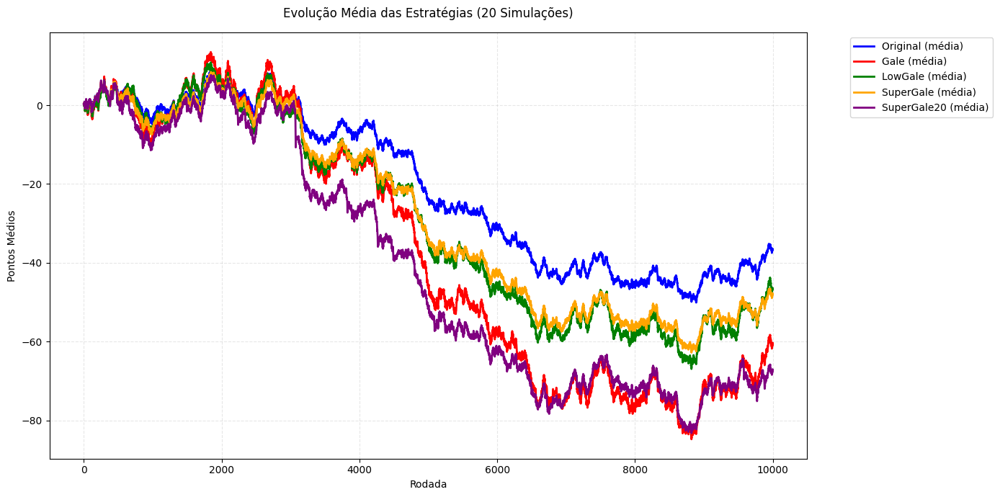

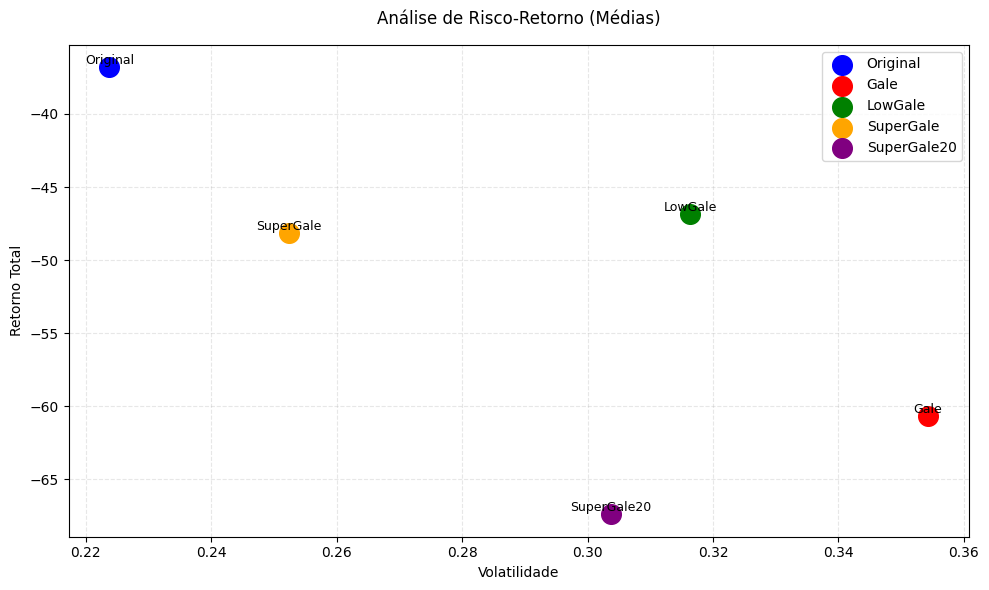

In [78]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale20':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.2
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

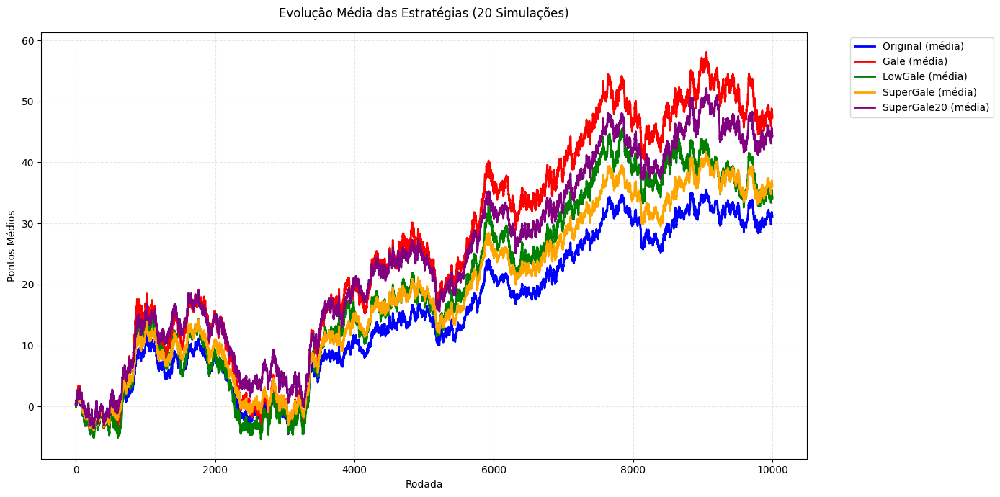

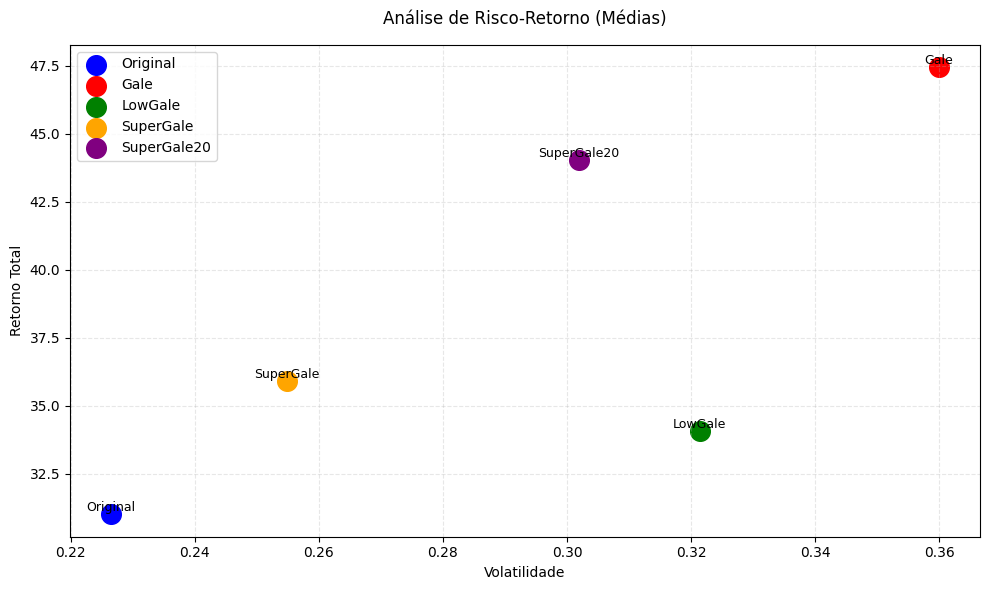

In [79]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1.01
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale20':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.2
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

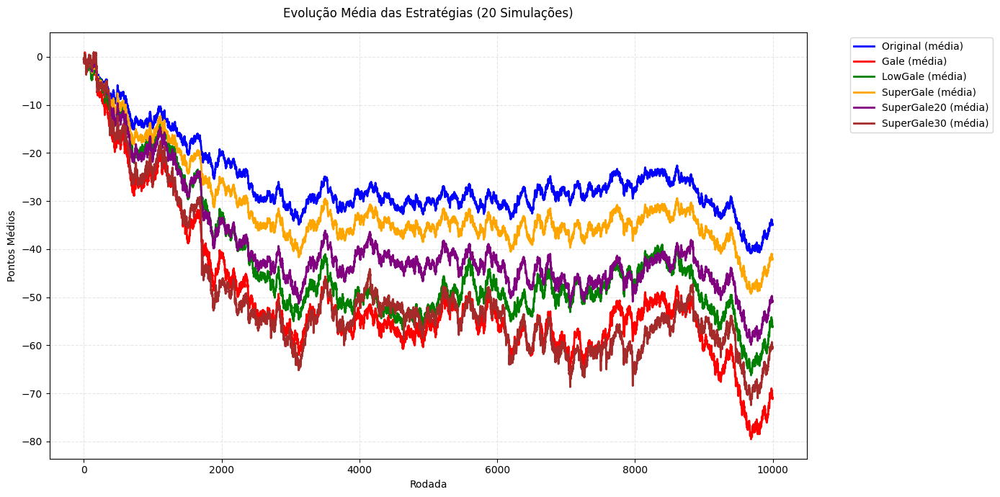

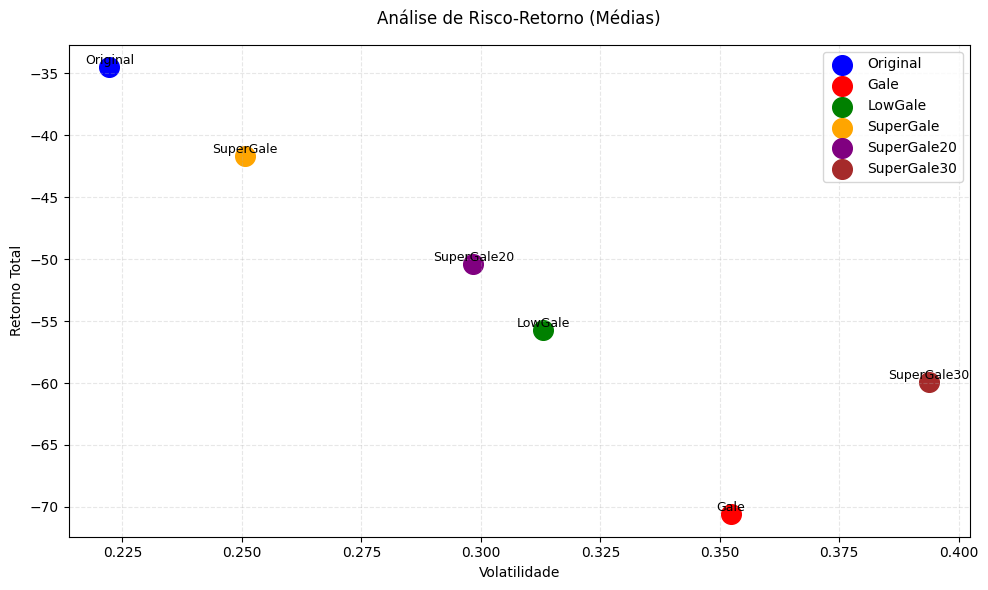

In [80]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale20':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale30':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.3
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20', 'SuperGale30']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale30': 'brown'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

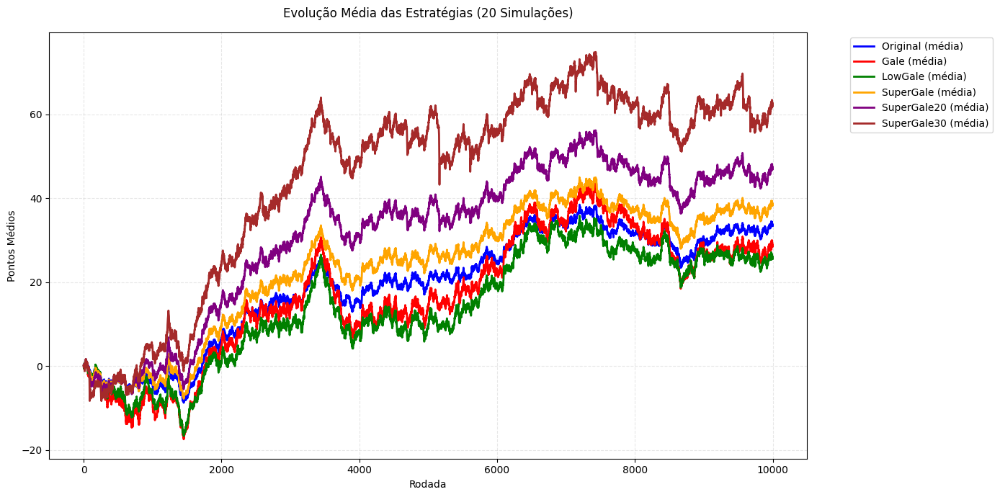

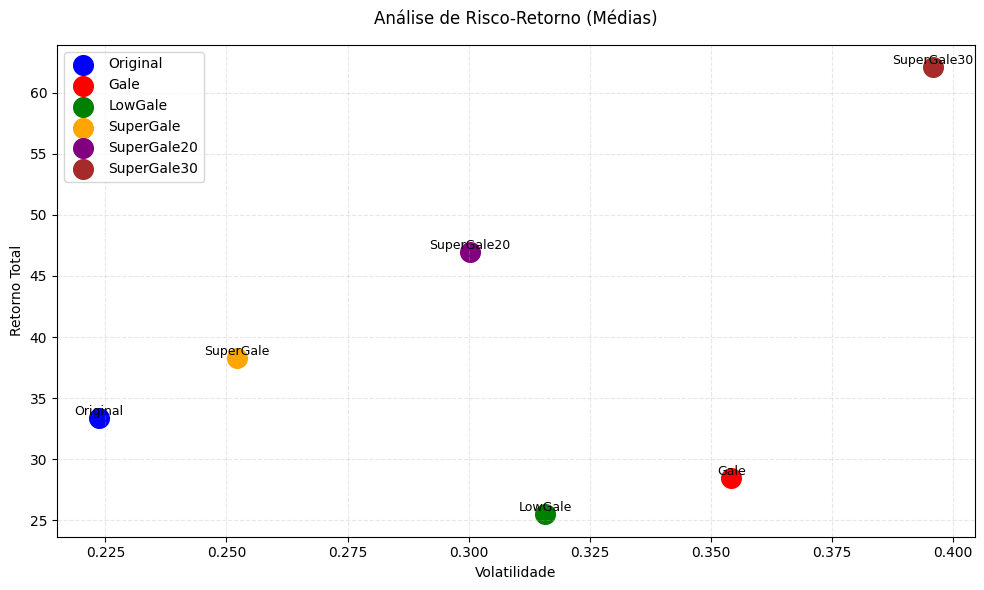

In [81]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1.01
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale20':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale30':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.3
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20', 'SuperGale30']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale30': 'brown'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

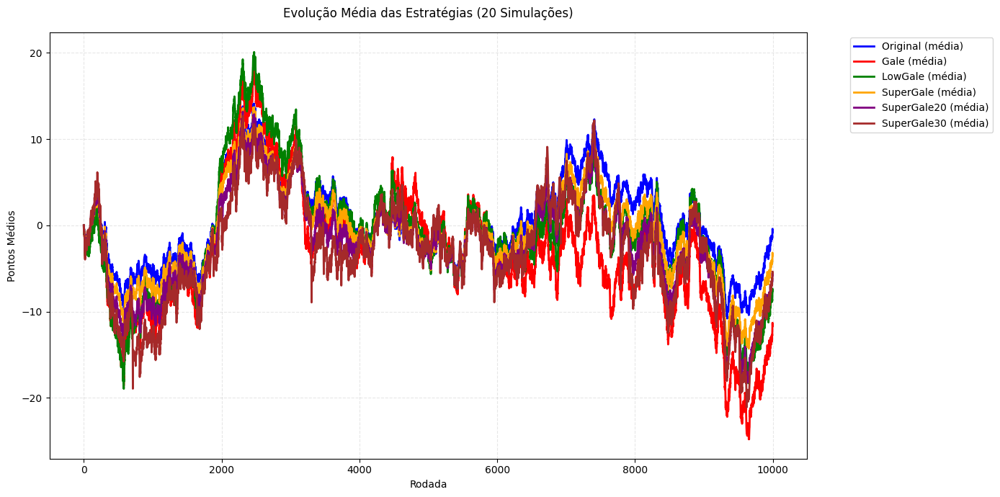

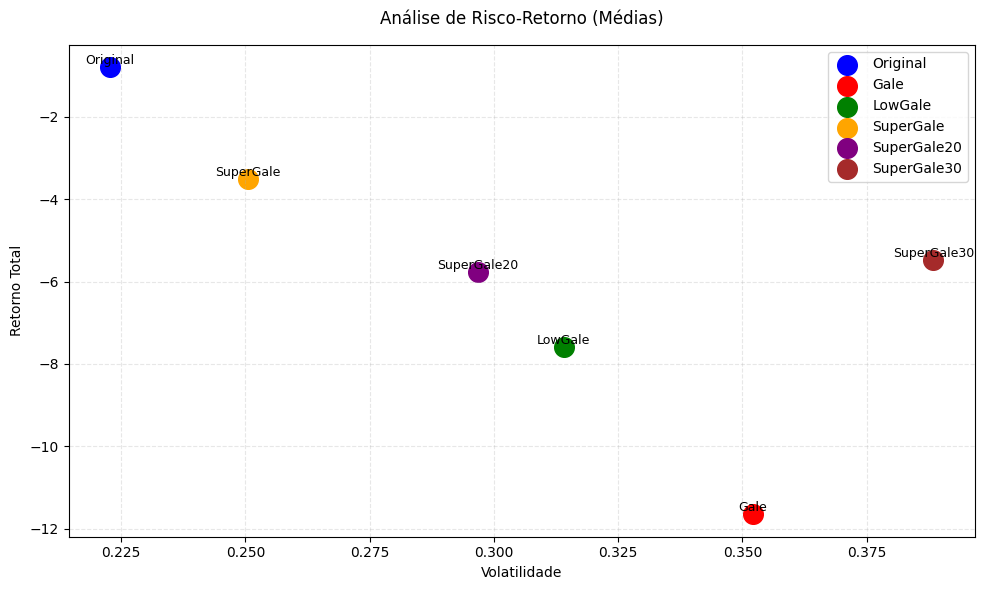

In [82]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.1
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale20':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale30':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= 1.3
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20', 'SuperGale30']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale30': 'brown'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

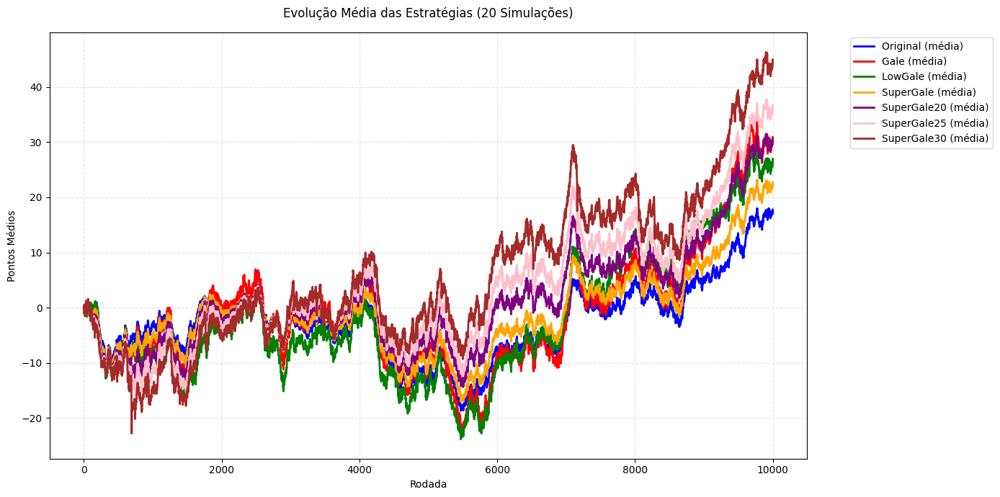

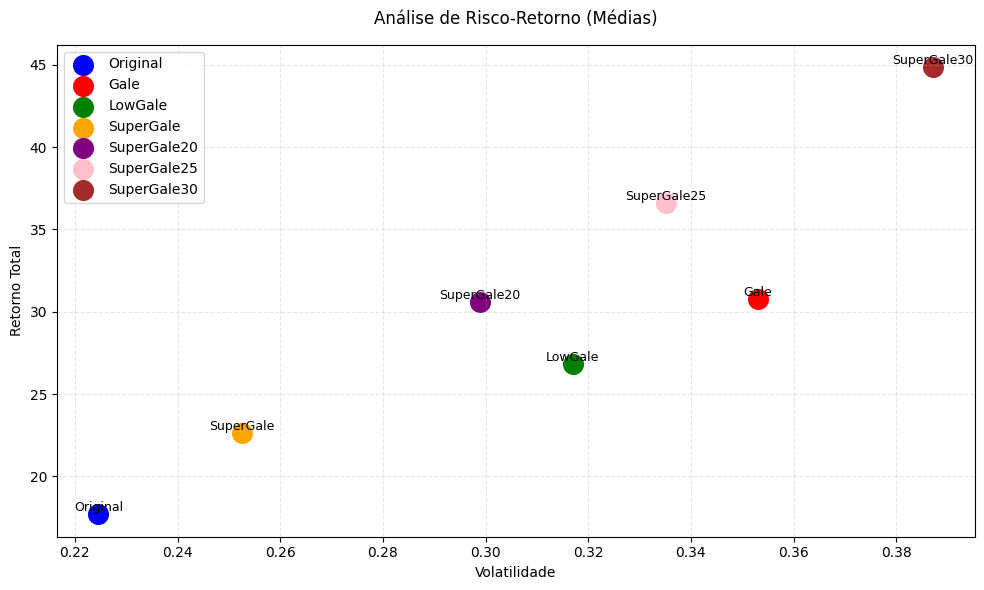

In [83]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

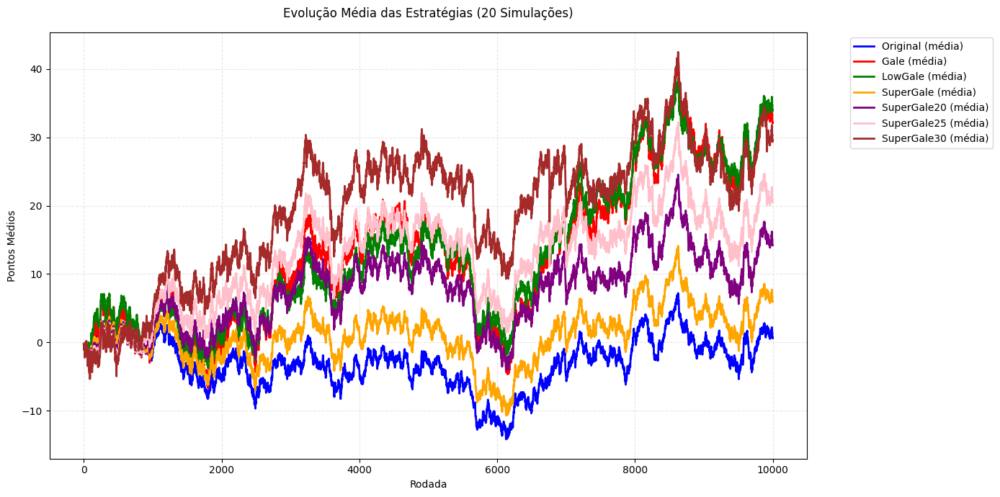

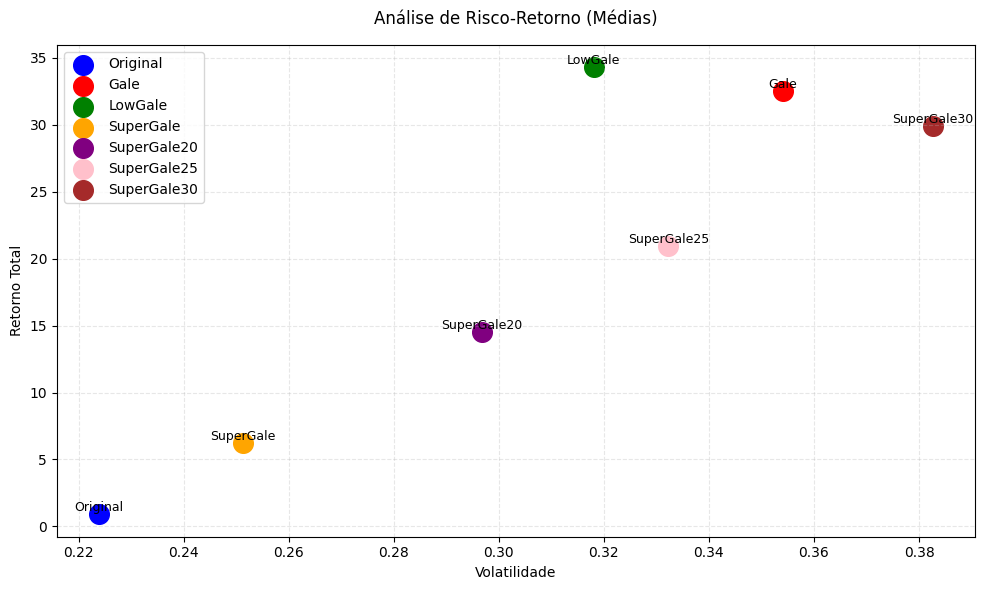

In [84]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

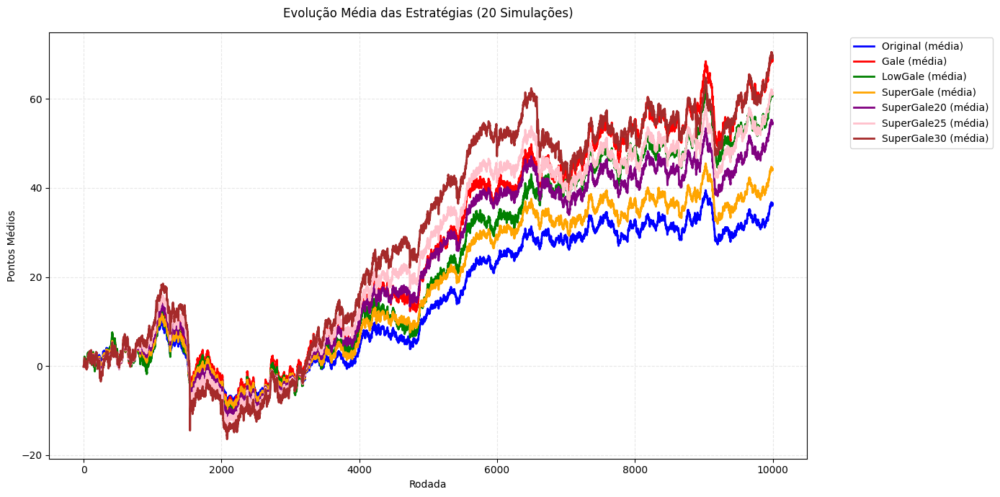

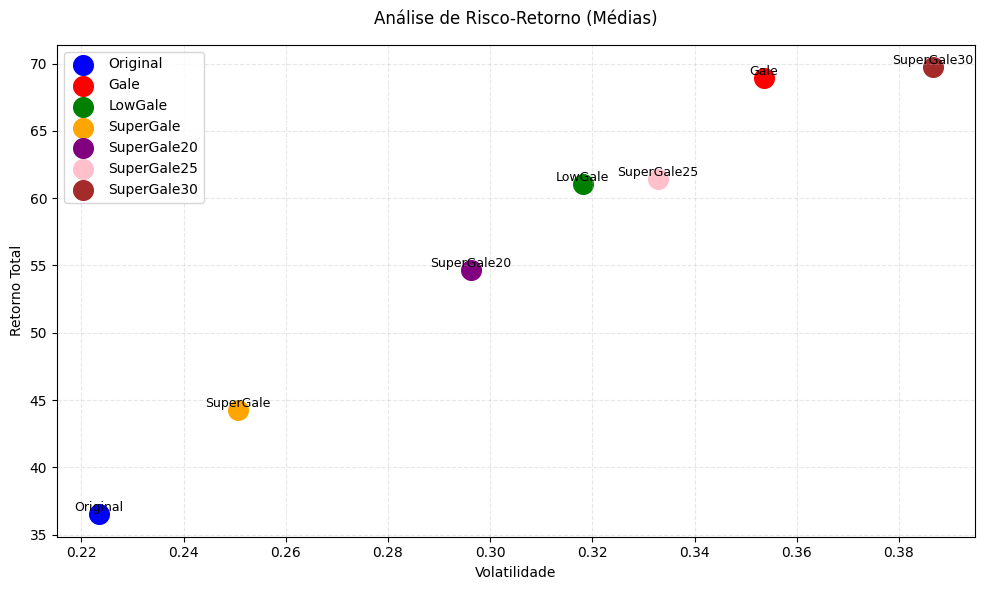

In [85]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 10000
num_simulacoes = 20
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

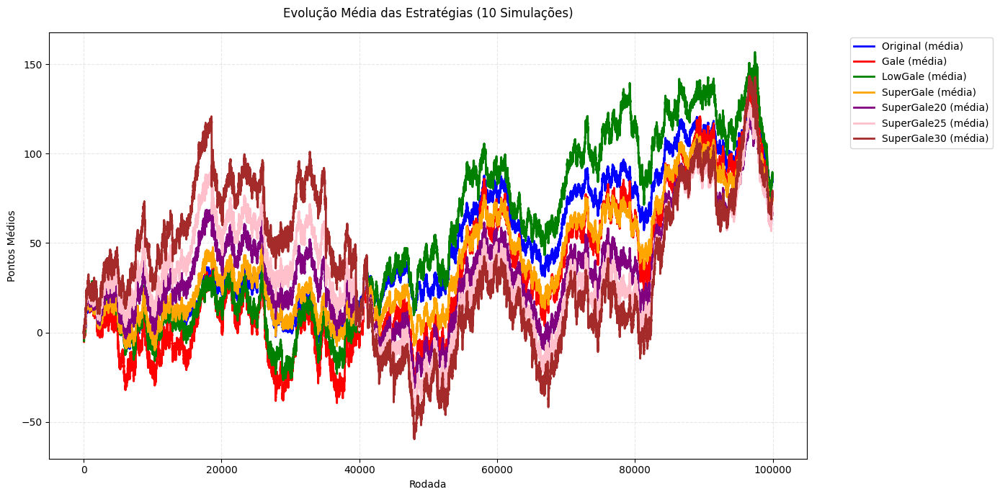

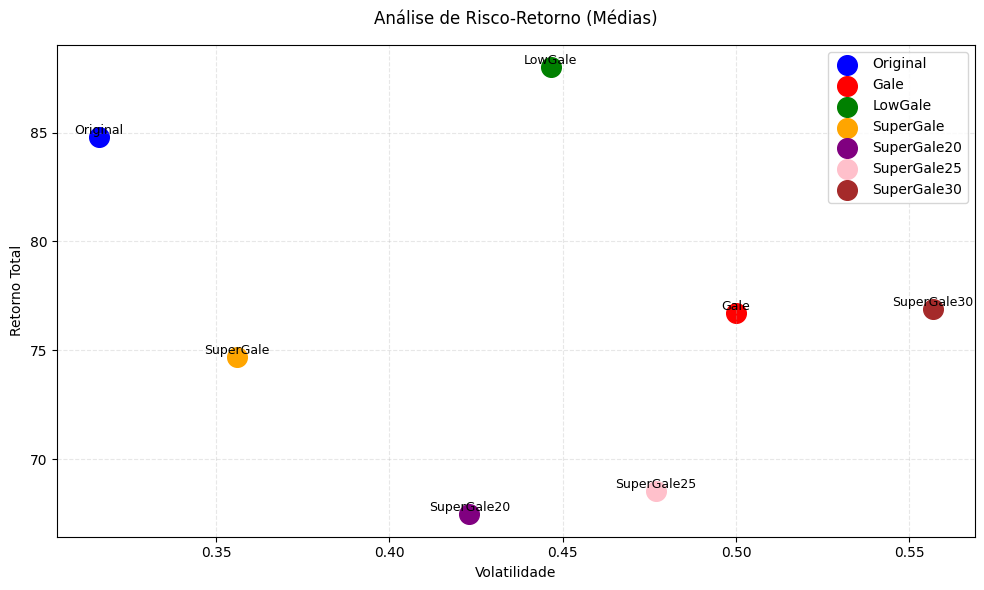

In [86]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_cara = 1
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

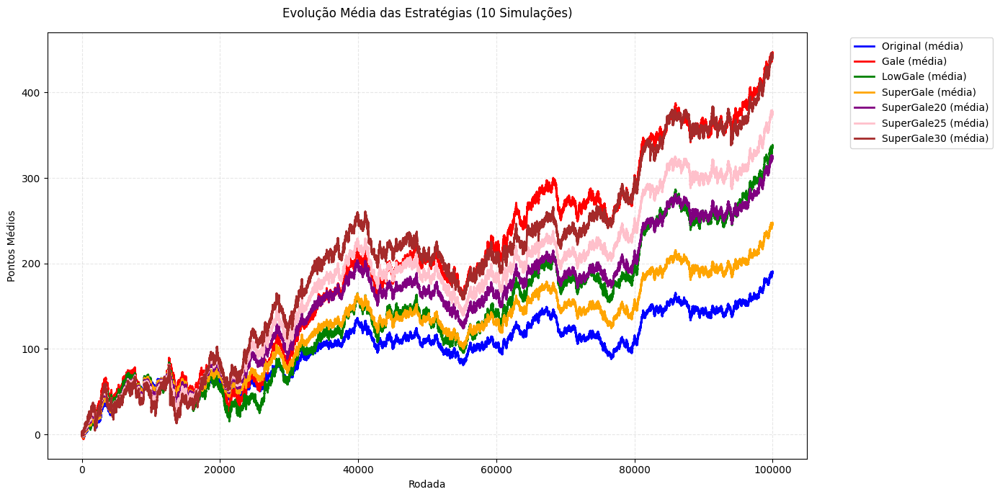

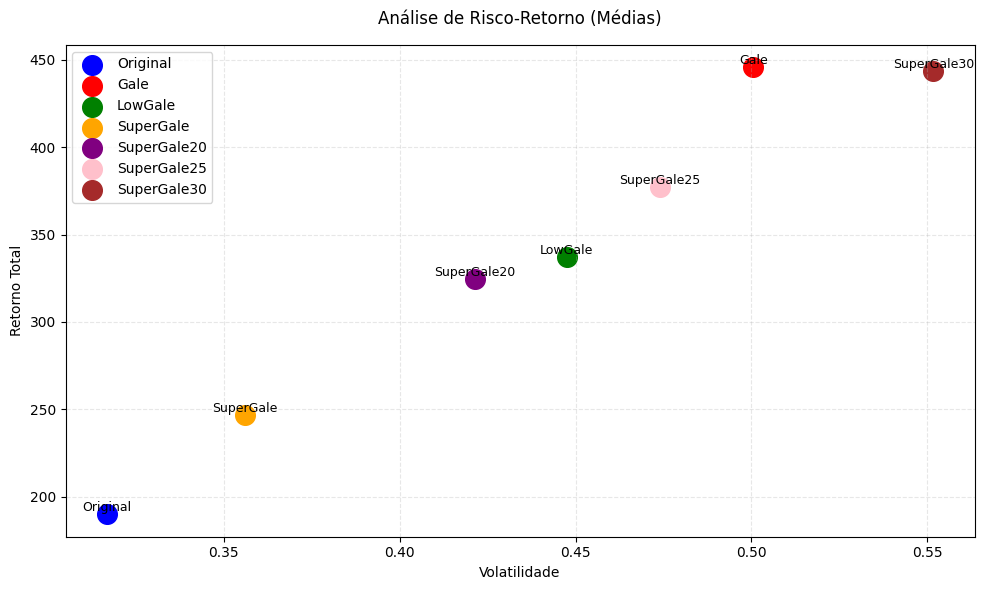

In [87]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_cara = 1.005
ponto_coroa = -1

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_cara if resultado < 0.5 else ponto_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = ['Original', 'Gale', 'LowGale', 'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30']
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

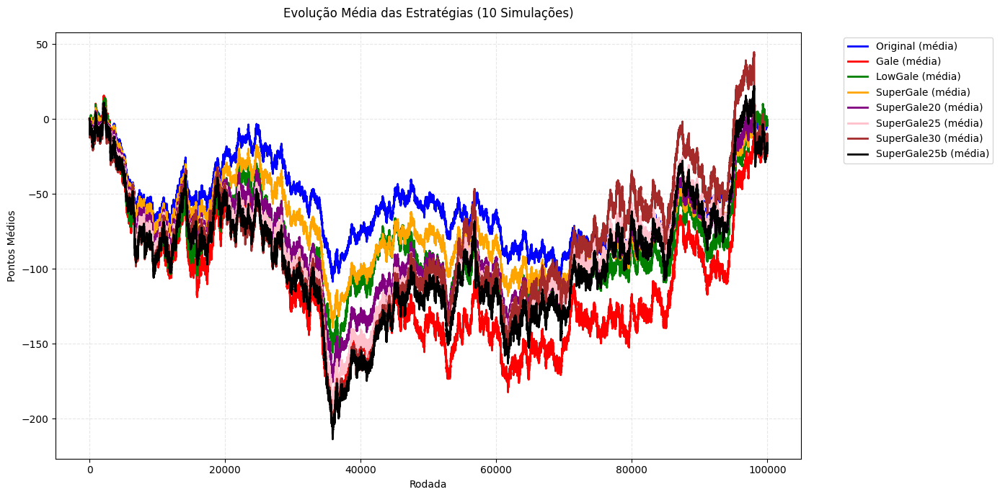

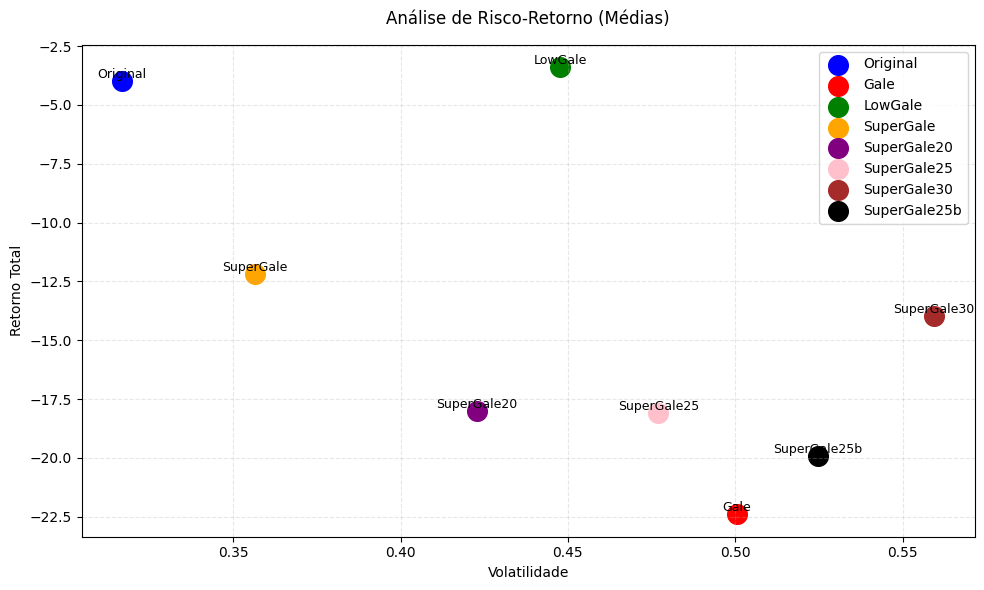

In [89]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.0
ponto_base_coroa = -1.0
bonus_pct = 0.10  # 10% a mais para SuperGale25b
ponto_bonificado_cara = ponto_base_cara * (1 + bonus_pct)
ponto_bonificado_coroa = ponto_base_coroa * (1 + bonus_pct)

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale25b':
                if resultado < 0.5:
                    dados['pontos'] += ponto_bonificado_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_bonificado_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale25b'
]
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale25b': 'black'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

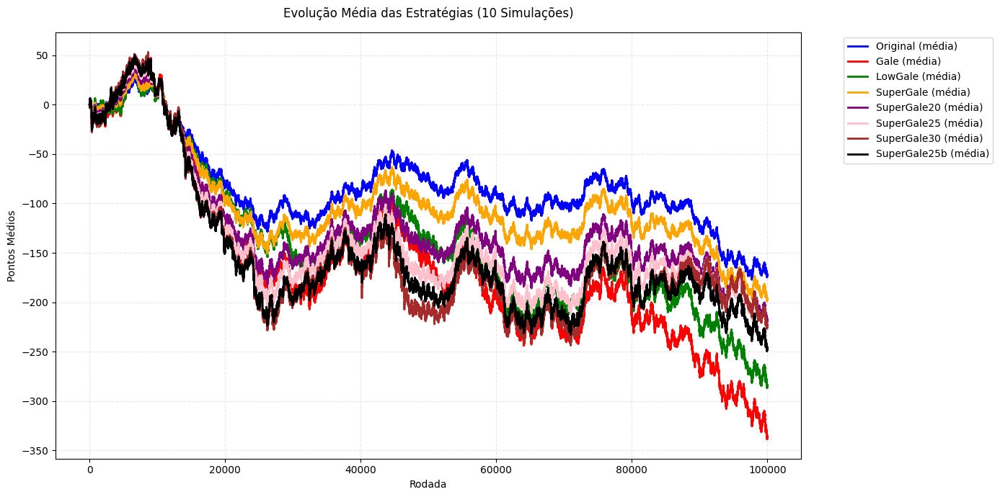

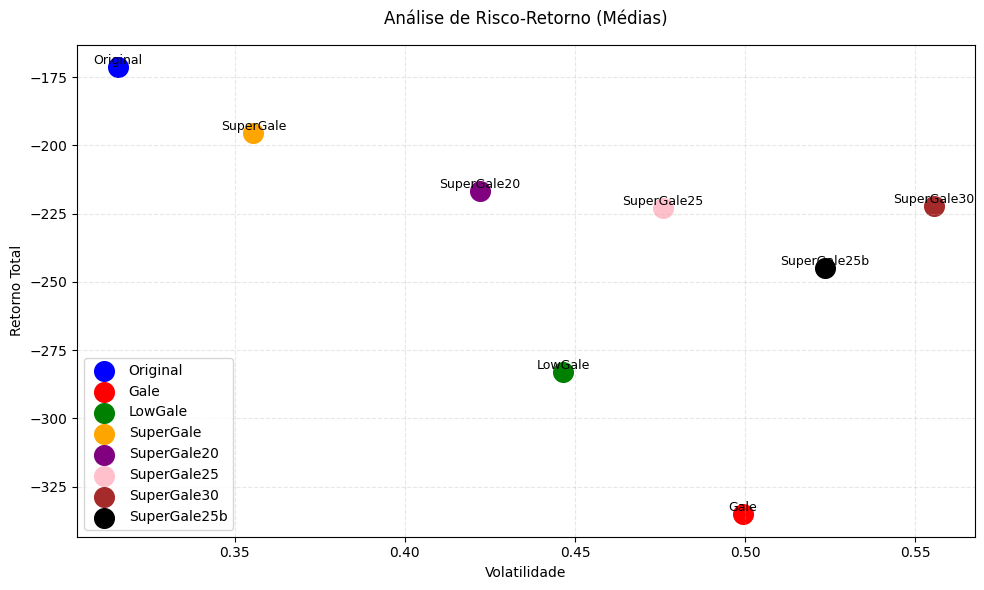

In [90]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.0
ponto_base_coroa = -1.0
bonus_pct = 0.10  # 10% a mais para SuperGale25b
ponto_bonificado_cara = ponto_base_cara * (1 + bonus_pct)
ponto_bonificado_coroa = ponto_base_coroa * (1 + bonus_pct)

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale25b':
                if resultado < 0.5:
                    dados['pontos'] += ponto_bonificado_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_bonificado_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale25b'
]
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale25b': 'black'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

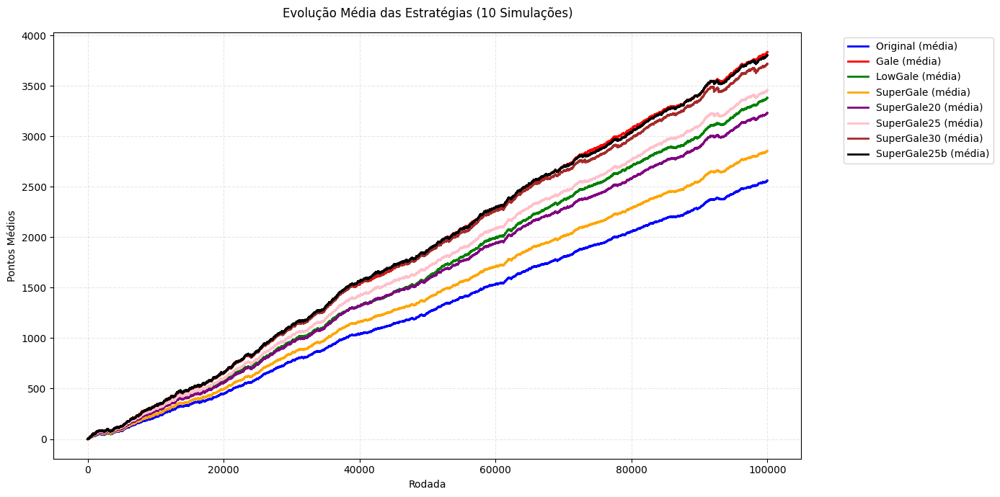

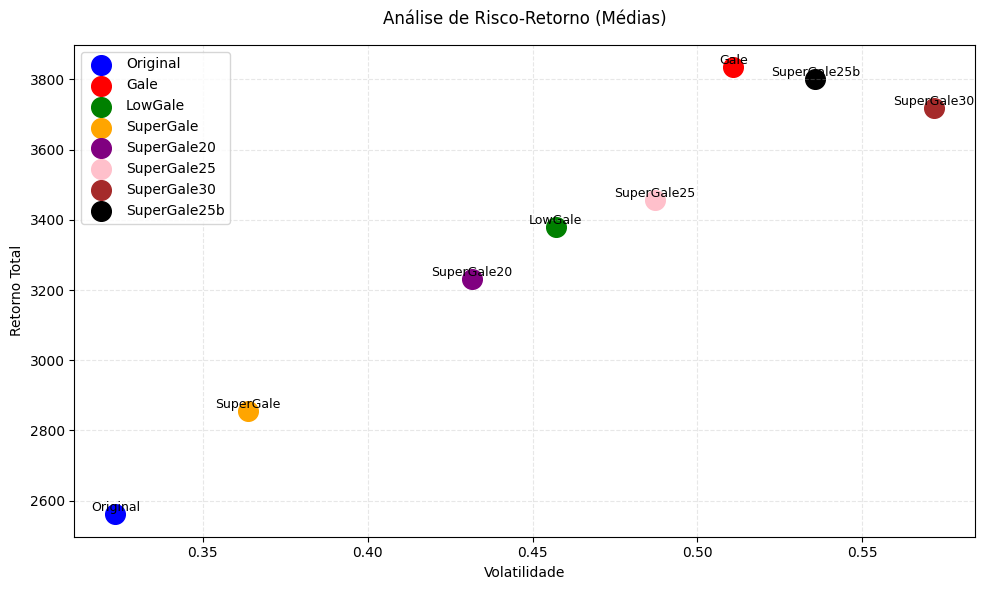

In [91]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.05
ponto_base_coroa = -1.0
bonus_pct = 0.10  # 10% a mais para SuperGale25b
ponto_bonificado_cara = ponto_base_cara * (1 + bonus_pct)
ponto_bonificado_coroa = ponto_base_coroa * (1 + bonus_pct)

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale25b':
                if resultado < 0.5:
                    dados['pontos'] += ponto_bonificado_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_bonificado_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale25b'
]
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale25b': 'black'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


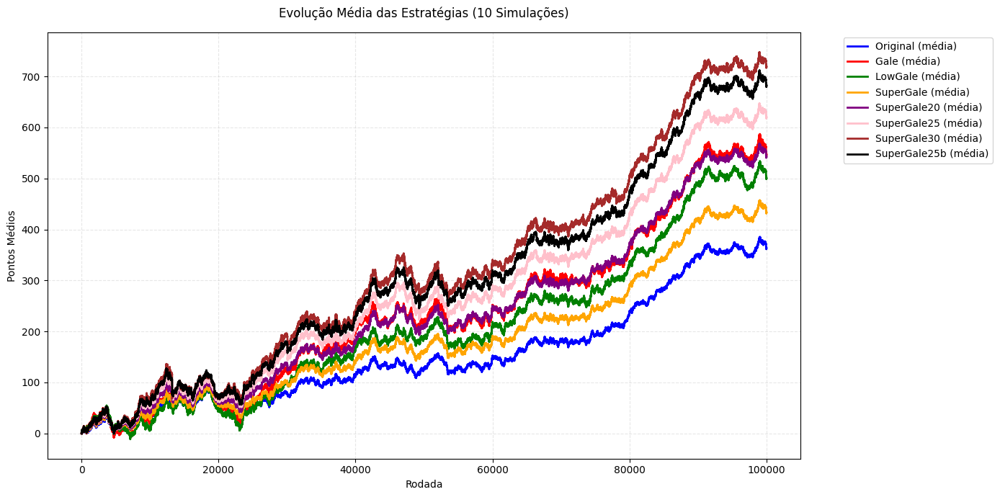

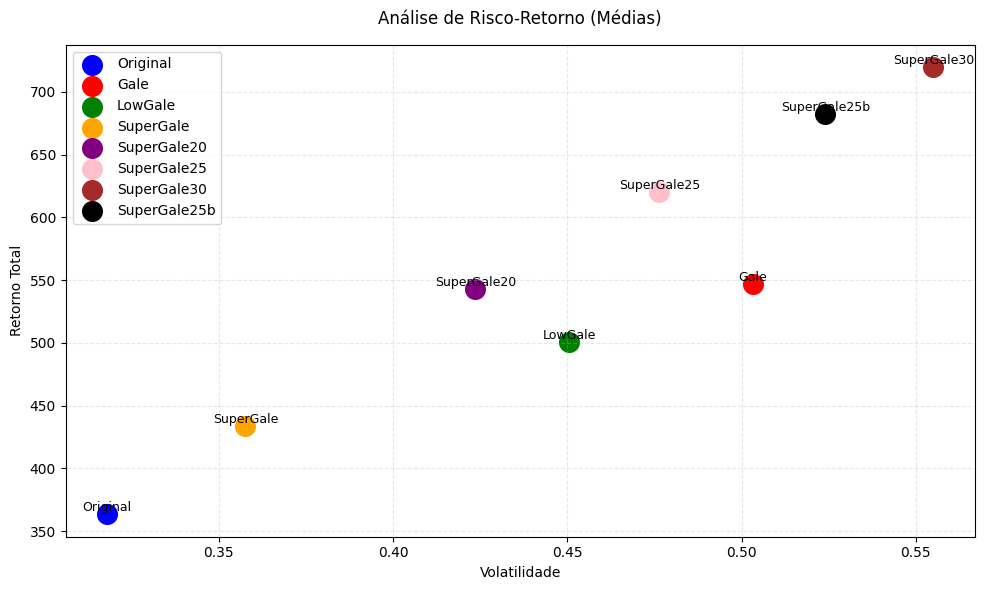

In [92]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.01
ponto_base_coroa = -1.0
bonus_pct = 0.10  # 10% a mais para SuperGale25b
ponto_bonificado_cara = ponto_base_cara * (1 + bonus_pct)
ponto_bonificado_coroa = ponto_base_coroa * (1 + bonus_pct)

# Função que executa uma simulação e retorna a evolução das estratégias
def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25}
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'SuperGale25b':
                if resultado < 0.5:
                    dados['pontos'] += ponto_bonificado_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_bonificado_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Executa várias simulações e acumula os resultados
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale25b'
]
resultados_simulados = {nome: [] for nome in nomes_estrategias}

for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Calcula a média de cada estratégia
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Gráfico 1: Média das Estratégias
plt.figure(figsize=(14, 7))
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale25b': 'black'
}

for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)

plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)', pad=15)
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco-Retorno da MÉDIA
plt.figure(figsize=(10, 6))

for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')

plt.title('Análise de Risco-Retorno (Médias)', pad=15)
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

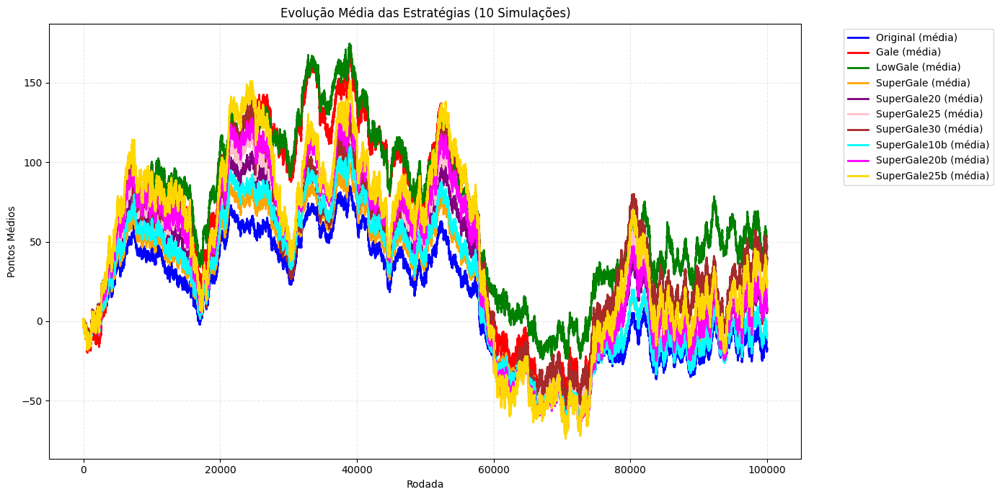

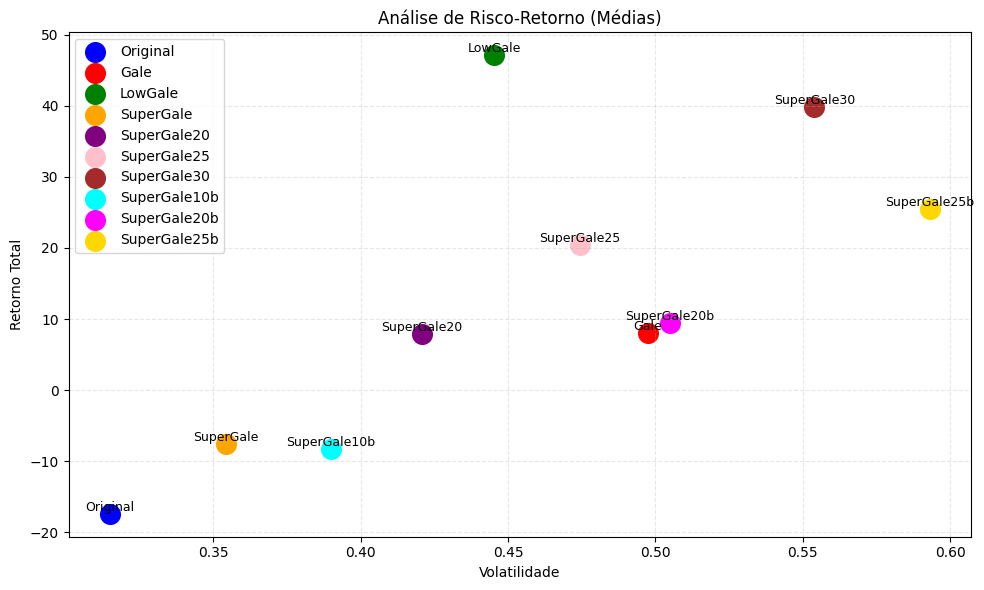

In [93]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.0
ponto_base_coroa = -1.0

# Parâmetros de bônus
bonus_pct_estrategias = {
    'SuperGale10b': 0.10,
    'SuperGale20b': 0.20,
    'SuperGale25b': 0.25,
}

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale10b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            ponto_cara = ponto_base_cara
            ponto_coroa = ponto_base_coroa

            if nome in bonus_pct_estrategias:
                bonus = bonus_pct_estrategias[nome]
                ponto_cara *= (1 + bonus)
                ponto_coroa *= (1 + bonus)

            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}


# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale10b', 'SuperGale20b', 'SuperGale25b'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale10b': 'cyan',
    'SuperGale20b': 'magenta',
    'SuperGale25b': 'gold'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

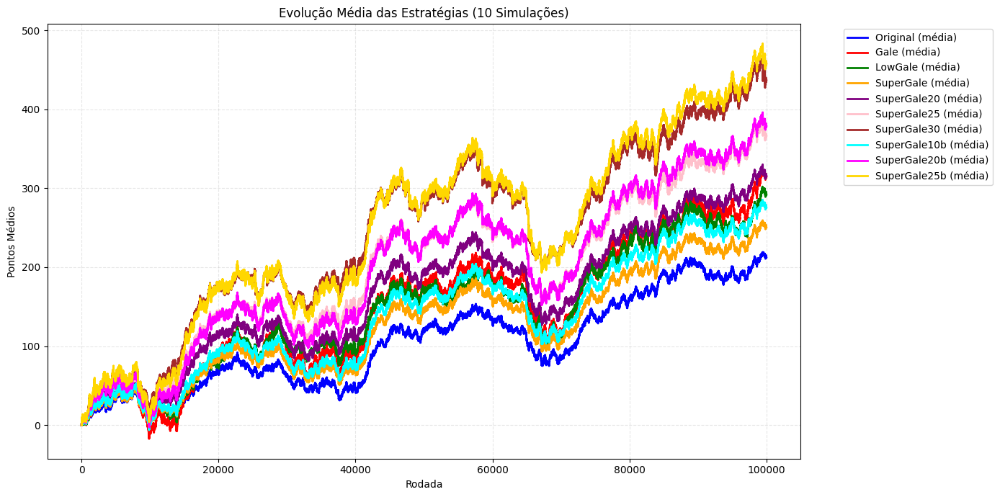

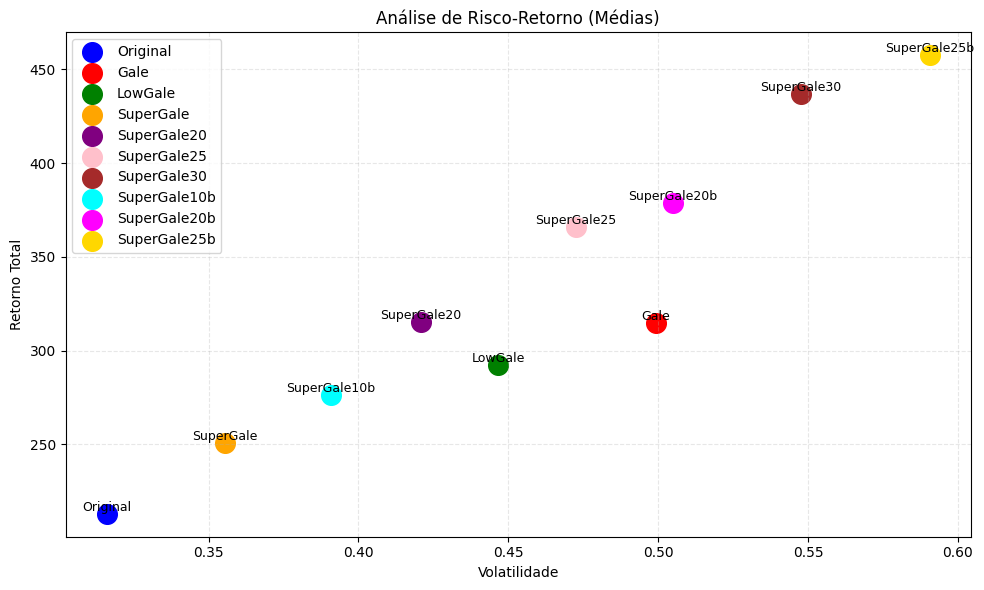

In [94]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.005
ponto_base_coroa = -1.0

# Parâmetros de bônus
bonus_pct_estrategias = {
    'SuperGale10b': 0.10,
    'SuperGale20b': 0.20,
    'SuperGale25b': 0.25,
}

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale10b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            ponto_cara = ponto_base_cara
            ponto_coroa = ponto_base_coroa

            if nome in bonus_pct_estrategias:
                bonus = bonus_pct_estrategias[nome]
                ponto_cara *= (1 + bonus)
                ponto_coroa *= (1 + bonus)

            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}


# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale10b', 'SuperGale20b', 'SuperGale25b'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale10b': 'cyan',
    'SuperGale20b': 'magenta',
    'SuperGale25b': 'gold'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

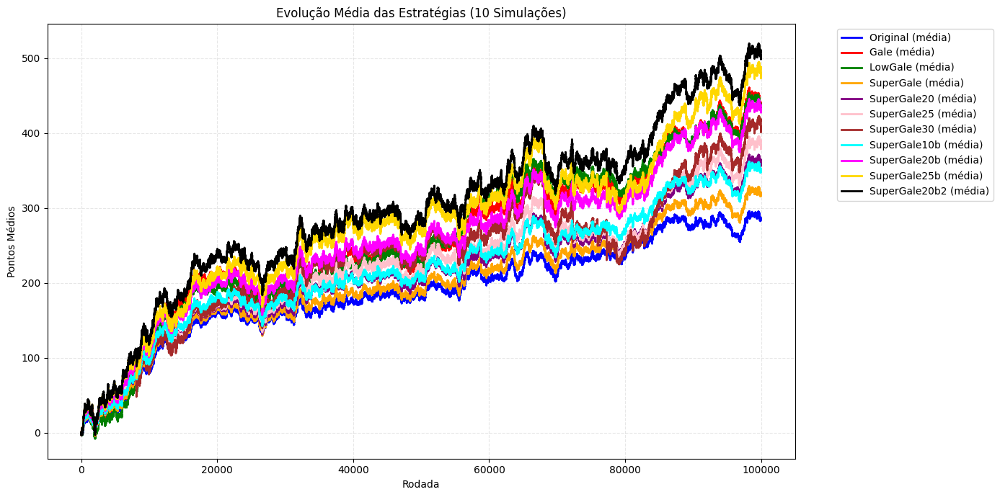

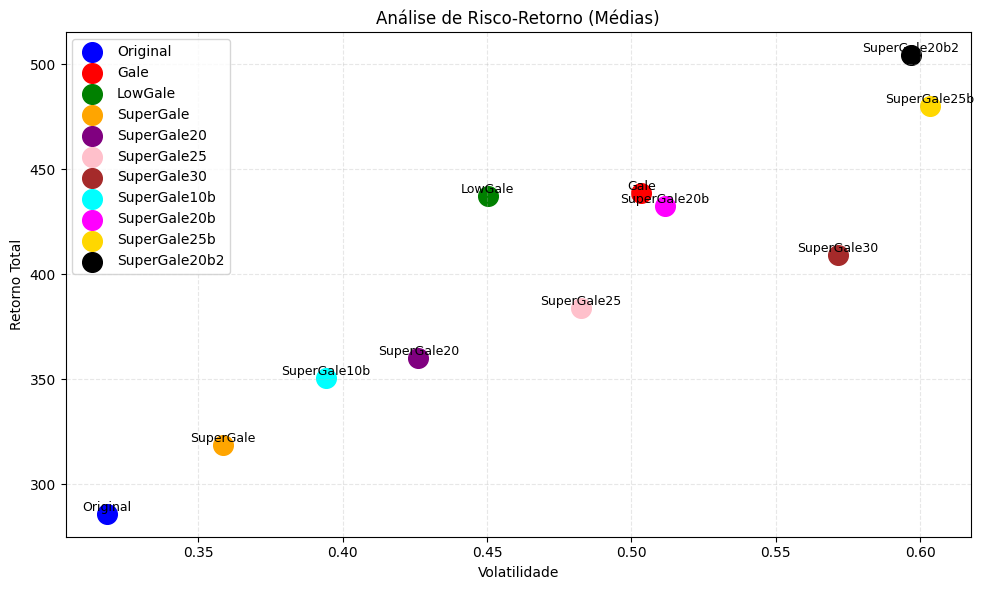

In [95]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.005
ponto_base_coroa = -1.0

# Parâmetros de bônus
bonus_pct_estrategias = {
    'SuperGale10b': 0.10,
    'SuperGale20b': 0.20,
    'SuperGale25b': 0.25,
    'SuperGale20b2': 0.40  # Dobro do bônus do 20b
}

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale10b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale20b2': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            ponto_cara = ponto_base_cara
            ponto_coroa = ponto_base_coroa

            if nome in bonus_pct_estrategias:
                bonus = bonus_pct_estrategias[nome]
                ponto_cara *= (1 + bonus)
                ponto_coroa *= (1 + bonus)

            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}


# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale10b', 'SuperGale20b', 'SuperGale25b', 'SuperGale20b2'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale10b': 'cyan',
    'SuperGale20b': 'magenta',
    'SuperGale25b': 'gold',
    'SuperGale20b2': 'black'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

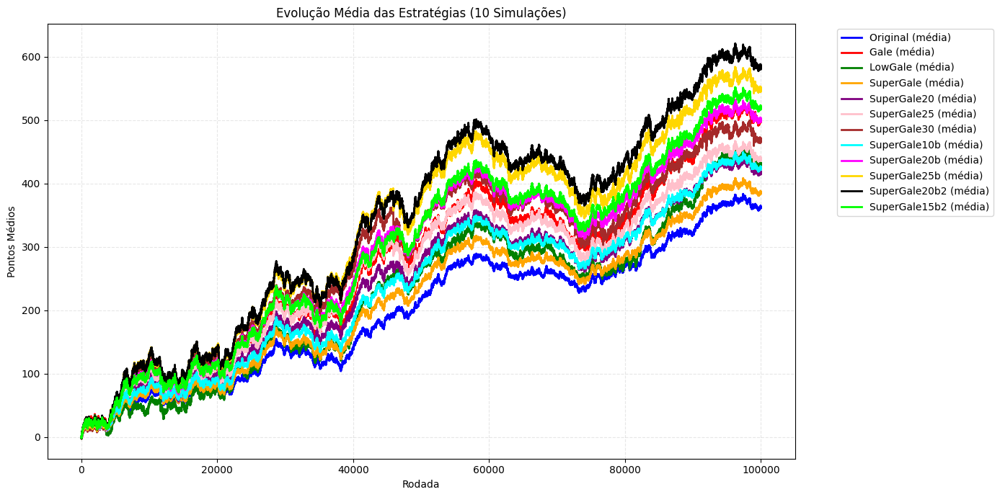

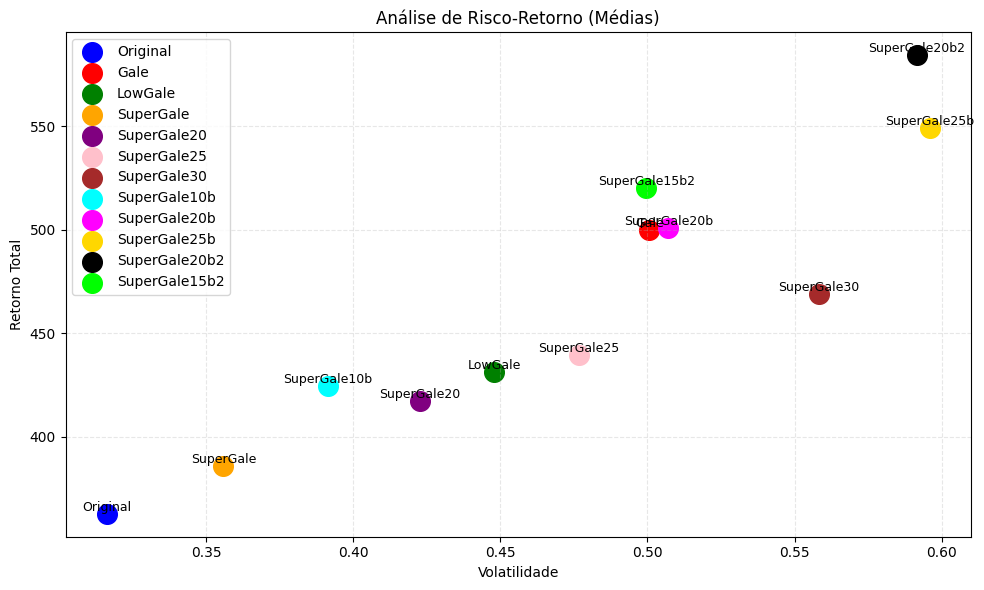

In [96]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.005
ponto_base_coroa = -1.0

# Parâmetros de bônus
bonus_pct_estrategias = {
    'SuperGale10b': 0.10,
    'SuperGale20b': 0.20,
    'SuperGale25b': 0.25,
    'SuperGale20b2': 0.40,
    'SuperGale15b2': 0.30  # Novo bônus: dobro do 15%
}

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale10b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale20b2': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale15b2': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},  # Nova estratégia
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            ponto_cara = ponto_base_cara
            ponto_coroa = ponto_base_coroa

            if nome in bonus_pct_estrategias:
                bonus = bonus_pct_estrategias[nome]
                ponto_cara *= (1 + bonus)
                ponto_coroa *= (1 + bonus)

            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale10b', 'SuperGale20b', 'SuperGale25b',
    'SuperGale20b2', 'SuperGale15b2'  # Adicionado
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale10b': 'cyan',
    'SuperGale20b': 'magenta',
    'SuperGale25b': 'gold',
    'SuperGale20b2': 'black',
    'SuperGale15b2': 'lime'  # Nova cor
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

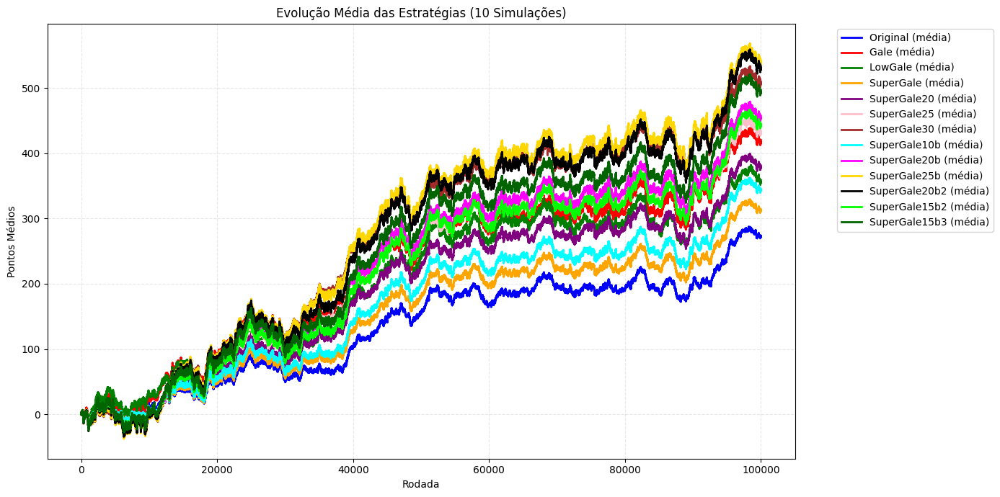

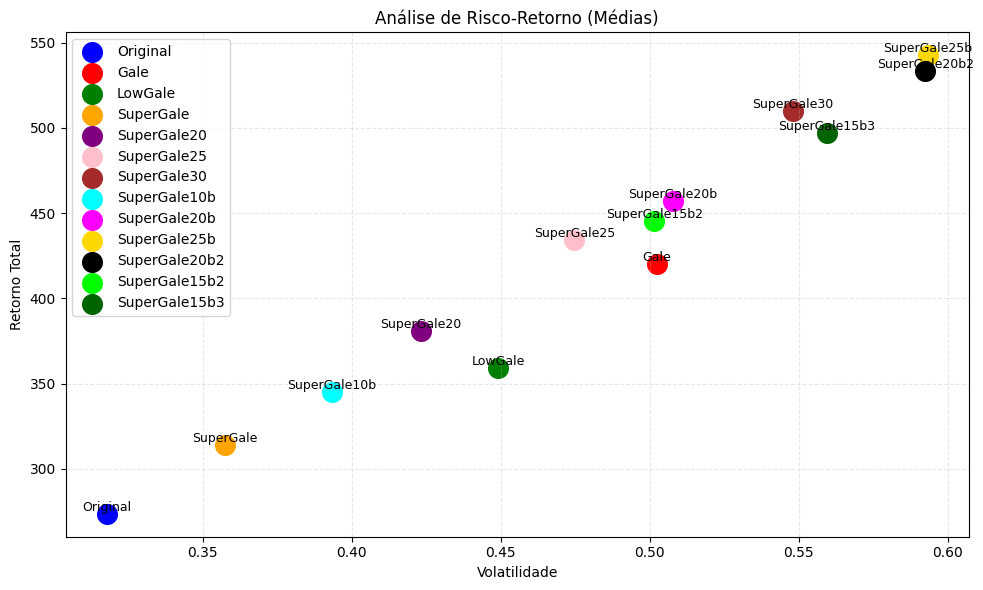

In [97]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.005
ponto_base_coroa = -1.0

# Parâmetros de bônus
bonus_pct_estrategias = {
    'SuperGale10b': 0.10,
    'SuperGale20b': 0.20,
    'SuperGale25b': 0.25,
    'SuperGale20b2': 0.40,
    'SuperGale15b2': 0.30,
    'SuperGale15b3': 0.45  # Novo bônus: triplo do 15%
}

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale10b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale20b2': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale15b2': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},
        'SuperGale15b3': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},  # Nova estratégia
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            ponto_cara = ponto_base_cara
            ponto_coroa = ponto_base_coroa

            if nome in bonus_pct_estrategias:
                bonus = bonus_pct_estrategias[nome]
                ponto_cara *= (1 + bonus)
                ponto_coroa *= (1 + bonus)

            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale10b', 'SuperGale20b', 'SuperGale25b',
    'SuperGale20b2', 'SuperGale15b2', 'SuperGale15b3'  # Nova
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale10b': 'cyan',
    'SuperGale20b': 'magenta',
    'SuperGale25b': 'gold',
    'SuperGale20b2': 'black',
    'SuperGale15b2': 'lime',
    'SuperGale15b3': 'darkgreen'  # Nova cor
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

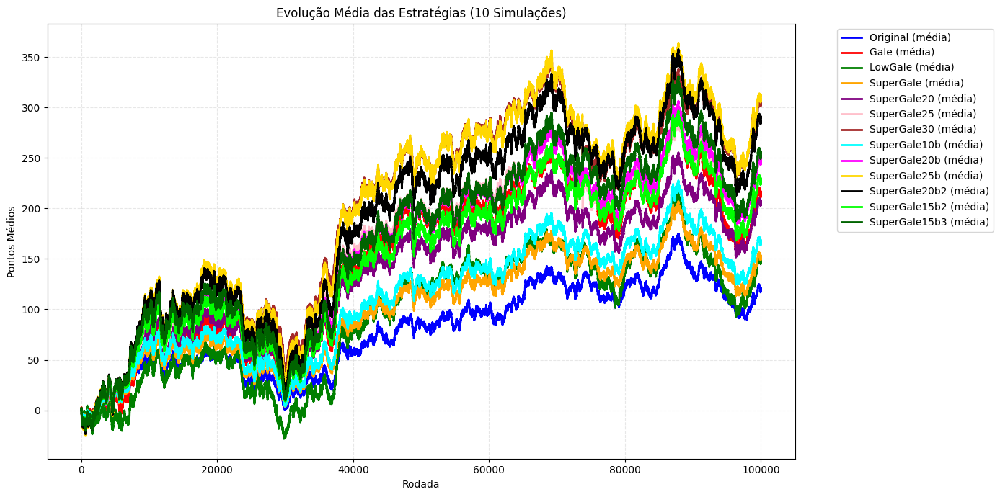

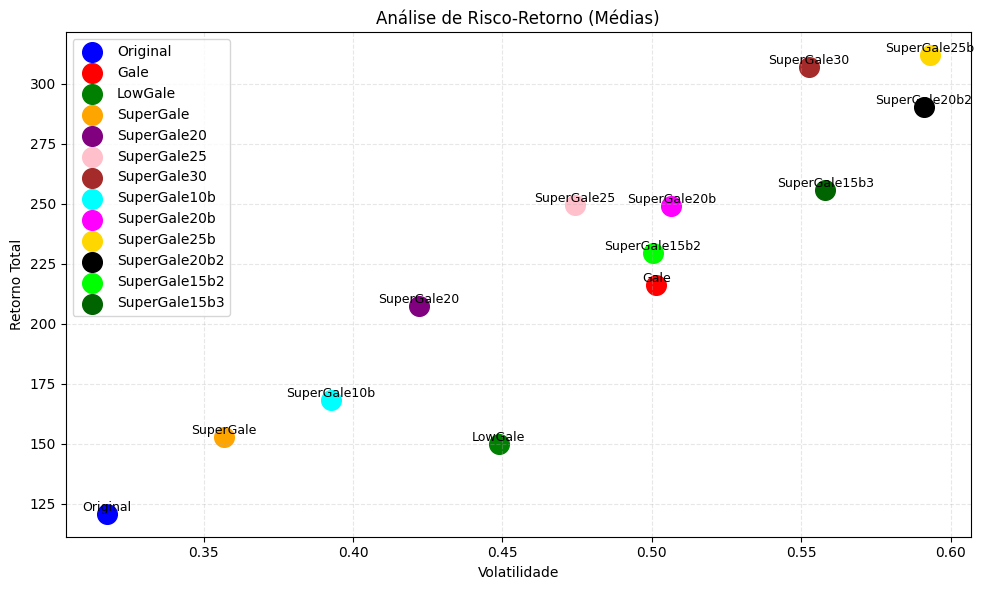

In [98]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.0
ponto_base_coroa = -1.0

# Parâmetros de bônus
bonus_pct_estrategias = {
    'SuperGale10b': 0.10,
    'SuperGale20b': 0.20,
    'SuperGale25b': 0.25,
    'SuperGale20b2': 0.40,
    'SuperGale15b2': 0.30,
    'SuperGale15b3': 0.45  # Novo bônus: triplo do 15%
}

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale10b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25b': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale20b2': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale15b2': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},
        'SuperGale15b3': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},  # Nova estratégia
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            ponto_cara = ponto_base_cara
            ponto_coroa = ponto_base_coroa

            if nome in bonus_pct_estrategias:
                bonus = bonus_pct_estrategias[nome]
                ponto_cara *= (1 + bonus)
                ponto_coroa *= (1 + bonus)

            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale10b', 'SuperGale20b', 'SuperGale25b',
    'SuperGale20b2', 'SuperGale15b2', 'SuperGale15b3'  # Nova
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale10b': 'cyan',
    'SuperGale20b': 'magenta',
    'SuperGale25b': 'gold',
    'SuperGale20b2': 'black',
    'SuperGale15b2': 'lime',
    'SuperGale15b3': 'darkgreen'  # Nova cor
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

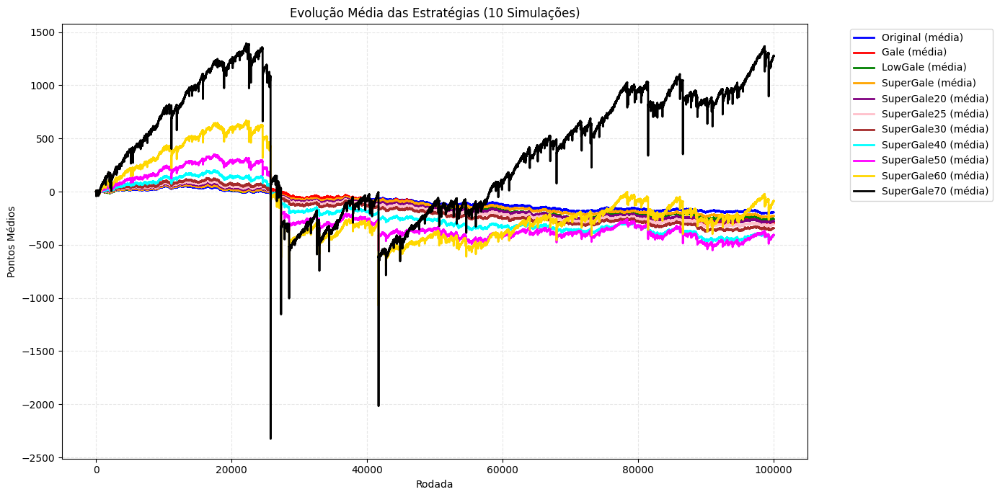

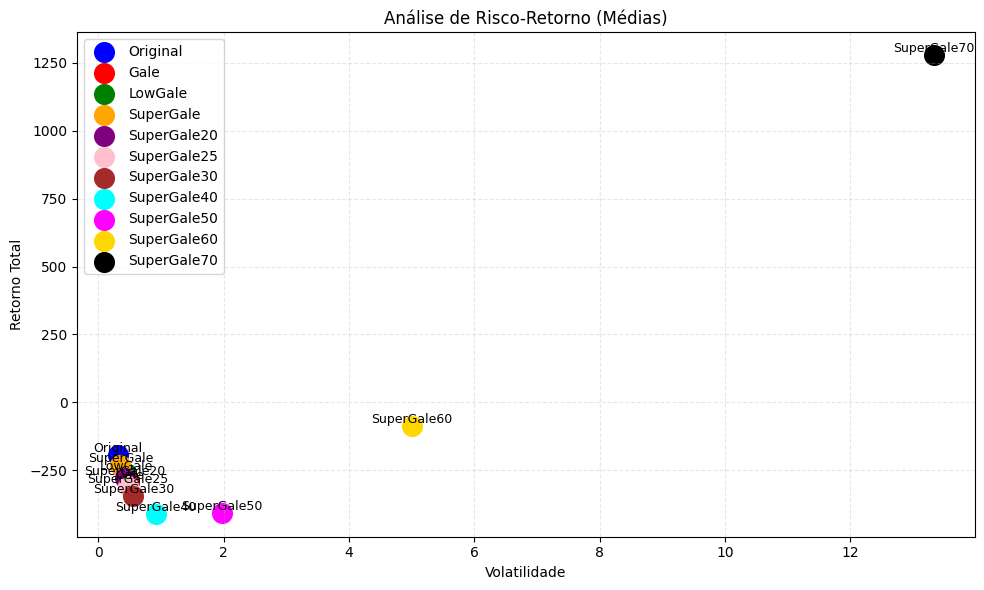

In [99]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 10
ponto_base_cara = 1.0
ponto_base_coroa = -1.0

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale40': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.4},
        'SuperGale50': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.5},
        'SuperGale60': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.6},
        'SuperGale70': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.7},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale40', 'SuperGale50', 'SuperGale60', 'SuperGale70'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale40': 'cyan',
    'SuperGale50': 'magenta',
    'SuperGale60': 'gold',
    'SuperGale70': 'black'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

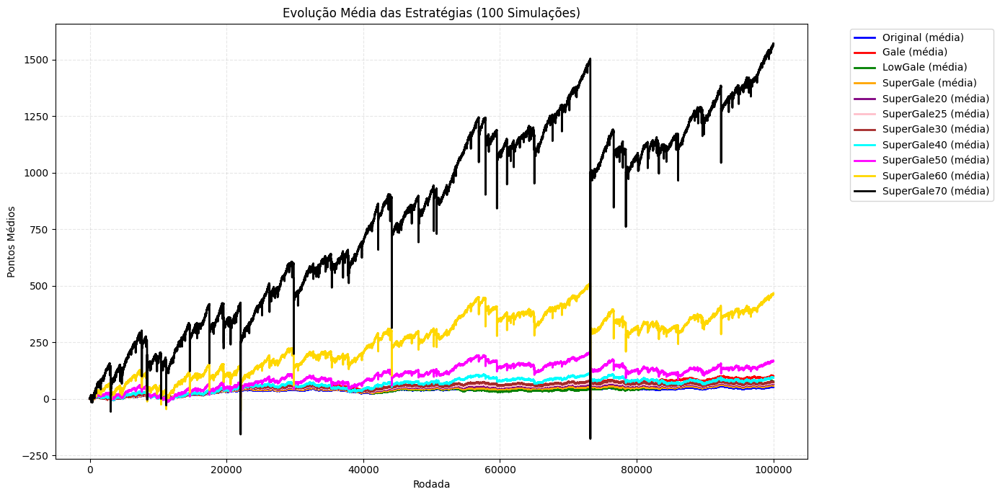

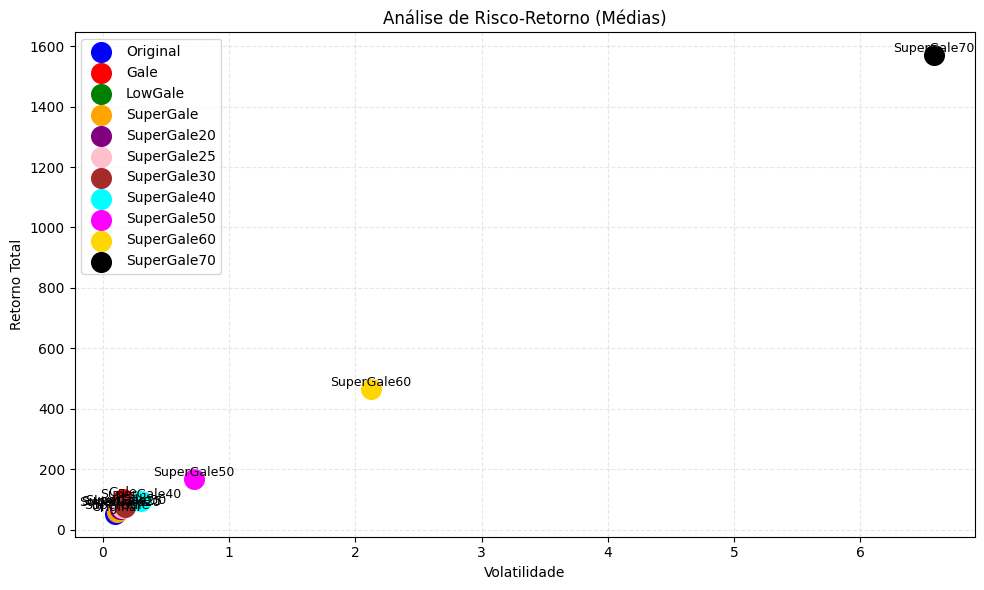

In [100]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 100000
num_simulacoes = 100
ponto_base_cara = 1.001
ponto_base_coroa = -1.0

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale40': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.4},
        'SuperGale50': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.5},
        'SuperGale60': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.6},
        'SuperGale70': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.7},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale40', 'SuperGale50', 'SuperGale60', 'SuperGale70'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale40': 'cyan',
    'SuperGale50': 'magenta',
    'SuperGale60': 'gold',
    'SuperGale70': 'black'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

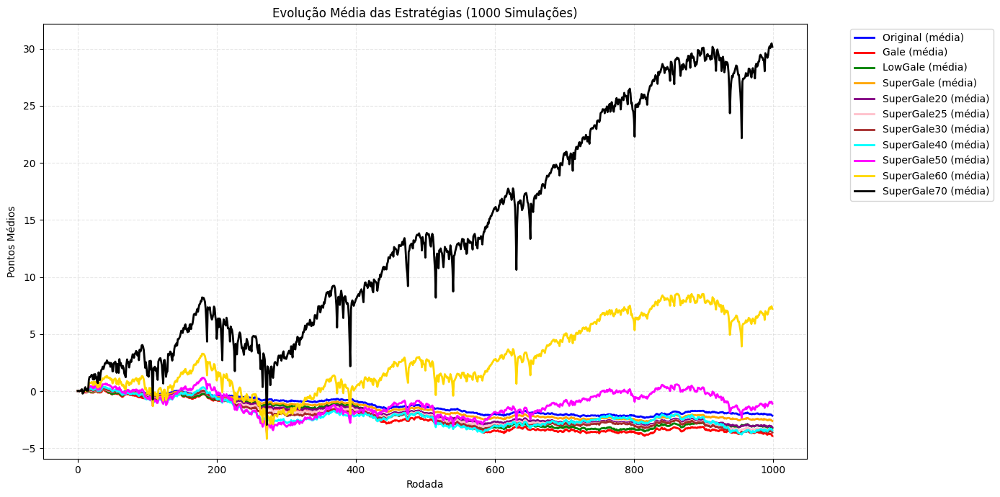

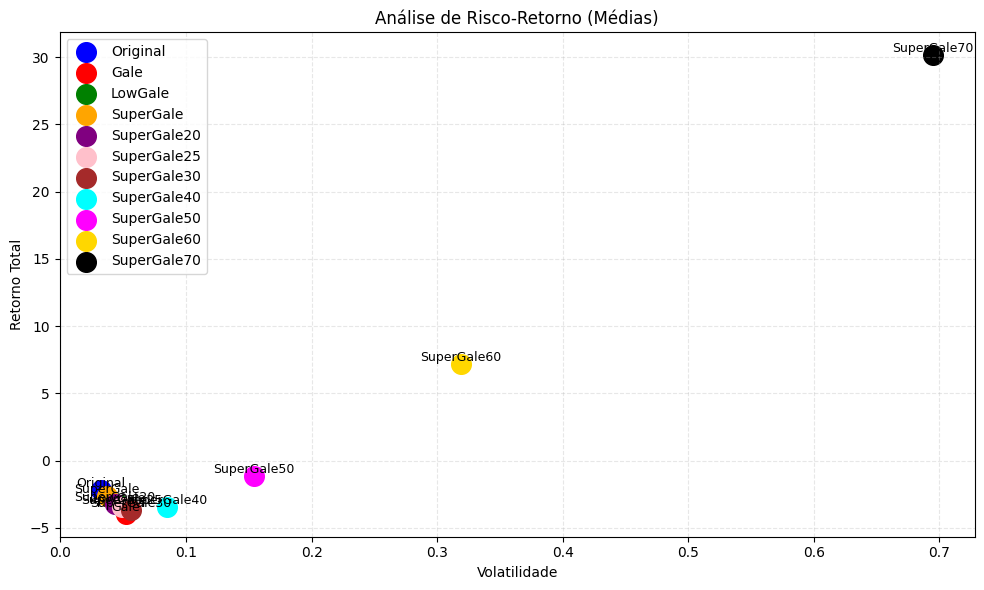

In [101]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 1000
num_simulacoes = 1000
ponto_base_cara = 1.0
ponto_base_coroa = -1.0

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale40': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.4},
        'SuperGale50': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.5},
        'SuperGale60': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.6},
        'SuperGale70': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.7},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale20', 'SuperGale25', 'SuperGale30',
    'SuperGale40', 'SuperGale50', 'SuperGale60', 'SuperGale70'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale40': 'cyan',
    'SuperGale50': 'magenta',
    'SuperGale60': 'gold',
    'SuperGale70': 'black'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

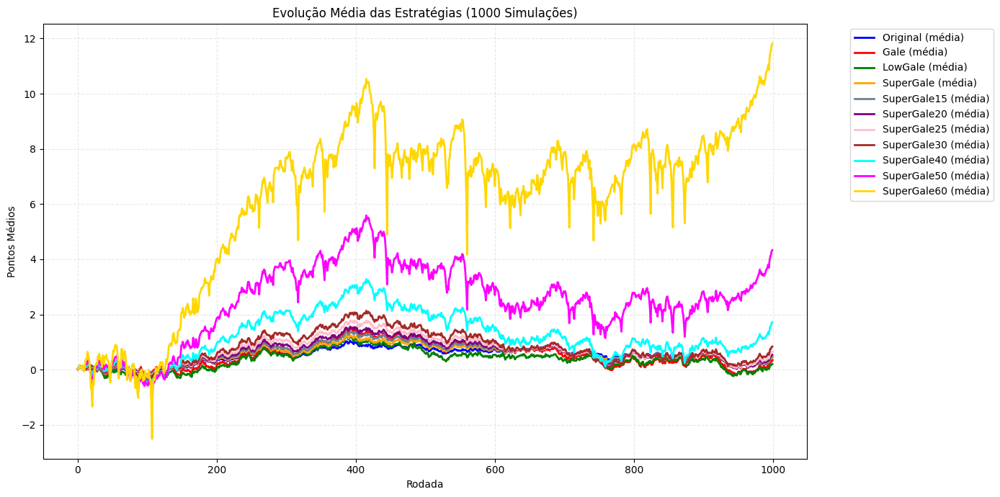

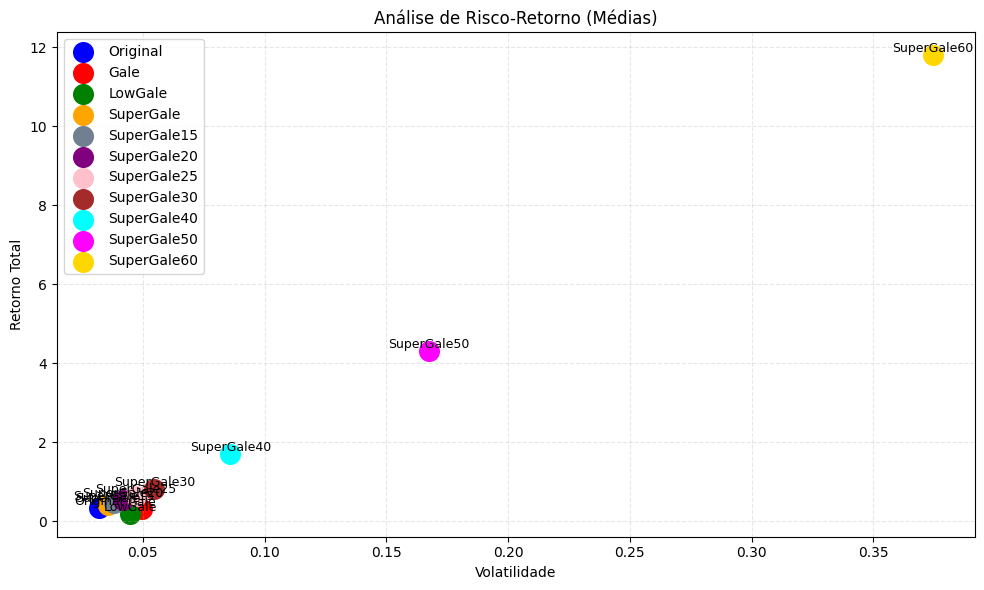

In [102]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 1000
num_simulacoes = 1000
ponto_base_cara = 1.0
ponto_base_coroa = -1.0

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale15': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale40': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.4},
        'SuperGale50': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.5},
        'SuperGale60': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.6},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale15', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale40', 'SuperGale50', 'SuperGale60'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale15': 'slategray',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale40': 'cyan',
    'SuperGale50': 'magenta',
    'SuperGale60': 'gold',
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

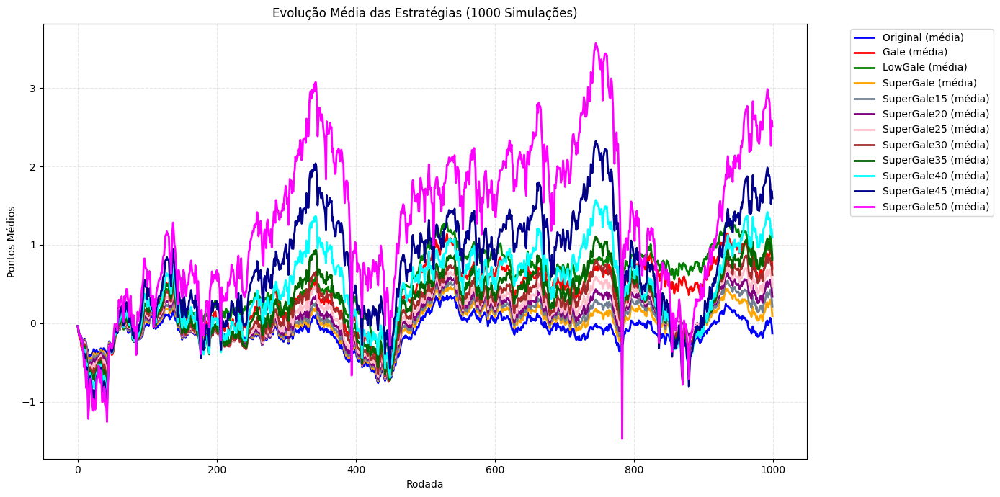

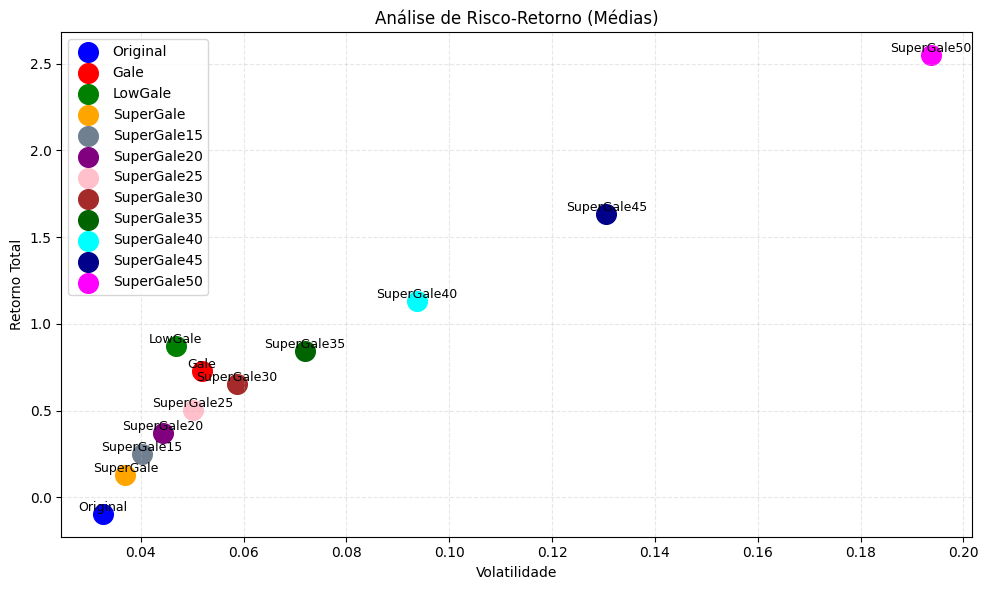

In [103]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 1000
num_simulacoes = 1000
ponto_base_cara = 1.0
ponto_base_coroa = -1.0

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale15': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale35': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.35},
        'SuperGale40': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.4},
        'SuperGale45': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.45},
        'SuperGale50': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.5},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar (atualizadas)
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale15', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale35', 'SuperGale40', 'SuperGale45', 'SuperGale50'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores atualizadas
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale15': 'slategray',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale35': 'darkgreen',  # Nova cor
    'SuperGale40': 'cyan',
    'SuperGale45': 'darkblue',   # Nova cor
    'SuperGale50': 'magenta'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

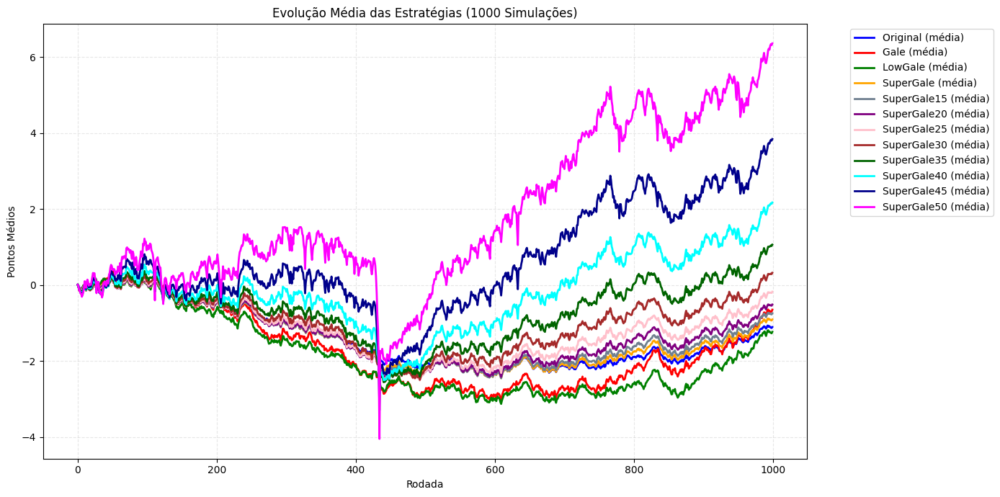

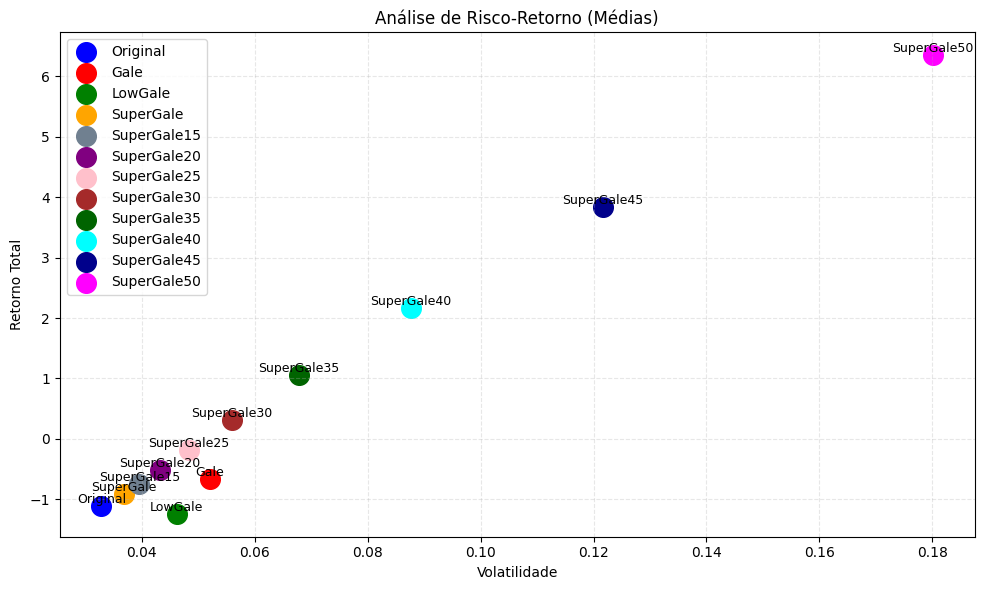

In [104]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 1000
num_simulacoes = 1000
ponto_base_cara = 1.001
ponto_base_coroa = -1.0

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale15': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale35': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.35},
        'SuperGale40': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.4},
        'SuperGale45': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.45},
        'SuperGale50': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.5},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar (atualizadas)
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale15', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale35', 'SuperGale40', 'SuperGale45', 'SuperGale50'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores atualizadas
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale15': 'slategray',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale35': 'darkgreen',  # Nova cor
    'SuperGale40': 'cyan',
    'SuperGale45': 'darkblue',   # Nova cor
    'SuperGale50': 'magenta'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

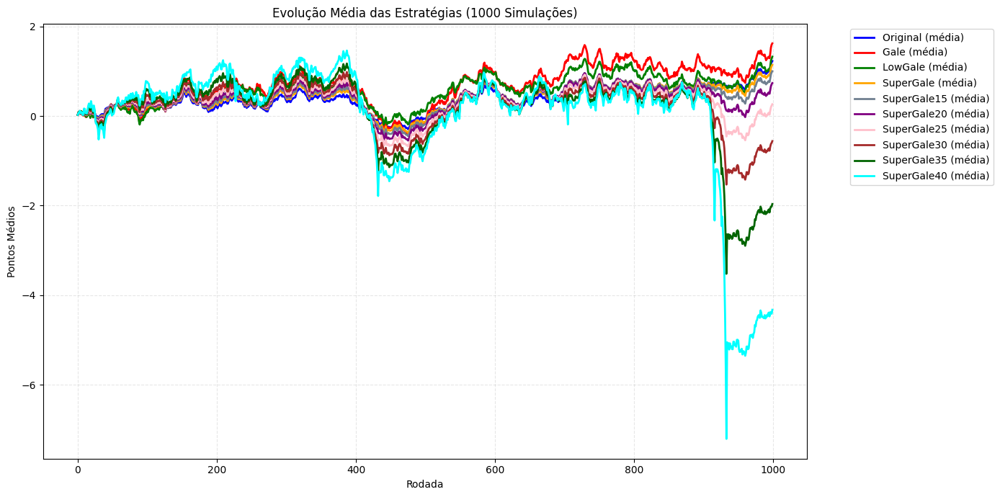

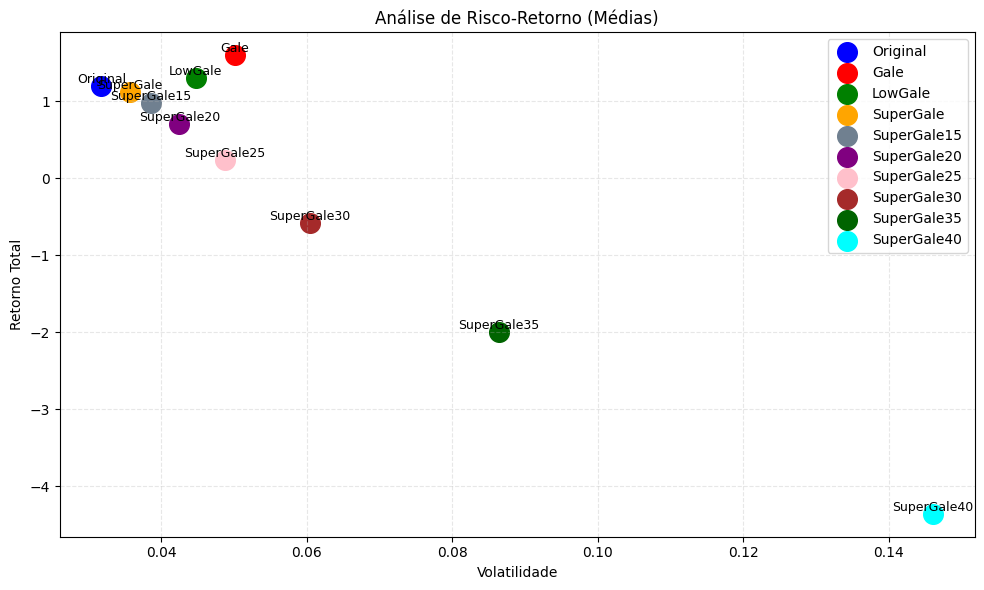

In [105]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 1000
num_simulacoes = 1000
ponto_base_cara = 1.001
ponto_base_coroa = -1.0

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale15': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale35': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.35},
        'SuperGale40': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.4},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar (atualizadas)
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale15', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale35', 'SuperGale40'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores atualizadas
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale15': 'slategray',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale35': 'darkgreen',
    'SuperGale40': 'cyan'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

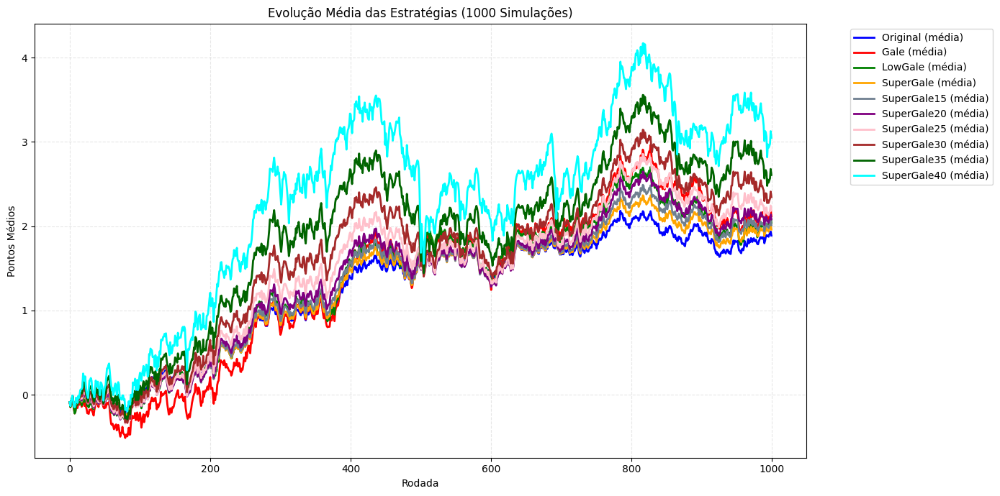

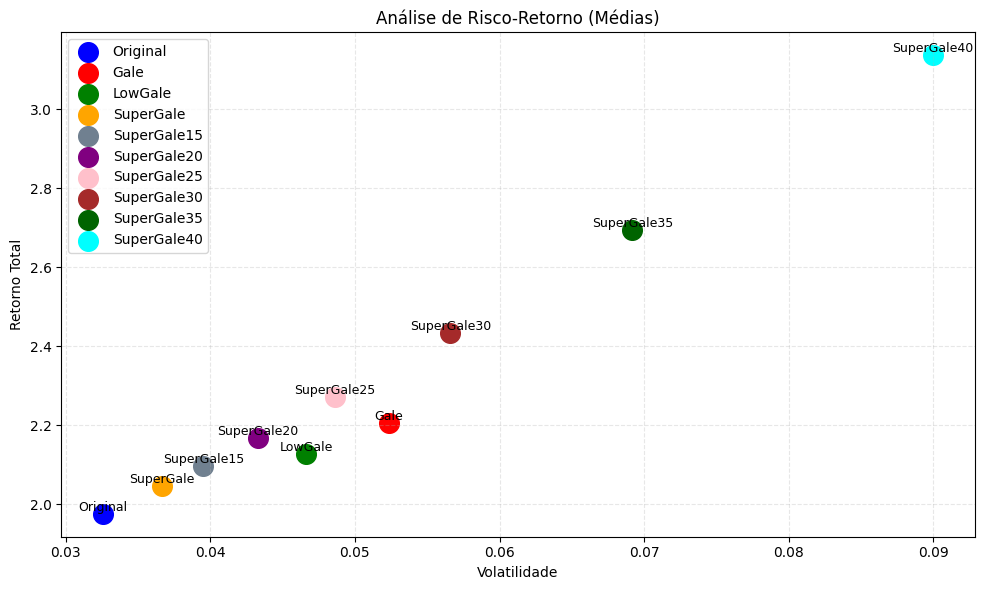

In [106]:
import secrets
import matplotlib.pyplot as plt
import numpy as np

# Configurações
num_rodadas = 1000
num_simulacoes = 1000
ponto_base_cara = 1.001
ponto_base_coroa = -1.0

def simular():
    estrategias = {
        'Original': {'pontos': 0, 'evolucao': []},
        'Gale': {'pontos': 0, 'evolucao': [], 'mult': 1},
        'LowGale': {'pontos': 0, 'evolucao': [], 'mult': 1, 'perdeu_ultima': False},
        'SuperGale': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.1},
        'SuperGale15': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.15},
        'SuperGale20': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.2},
        'SuperGale25': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.25},
        'SuperGale30': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.3},
        'SuperGale35': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.35},
        'SuperGale40': {'pontos': 0, 'evolucao': [], 'peso': 1.0, 'inc': 1.4},
    }

    pontos = 0
    for _ in range(num_rodadas):
        resultado = secrets.SystemRandom().random()
        pontos += ponto_base_cara if resultado < 0.5 else ponto_base_coroa

        for nome, dados in estrategias.items():
            if nome == 'Original':
                dados['pontos'] = pontos
                dados['evolucao'].append(pontos)

            elif nome == 'Gale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    dados['mult'] = 2
                dados['evolucao'].append(dados['pontos'])

            elif nome == 'LowGale':
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['mult']
                    dados['mult'] = 1
                    dados['perdeu_ultima'] = False
                else:
                    dados['pontos'] += ponto_base_coroa * dados['mult']
                    if not dados['perdeu_ultima']:
                        dados['mult'] = 2
                        dados['perdeu_ultima'] = True
                    else:
                        dados['mult'] = 1
                        dados['perdeu_ultima'] = False
                dados['evolucao'].append(dados['pontos'])

            elif nome.startswith('SuperGale'):
                if resultado < 0.5:
                    dados['pontos'] += ponto_base_cara * dados['peso']
                    dados['peso'] = 1.0
                else:
                    dados['pontos'] += ponto_base_coroa * dados['peso']
                    dados['peso'] *= dados['inc']
                dados['evolucao'].append(dados['pontos'])

    return {k: v['evolucao'] for k, v in estrategias.items()}

# Estratégias a comparar (atualizadas)
nomes_estrategias = [
    'Original', 'Gale', 'LowGale',
    'SuperGale', 'SuperGale15', 'SuperGale20', 'SuperGale25',
    'SuperGale30', 'SuperGale35', 'SuperGale40'
]

resultados_simulados = {nome: [] for nome in nomes_estrategias}

# Simulações
for _ in range(num_simulacoes):
    resultado = simular()
    for nome in nomes_estrategias:
        resultados_simulados[nome].append(resultado[nome])

# Médias
medias = {nome: np.mean(resultados_simulados[nome], axis=0) for nome in nomes_estrategias}

# Cores atualizadas
cores = {
    'Original': 'blue',
    'Gale': 'red',
    'LowGale': 'green',
    'SuperGale': 'orange',
    'SuperGale15': 'slategray',
    'SuperGale20': 'purple',
    'SuperGale25': 'pink',
    'SuperGale30': 'brown',
    'SuperGale35': 'darkgreen',
    'SuperGale40': 'cyan'
}

# Gráfico 1: Evolução
plt.figure(figsize=(14, 7))
for nome in medias:
    plt.plot(medias[nome], label=f'{nome} (média)', color=cores[nome], linewidth=2)
plt.title(f'Evolução Média das Estratégias ({num_simulacoes} Simulações)')
plt.xlabel('Rodada')
plt.ylabel('Pontos Médios')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Risco x Retorno
plt.figure(figsize=(10, 6))
for nome in medias:
    retorno = medias[nome][-1] - medias[nome][0]
    volatilidade = np.std(np.diff(medias[nome]))
    plt.scatter(volatilidade, retorno, s=200, color=cores[nome], label=nome)
    plt.text(volatilidade, retorno, nome, fontsize=9, ha='center', va='bottom')
plt.title('Análise de Risco-Retorno (Médias)')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno Total')
plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()